# Обучение с учителем: качество модели

**ПОСТАНОВКА ЗАДАЧИ**

**Заказчик этого исследования** — руководство интернет-магазина «В один клик». 
«В один клик» — современная компания, которая продаёт разные товары: для детей, для дома, мелкую бытовую технику, косметику и даже продукты. Отчеты магазина за прошлый период показали снижение активности покупателей, что спровоцировало необходимость в разработке стратегий по удержанию клиентской базы для поддержания и возможного увеличения покупательской активности.

**Исходные данные:** Предоставлены в четырёх файлах, содержащих информацию о поведении покупателей на сайте, коммуникациях с покупателями, продуктовом поведении и финансовой активности.
- `market_file.csv`  — таблица с данными о поведении покупателя на сайте, о коммуникациях с покупателем и его продуктовом поведении.
- `market_money.csv` — таблица с данными о выручке, которую магазин получает с каждого покупателя.
- `market_time.csv`  — таблица с данными о времени, проведенном покупателем на сайте.
- `money.csv`        — таблица с данными о среднемесячной прибыли от каждого покупателя за последние три месяца.

**Цель исследования**: разработать и внедрить модель машинного обучения с учителем для прогнозирования вероятности снижения покупательской активности постоянных клиентов на следующие три месяца, используя предоставленные данные. На основании результатов прогноза, а также анализа прибыльности клиентов, необходимо выделить сегменты покупателей и разработать для них персонализированные предложения с целью увеличения их активности.

**Задачи исследования:**
- Разработать модель для прогнозирования уровня покупательской активности клиентов на ближайшие три месяца.
- Анализировать и выделять сегменты покупателей на основании прогнозируемой активности и их прибыльности для компании.
- Разработать персонализированные предложения для выделенных сегментов с целью увеличения покупательской активности.

Таким образом, исследование направлено на улучшение взаимодействия с постоянными клиентами через персонализированные предложения, что должно способствовать увеличению их активности и, как следствие, общей прибыльности интернет-магазина.

**Ход исследования**

Данные от руководство интернет-магазина «В один клик» мы получим из файлов: `/datasets/market_file.csv`, `/datasets/data/market_money.csv`, `/datasets/data/market_time.csv`, и `/datasets/data/money.csv.` О качестве данных ничего не известно, поэтому необходимо провести их тщательный обзор, выявить и исправить возможные ошибки перед тем, как приступить к основной части исследования.

Мы проверим данные на ошибки и оценим их влияние на исследование. Затем, на этапе предобработки мы отыщем возможность исправить самые критичные ошибки данных. Далее проведем исследовательский анализ данных и выявим основные закономерности в данных. После этого подготовим данные к машинному обучению, путем объединения данных. ...

Таким образом, исследование пройдёт в семь этапов:

1. **Обзор данных:**
    - Загрузка данных из предоставленных файлов.
    - Первичный анализ данных на предмет ошибок и пропусков.


2. **Предобработка данных:**
    - Исправление ошибок, дубликатов и пропусков, обнаруженных во время первичного анализа.
    - Преобразование типов данных, где это необходимо, для удобства последующей работы.


3. **Исследовательский анализ данных (EDA):**
    - Анализ распределений ключевых переменных.
    - Выявление взаимосвязей между переменными.


4. **Построение модели машинного обучения с использованием пайплайнов:**
    - Разработка модели для прогнозирования уровня покупательской активности.
    - Оценка качества модели на тестовых данных.


5. **Анализ сегментов покупателей:**
    - Выделение сегментов покупателей на основе прогнозов модели и данных о прибыльности.
    - Разработка персонализированных предложений для выделенных сегментов.


6. **Визуализация результатов:**
    - Графическое представление ключевых находок и результатов моделирования.


7. **Итоговые выводы и рекомендации:**
    - Формулирование основных выводов исследования.
    - Разработка рекомендаций для интернет-магазина «В один клик» по удержанию и увеличению покупательской активности.

## Раздел. Загрузка и первичны обзор данных

### Импорт библиотек и настройка графиков

Импортируем библиотеки pandas, numpy, matplotlib, seaborn, stats и sklearn. Считаем данные из csv-файлов и сохраним в переменные `df_market_file, df_market_money, df_market_time и df_money` соответственно. Путь к файлам: /datasets/market_file.csv (данные о поведении покупателей на сайте), /datasets/market_money.csv (данные о коммуникациях с покупателями), /datasets/market_time.csv (данные о продуктовом поведении) и /datasets/money.csv (данные о финансовой активности). В качестве разделителя в некоторых файлах используется знак `точка с запятой`. В качестве разделителя десятичной части укажем `запятую` методом `decimal=','`

In [1]:
# обновления используемых библиотек
#!pip install -q phik
#!pip install plotly --upgrade -q
#!pip install --upgrade -q scikit-learn
#!pip install -q mlxtend
#!pip install -q shap
#!pip install --upgrade -q matplotlib

In [2]:
# Импорт из стандартной библиотеки
import os
from functools import reduce
from itertools import combinations
import random

# Стандартные библиотеки для научных вычислений
import numpy as np
import pandas as pd

# Визуализация данных
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import shap

# Расчет статистик
from sklearn.metrics import (
    accuracy_score, 
    classification_report,
    confusion_matrix,
    f1_score, 
    mean_absolute_error, 
    mean_squared_error, 
    precision_score,
    recall_score, 
    roc_auc_score,
    roc_curve,
    precision_recall_curve,
)
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.impute import SimpleImputer
from sklearn.metrics import ConfusionMatrixDisplay, PrecisionRecallDisplay, r2_score
from sklearn.model_selection import (
    train_test_split, 
    cross_val_score, 
    RandomizedSearchCV, 
    GridSearchCV,
)
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import (
    OneHotEncoder,
    LabelEncoder,
    OrdinalEncoder, 
    StandardScaler, 
    MinMaxScaler,
    RobustScaler,
)

# Модели машинного обучения
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Дополнительные библиотеки для анализа данных
from mlxtend.plotting import plot_decision_regions
from phik import phik_matrix
from phik.report import plot_correlation_matrix

# Отключим предупреждения
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

# Настройка отображения графиков
%matplotlib inline
sns.set(
    font_scale=1.3,
    style="whitegrid",
    rc={'figure.figsize':(20,7)}
)

# Настройка для графиков SHAP
shap.initjs()

# Константы
RANDOM_STATE = 42
TEST_SIZE = 0.25
NSAMPLES = 10


### Используемые функции

In [3]:
# Функция для загрузки данных
def load_data(file_path, remote_url, sep=';', decimal=','):
    try:
        if os.path.exists(file_path):
            print(f'Загрузка данных из локального файла: {file_path}')
            return pd.read_csv(file_path, sep=sep, decimal=decimal)
        else:
            print(f'Загрузка данных из удаленного источника: {remote_url}')
            return pd.read_csv(remote_url, sep=sep, decimal=decimal)
    except Exception as e:
        # Если возникла ошибка, выводим сообщение об ошибке
        print('Загрузка произошла с ошибкой')
        error_message = str(e)

In [4]:
def interactive_boxplot(df, column_names, yaxis_title='Значение наблюдения', xaxis_title='Наименование параметров', 
                        title_x=0.5, title_y=0.95, width=700, height=500,
                        xaxis_title_font=dict(family="Arial", size=14, color="Black"),
                        yaxis_title_font=dict(family="Arial", size=14, color="Black"),
                        title_font=dict(family="Arial", size=20, color="Black")):
    # Если передано одно имя столбца, преобразуем его в список для единообразия
    if not isinstance(column_names, list):
        column_names = [column_names]

    # Создаем интерактивный boxplot с Plotly Express для каждого столбца на одном графике
    fig = px.box(df, y=column_names, labels={'value': 'Values'}, points="all", width=width, height=height, boxmode='overlay')
    
    # Добавляем заголовок
    title_text = f"Интерактивный Boxplot для {', '.join(column_names)}"
    fig.update_layout(title_text=title_text, title_x=title_x, title_y=title_y,  
                      xaxis_title=xaxis_title, yaxis_title=yaxis_title,
                      xaxis_title_font=xaxis_title_font, yaxis_title_font=yaxis_title_font,
                      title_font=title_font)

    fig.show()  

In [5]:
def plot_histograms(df):
    sns.set(style="whitegrid")
    fig, axes = plt.subplots(7, 1, figsize=(15, 30))

    features = ["Маркет_актив_6_мес", "Маркет_актив_тек_мес", "Акционные_покупки", "Средний_просмотр_категорий_за_визит",
                "Неоплаченные_продукты_штук_квартал", "Страниц_за_визит", "Длительность"]
    titles = ["Распределение Маркет актив за последние 6 месяцев по Покупательской активности",
              "Распределение Маркет актив текущего месяца по Покупательской активности",
              "Распределение Акционных покупок по Покупательской активности",
              "Распределение Среднего просмотра категорий за визит по Покупательской активности",
              "Распределение Неоплаченных продуктов за квартал по Покупательской активности",
              "Распределение Страниц за визит по Покупательской активности",
              "Распределение Длительности использования по Покупательской активности"]
    
    for ax, feature, title in zip(axes, features, titles):
        sns.histplot(data=df, x=feature, hue="Покупательская_активность", multiple="stack", ax=ax, palette="viridis")
        ax.set_title(title)
        ax.set_xlabel(feature)
        ax.set_ylabel("Количество записей")

    plt.tight_layout()
    plt.show()

In [6]:
def plot_histograms_for_df(df, name):
    # Выбираем количественные столбцы, исключая 'id'
    numeric_columns = df.drop('id', axis=1).select_dtypes(include=['int64', 'float64']).columns
    
    n_cols = 2  # Количество колонок подграфиков
    n_rows = (len(numeric_columns) + n_cols - 1) // n_cols  # Количество строк подграфиков

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
    axes = axes.ravel()  # Преобразование в 1D массив для удобного индексирования

    for i, column in enumerate(numeric_columns):
        sns.histplot(data=df, x=column, bins=20, kde=True, ax=axes[i])
        axes[i].set_title(f'{name} - {column}')

        # Добавление медианы и среднего значения
        median_value = df[column].median()
        mean_value = df[column].mean()
        axes[i].axvline(median_value, color='r', linestyle='--', label=f'Median: {median_value:.2f}')
        axes[i].axvline(mean_value, color='g', linestyle='-', label=f'Mean: {mean_value:.2f}')
        axes[i].legend()

    # Удаляем лишние подграфики, если они есть
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.subplots_adjust(hspace=0.3, wspace=0.3)
    plt.show()

In [7]:
def plot_grouped_data(grouped_data, xlabel, ylabel, title, rotation=60):
    activities = grouped_data.iloc[:, 0].unique()
    categories = grouped_data.iloc[:, 1].unique()
    
    # Рассчет общего количества заказов для каждого типа сервиса
    total_counts = grouped_data.groupby(grouped_data.columns[0])['id'].transform('sum')

    # Определение ширины столбцов и смещения
    bar_width = 0.35
    index = np.arange(len(categories))

    # Построение столбчатой диаграммы
    plt.figure(figsize=(12, 8))

    for i, activity in enumerate(activities):
        subset = grouped_data[grouped_data.iloc[:, 0] == activity]
        percentages = (subset['id'] / total_counts[subset.index]) * 100
        plt.bar(index + i * bar_width, percentages, bar_width, label=activity)

    # Добавление заголовка и подписей к осям
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    # Добавление подписей для каждой популярной категории
    plt.xticks(index + bar_width * (len(activities) - 1) / 2, categories, rotation=rotation)

    # Добавление легенды
    plt.legend()

    # Отображение диаграммы
    plt.show()

In [8]:
def plot_grouped_data_2(grouped_data, x_col, y_col, xlabel, ylabel, title, rotation=0):
    # Создаем столбчатую диаграмму
    plt.figure(figsize=(15, 6))
    bars = plt.bar(grouped_data[x_col], grouped_data[y_col], color='green')

    # Добавляем текстовые метки к столбцам
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2.0, height, round(height, 2), ha='center', va='bottom')

    # Добавляем заголовок и подписи к осям
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    # Установка поворот названий типов сервиса на 60 градусов
    plt.xticks(rotation=rotation)

    plt.show()

Функция для вывода коэффицентов корреляции по шкале Чеддока

In [9]:
def chaddock_scale(df, method=None, phik=False):
    # Вычисляем и выводим коэффициент корреляции
    if phik == True:
        correlation_matrix = df.phik_matrix()
    else:
        correlation_matrix = df.corr(method=method)
    
    # Создаем список для хранения информации о каждой паре столбцов
    correlations = []
    
    # Получаем размерность матрицы корреляции
    n_rows, n_cols = correlation_matrix.shape

    # Определение тесноты связи и интерпретации для каждой пары столбцов
    for i in range(n_cols):
        for j in range(i + 1, n_cols):
            correlation_coefficient = correlation_matrix.iloc[i, j]

            # Определение тесноты связи
            abs_corr = abs(correlation_coefficient)
            strength_categories = ["Слабая", "Умеренная", "Заметная", "Высокая", "Весьма высокая", "Совершенная"]
            thresholds = [0.3, 0.5, 0.7, 0.9, 1, 1]  
            strength = next(
                category for category, threshold in zip(strength_categories, thresholds)
                if abs_corr <= threshold 
            )


            # Интерпретация
            interpretation = "Прямая" if correlation_coefficient > 0 else "Обратная"
            interpretation += " связь"
            
            # Добавляем информацию о каждой паре столбцов в список, если корреляция высокая или очень высокая
            if strength in ["Заметная", "Высокая", "Весьма высокая"]:
                correlations.append((
                    correlation_coefficient, 
                    strength, 
                    interpretation, 
                    correlation_matrix.columns[i],
                    correlation_matrix.columns[j]
                                    ))

    # Сортируем список по убыванию коэффициента корреляции
    correlations.sort(reverse=True)
    
    # Выводим информацию о каждой паре столбцов
    for corr_info in correlations:
        correlation_coefficient, strength, interpretation, col1, col2 = corr_info
        print()
        print(f"Для столбцов '{col1}' и '{col2}':")
        print("Коэффициент корреляции:", correlation_coefficient.round(3))
        print("Теснота связи:", strength)
        print("Тип связи:", interpretation)

Отрисовка гиперплоскости

In [10]:
def plot_training_data_with_decision_boundary(kernel, Х_values, y_values):
    X = Х_values
    y = y_values
    # Инициализация SVM с указанным ядром и обучение модели
    clf = SVC(kernel=kernel, C=1, probability=True, random_state=RANDOM_STATE).fit(X, y)
    
    # Создание фигуры и осей для графика
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Определение границ графика
    x_min, x_max, y_min, y_max = -3, 3, -3, 3
    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))
    
    # Параметры, общие для всех методов построения границы принятия решений
    common_params = {"estimator": clf, "X": X, "ax": ax}
    
    # Отображение границы принятия решений в виде заливки (pcolormesh)
    DecisionBoundaryDisplay.from_estimator(
        **common_params,
        response_method="predict",
        plot_method="pcolormesh",
        alpha=0.3,
        shading='auto',
        cmap='coolwarm' # Цветовая схема для области решений
    )
    
    # Отображение границы принятия решений в виде контура (contour)
    DecisionBoundaryDisplay.from_estimator(
        **common_params,
        response_method="decision_function",
        plot_method="contour",
        levels=[-1, 0, 1],
        colors=["blue", "red", "green"], # Цвета для линий уровней
        linestyles=["--", "-", "--"], # Стили линий для уровней
    )
    
    # Отображение опорных векторов
    ax.scatter(
        clf.support_vectors_[:, 0],
        clf.support_vectors_[:, 1],
        s=100,
        facecolors="none",
        edgecolors="purple", # Цвет границы опорных векторов
        label="Support Vectors" # Подпись для опорных векторов
    )
    
    # Отображение образцов (samples) с использованием цветовой карты viridis
    scatter = ax.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', s=50, edgecolors="w", label="Samples")
    # 'w' для белых границ точек
    
    # Добавление легенды на график
    legend = ax.legend(*scatter.legend_elements(), loc="upper right", title="Classes")
    ax.add_artist(legend)
    
    # Добавление меток к осям и заголовка графика
    ax.set_xlabel(X_0)
    ax.set_ylabel(X_1)
    ax.set_title(f"Границы принятия решений с ядром {kernel} модели SVC")
    
    # Показать график
    plt.show()

Функция важности признаков

In [11]:
# Определяем функцию для оценки важности признаков с использованием перестановок
def calculate_permutation_importance(model, X, y, metric, n_permutations=100):
    baseline_score = metric(y, model.predict(X))
    importances = np.zeros(X.shape[1])
    for i in range(X.shape[1]):
        # Сохраняем значения признака
        save = X.iloc[:, i].copy()
        X.iloc[:, i] = np.random.permutation(X.iloc[:, i])
        score = metric(y, model.predict(X))
        importances[i] = baseline_score - score
        # Восстанавливаем исходные значения признака
        X.iloc[:, i] = save
    return importances

### Загрузка данных

In [12]:
data_paths = [
    ['/datasets/market_file.csv',  'https://code.s3.yandex.net/datasets/market_file.csv'],
    ['/datasets/market_money.csv', 'https://code.s3.yandex.net/datasets/market_money.csv'],
    ['/datasets/market_time.csv',  'https://code.s3.yandex.net/datasets/market_time.csv'],
    ['/datasets/money.csv',        'https://code.s3.yandex.net/datasets/money.csv']
]

# Используtv список для хранения загруженных датафреймов
df = []

# Проходим по каждой паре путей в списке
for file_path, remote_url in data_paths:
    # Для последнего элемента в списке используем значения по умолчанию
    if data_paths.index([file_path, remote_url]) == len(data_paths) - 1:
        data_frames = load_data(file_path, remote_url)
    else:
        data_frames = load_data(file_path, remote_url, sep=',', decimal='.')
    df.append(data_frames)

# Возможность обращаться к датафреймам по именам, используйем словарь вместо списка
df_names = ['df_market_file', 'df_market_money', 'df_market_time', 'df_money']
df_dict = dict(zip(df_names, df))

Загрузка данных из удаленного источника: https://code.s3.yandex.net/datasets/market_file.csv
Загрузка данных из удаленного источника: https://code.s3.yandex.net/datasets/market_money.csv
Загрузка данных из удаленного источника: https://code.s3.yandex.net/datasets/market_time.csv
Загрузка данных из удаленного источника: https://code.s3.yandex.net/datasets/money.csv


Выведем первые 5 строчек датафреймов и общую информацию о них

In [13]:
# Получение первых 5 cтрок датафреймов
for i in range(len(df)):
    print(f'\n\nПервые 5 строчек датафрейма: {df_names[i]}')
    display(df[i].head())
    df[i].info()



Первые 5 строчек датафрейма: df_market_file


,id,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1300 non-null   int64  
 1   Покупательская активность            1300 non-null   object 
 2   Тип сервиса                          1300 non-null   object 
 3   Разрешить сообщать                   1300 non-null   object 
 4   Маркет_актив_6_мес                   1300 non-null   float64
 5   Маркет_актив_тек_мес                 1300 non-null   int64  
 6   Длительность                         1300 non-null   int64  
 7   Акционные_покупки                    1300 non-null   float64
 8   Популярная_категория                 1300 non-null   object 
 9   Средний_просмотр_категорий_за_визит  1300 non-null   int64  
 10  Неоплаченные_продукты_штук_квартал   1300 non-null   int64  
 11  Ошибка_сервиса                

,id,Период,Выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       3900 non-null   int64  
 1   Период   3900 non-null   object 
 2   Выручка  3900 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 91.5+ KB


Первые 5 строчек датафрейма: df_market_time


,id,Период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2600 non-null   int64 
 1   Период  2600 non-null   object
 2   минут   2600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 61.1+ KB


Первые 5 строчек датафрейма: df_money


,id,Прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1300 non-null   int64  
 1   Прибыль  1300 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 20.4 KB


**Согласно документации к данным `df_market_file` мы имеем 13 столбцов:**
- *`id`* — номер покупателя в корпоративной базе данных.
- *`Покупательская активность`* — рассчитанный класс покупательской активности (целевой признак): «снизилась» или «прежний уровень».
- *`Тип сервиса`* — уровень сервиса, например «премиум» и «стандарт».
- *`Разрешить сообщать`* — информация о том, можно ли присылать покупателю дополнительные предложения о товаре. Согласие на это даёт покупатель.
- *`Маркет_актив_6_мес`* — среднемесячное значение маркетинговых коммуникаций компании, которое приходилось на покупателя за последние 6 месяцев. Это значение показывает, какое число рассылок, звонков, показов рекламы и прочего приходилось на клиента.
- *`Маркет_актив_тек_мес`* — количество маркетинговых коммуникаций в текущем месяце.
- *`Длительность`* — значение, которое показывает, сколько дней прошло с момента регистрации покупателя на сайте.
- *`Акционные_покупки`* — среднемесячная доля покупок по акции от общего числа покупок за последние 6 месяцев.
- *`Популярная_категория`* — самая популярная категория товаров у покупателя за последние 6 месяцев.
- *`Средний_просмотр_категорий_за_визит`* — показывает, сколько в среднем категорий покупатель просмотрел за визит в течение последнего месяца.
- *`Неоплаченные_продукты_штук_квартал`* — общее число неоплаченных товаров в корзине за последние 3 месяца.
- *`Ошибка_сервиса`* — число сбоев, которые коснулись покупателя во время посещения сайта.
- *`Страниц_за_визит`* — среднее количество страниц, которые просмотрел покупатель за один визит на сайт за последние 3 месяца.

**Согласно документации к данным `df_market_money` мы имеем 3 столбца:**
- *`id`* — номер покупателя в корпоративной базе данных.
- *`Период`* — название периода, во время которого зафиксирована выручка. Например, 'текущий_месяц' или 'предыдущий_месяц'.
- *`Выручка`* — сумма выручки за период.

**Согласно документации к данным `df_market_time` мы имеем 3 столбца:**
- *`id`* — номер покупателя в корпоративной базе данных.
- *`Период`* — название периода, во время которого зафиксировано общее время.
- *`минут`* — значение времени, проведённого на сайте, в минутах.

**Согласно документации к данным `df_money` мы имеем 2 столбца:**
- *`id`* — номер покупателя в корпоративной базе данных.
- *`Прибыль`* — значение прибыли.

Итак, мы имее следующие тип данных:
- `int` - 11 переменных;
- `float` - 4 переменных;
- `object` - 6 переменных.

При этом `id` имеем во всех таблицах, тем самым по этому, в качестве общего столбца, будем использовать его.
Количество значений в столбцах не различается, значит, в данных нет пропущенных значений.
Ряд названий столбцов в df_market_file имеют некоректный формат.
Общее количество записей в DataFrame `df_market_file и df_money` одинаково, при этом записей в `df_market_time` в 2 раза больше, а в `df_market_money` 3 раза больше. Это обусловлено тем, что в этих DataFrameах для каждого `id` указаны 2 периода и 3 периода соотвествено.

### Стиль заголовков

Переименуем название столбцов `Покупательская активность, Тип сервиса и Разрешить сообщать` в DataFrame `df_market_file` согласно "змеиному" стилю

In [14]:
# переименование столбца
df[0] = df[0].rename(columns={
    'Покупательская активность' : 'Покупательская_активность',
    'Тип сервиса' : 'Тип_сервиса',
    'Разрешить сообщать' : 'Разрешить_сообщать'
})

Бегло взгянем на данные

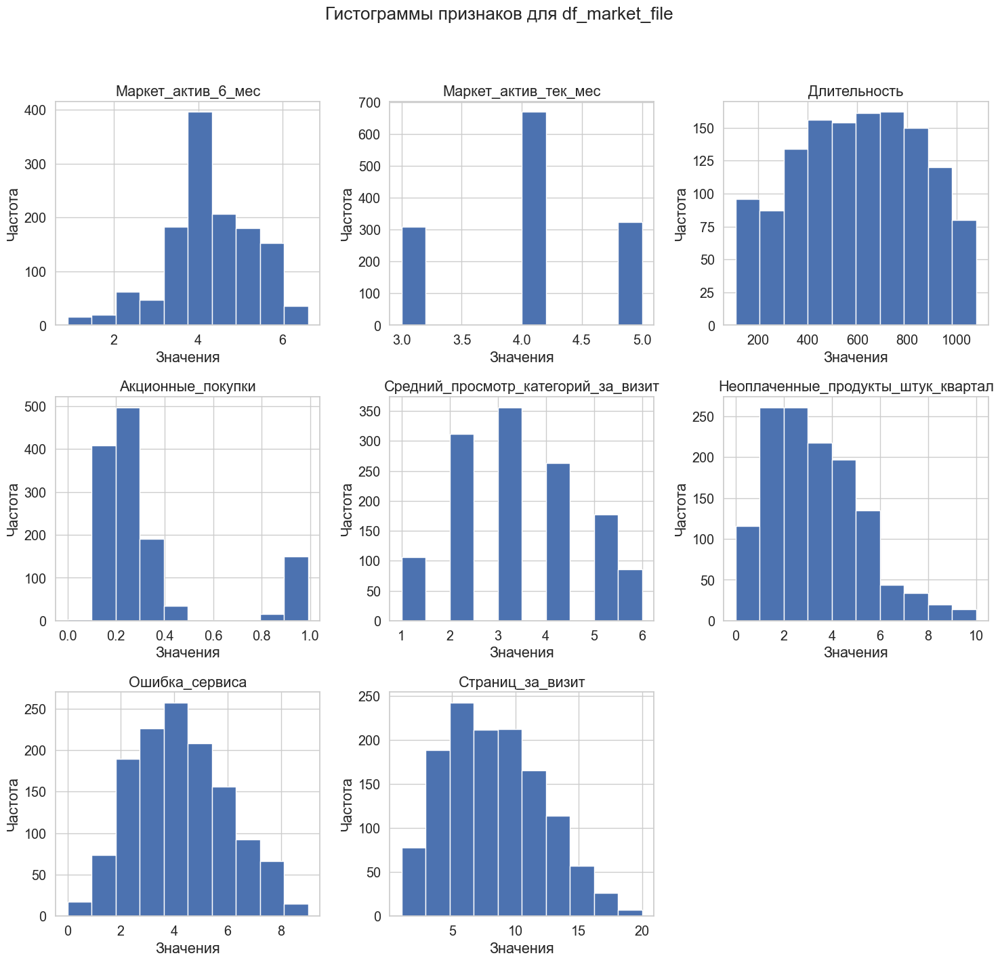

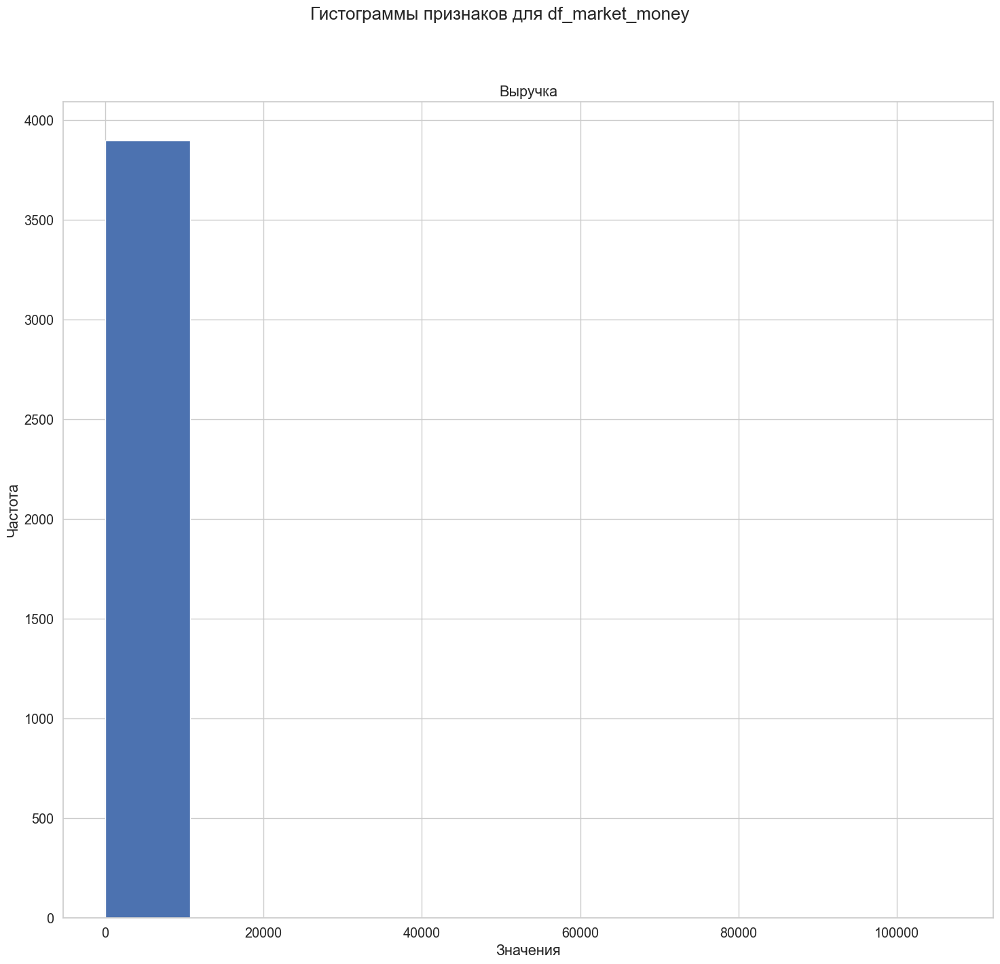

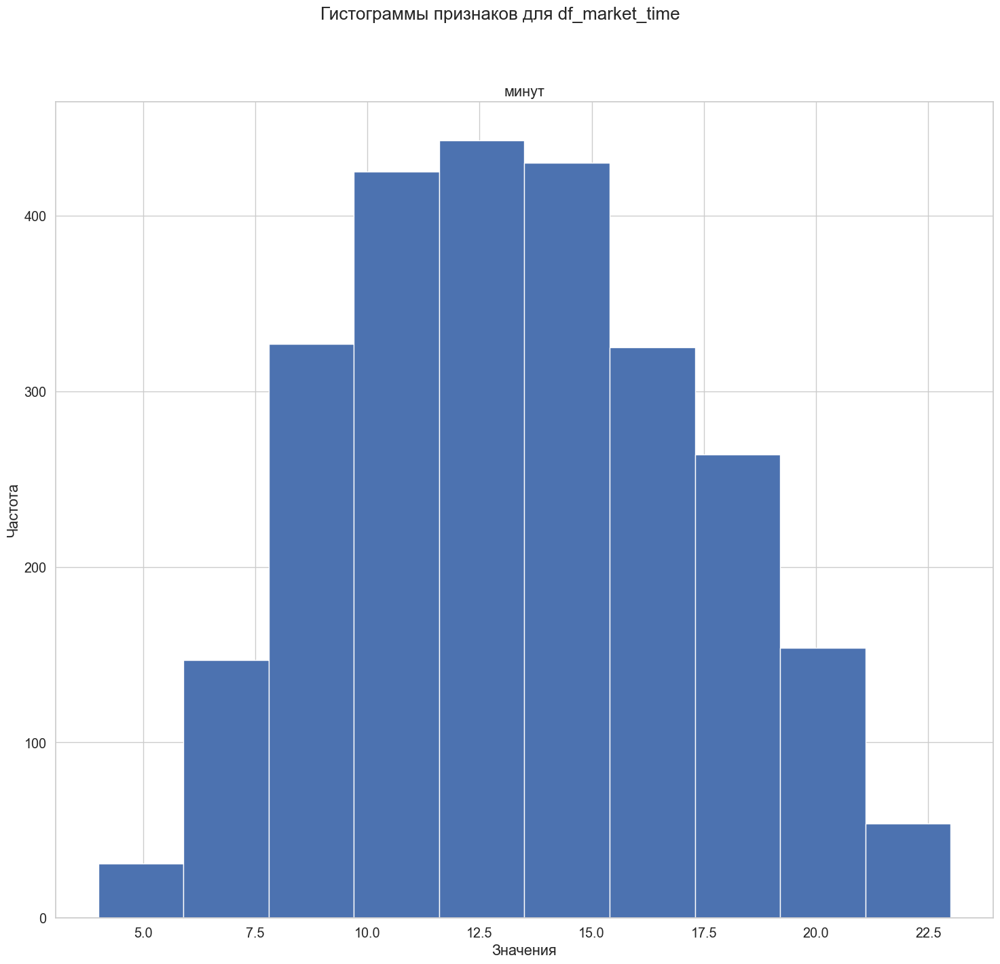

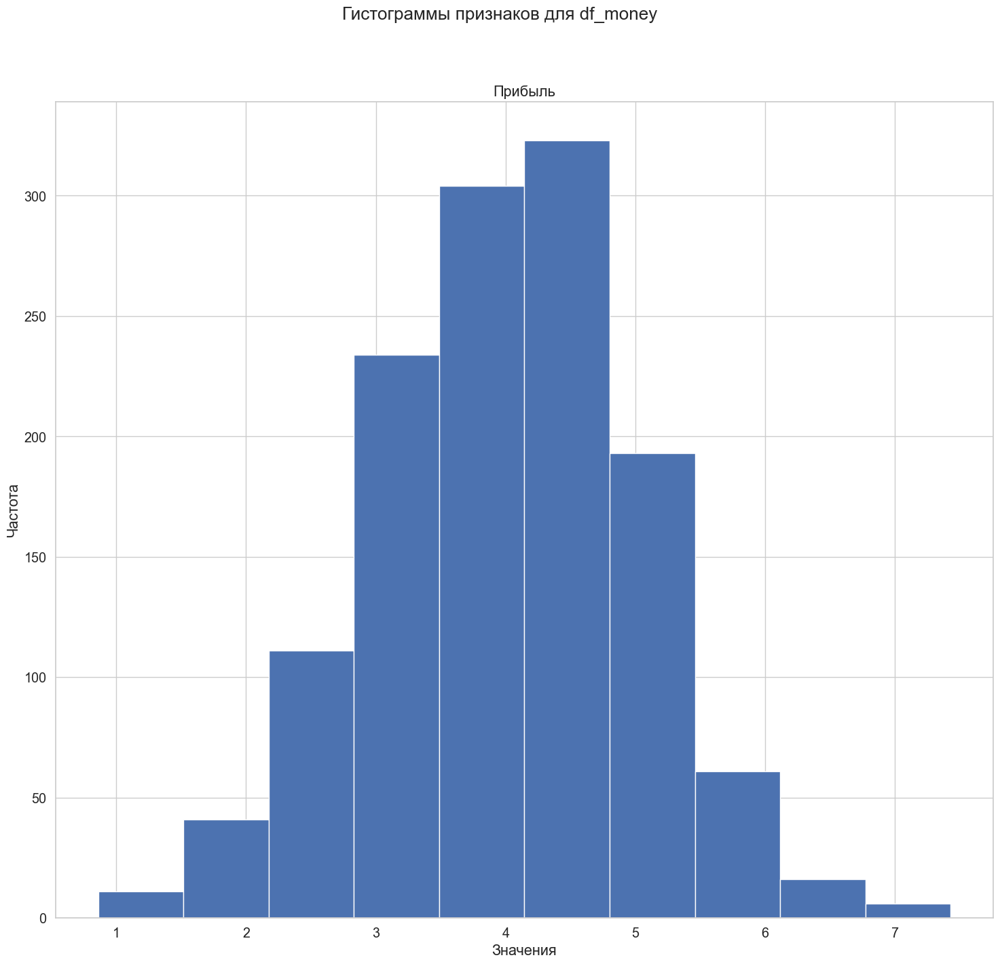

In [15]:
# Пройдемся по словарю DataFrame'ов
for name, data_frame in df_dict.items():
    # Удалим и графиков столбец 'id' из каждого DataFrame
    if 'id' in data_frame.columns:
        df_drop_id = data_frame.drop('id', axis=1)
    # Отображаем гистограммы для текущего DataFrame
    df_drop_id.hist(figsize=(15, 15))
    plt.suptitle(f'Гистограммы признаков для {name}')
    for ax in plt.gcf().get_axes():
        ax.set_xlabel('Значения')
        ax.set_ylabel('Частота')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Адаптируем макет
    plt.show()

**ВЫВОД:**

В первом разделе проекта были выполнены следующие шаги:

- ***Загрузка и первичный обзор данных:***
    - Импортированы необходимые библиотеки для работы с данными и визуализации.
    - Данные успешно загружены из четырёх csv-файлов, содержащих информацию о поведении покупателей на сайте `df_market_file`, о коммуникациях с покупателями `df_market_money`, о продуктовом поведении `df_market_time` и о финансовой активности `df_money`. В некоторых файлах использовался знак точки с запятой в качестве разделителя, а в качестве разделителя десятичной части - запятая.
    - Проведена первичная настройка отображения графиков и констант для анализа данных.
- ***Обзор типов данных и пропусков:***
    - Проанализированы типы данных: обнаружено 11 переменных типа int, 4 переменные типа float и 6 переменных типа object.
    - Отсутствуют пропущенные значения в данных, что указывает на высокое качество предоставленной информации.
    - Во всех датафреймах присутствует столбец `id,` который может быть использован для связывания таблиц.
- ***Переименование столбцов:***
    - В датафрейме `df_market_file` переименованы столбцы для соответствия "змеиному стилю" названий, что упрощает дальнейшую работу с данными.
- ***Визуальный анализ данных:***
    - Проведен визуальный анализ распределений значений признаков с помощью гистограмм. Это позволило оценить распределение данных и выявить потенциальные аномалии.
    - В `df_market_money` в столбце `Выручка` явно присутствует выброс в районе значения 100000
    - В `df_market_file` столбец `Акционные_покупки` кандидат на перевод в категориальную шкалу 
    
    
В целом, данные хорошо структурированы и не требуют значительной предварительной обработки. Данные в таблицах соответствуют описанию. Данные готовы к следующему этапу - предобработке данных, включая корректировку типов данных и дополнительную проверку наличия выбросов и аномалий.

## Раздел. Предобработка данных

### Проверка на наличие ошибок и дубликатов в данных

Проверим наличие явных дубликатов

In [16]:
# Подсчет количества явных дубликатов
for i in range(len(df)):
    print(f'Количество явных дубликатов в {df_names[i]}: {df[i].duplicated().sum()}')

Количество явных дубликатов в df_market_file: 0
Количество явных дубликатов в df_market_money: 0
Количество явных дубликатов в df_market_time: 0
Количество явных дубликатов в df_money: 0


Явных дубликатов не найдено. Определим наличие ошибок в данных (неявные дубликаты) для столбцов с типом `object`

In [17]:
for i, dataframe in enumerate(df):
    print(f'\nУникальные значения для: {df_names[i]}')
    for column in dataframe.columns:
        if dataframe[column].dtype == 'object':
            unique_values = dataframe[column].sort_values().unique()
            print(f'Столбец "{column}": {unique_values}')


Уникальные значения для: df_market_file
Столбец "Покупательская_активность": ['Прежний уровень' 'Снизилась']
Столбец "Тип_сервиса": ['премиум' 'стандарт' 'стандартт']
Столбец "Разрешить_сообщать": ['да' 'нет']
Столбец "Популярная_категория": ['Домашний текстиль' 'Косметика и аксесуары' 'Кухонная посуда'
 'Мелкая бытовая техника и электроника' 'Техника для красоты и здоровья'
 'Товары для детей']

Уникальные значения для: df_market_money
Столбец "Период": ['предыдущий_месяц' 'препредыдущий_месяц' 'текущий_месяц']

Уникальные значения для: df_market_time
Столбец "Период": ['предыдцщий_месяц' 'текущий_месяц']

Уникальные значения для: df_money


В `df_market_file` в столбце `Тип_сервиса` обнаружено неявный дубликат: `стандартт`. В `df_market_time` в столбце `Период` обнаружена ошибка в слове `предыдцщий_месяц`, также обнаружена ошибка в `df_market_file` в столбце `Популярная_категория` в категории `Косметика и аксесуары` в слове `аксесуары` и в `df_market_money` в столбце `Период` в категории `препредыдущий_месяц`. Исправим данные замечания. ***Об данных изменениях необходимо сообщить заказчику для недопущения их в новых данных.***

In [18]:
# Заменим "стандартт" на "стандартт" и "предыдцщий_месяц" на "предыдущий_месяц" 
df[0]['Тип_сервиса']          = df[0]['Тип_сервиса'].replace('стандартт', 'стандарт') 
df[0]['Популярная_категория'] = df[0]['Популярная_категория'].replace('Косметика и аксесуары', 'Косметика и аксессуары')
df[1]['Период']               = df[1]['Период'].replace('препредыдущий_месяц', 'предпредыдущий_месяц')
df[2]['Период']               = df[2]['Период'].replace('предыдцщий_месяц', 'предыдущий_месяц') 

# Проверим изменение 
print(f"{df[0]['Тип_сервиса'].unique()}\n \
{df[0]['Популярная_категория'].unique()}\n \
{df[1]['Период'].unique()}\n \
{df[2]['Период'].unique()}")

['премиум' 'стандарт']
 ['Товары для детей' 'Домашний текстиль' 'Косметика и аксессуары'
 'Техника для красоты и здоровья' 'Кухонная посуда'
 'Мелкая бытовая техника и электроника']
 ['предпредыдущий_месяц' 'текущий_месяц' 'предыдущий_месяц']
 ['текущий_месяц' 'предыдущий_месяц']


**ВЫВОД:** При анализе данных были выявлены явные и неявные дубликаты:
- Явные дубликаты:
    - В датафреймах не были обнаружены явные дубликата.
- Неявные дубликаты:
    - При анализе обнаружены следующие столбцы с ошибками в данных:
        - В `df_market_file['Тип_сервиса']`, обнаружен неявный дубликат `стандартт`, который был заменен на `стандарт`.
        - В том же датасете, в столбце `Популярная_категория`, была найдена опечатка в категории `Косметика и аксесуары` — `аксесуары` было изменено на `аксесcуары`.
        - В `df_market_money['Период']`, исправлена опечатка `препредыдцщий_месяц` на `предпредыдущий_месяц`.
        - В `df_market_time['Период']`, исправлена опечатка `предыдцщий_месяц` на `предыдущий_месяц`.
    - Рекомендации и дальнейшие действия:
        - Было рекомендовано сообщить об обнаруженных ошибках заказчику для предотвращения их повторения в будущем.

Эти шаги позволили избавиться от дубликатов и гарантировать точность и надежность данных для последующего анализа.

### Проверка наличия аномальных значений в датафреймах.

Проверим, что значения "id" во всех таблицах одинаковы

In [19]:
# Собираем уникальные значения 'id' из всех датафреймов в список множеств
unique_ids = [set(df[i]["id"].unique()) for i in range(len(df))]

# Проверяем, равны ли все множества (т.е. одинаково ли содержимое 'id' во всех датафреймах)
all_equal = reduce(lambda a, b: a if a == b else False, unique_ids)

# Выводим результат
if all_equal:
    print(f'Во всех датафреймах уникальные значения "id" одинаковы и равны: {df[0]["id"].nunique()}')
else:
    print(f'Уникальные значения "id" различаются между датафреймами')

Во всех датафреймах уникальные значения "id" одинаковы и равны: 1300


В ходе обзора данных в `df_market_money['Выручка']`, было обнаружено наличие выброса. Найдем это значение.

In [20]:
# Вызовем функция для построение ящика с усами
interactive_boxplot(df[1], 'Выручка')

In [21]:
# Выведем это значение
df[1].query('Выручка > 10000')

,id,Период,Выручка
98,215380,текущий_месяц,106862.2


In [22]:
[display(df[i].query("id == 215380")) for i in range(len(df))];

,id,Покупательская_активность,Тип_сервиса,Разрешить_сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
32,215380,Снизилась,премиум,нет,1.7,4,637,0.94,Техника для красоты и здоровья,3,2,4,7


,id,Период,Выручка
96,215380,предпредыдущий_месяц,5051.0
97,215380,предыдущий_месяц,6077.0
98,215380,текущий_месяц,106862.2


,id,Период,минут
64,215380,предыдущий_месяц,12
65,215380,текущий_месяц,14


,id,Прибыль
32,215380,3.88


Выведем все данные этого клинета

В данных о выручке данного клиента явная ошибка, об этом свидетельствует, что что его покупательная активность снизилась, а данные о выручке за текущий месяц явно завышены. Заменим выручку за текущий месяц средним значением выручки для этого клиента за предыдущие периоды. 

In [23]:
df[1].loc[
     (df[1]['Выручка'] == 106862.2) & (df[1]['id'] == 215380), 'Выручка'
] = df[1].query("id == 215380 & Выручка < 10000")['Выручка'].mean()

# Проверим данные
df[1].query("id == 215380")

,id,Период,Выручка
96,215380,предпредыдущий_месяц,5051.0
97,215380,предыдущий_месяц,6077.0
98,215380,текущий_месяц,5564.0


In [24]:
# Пройдемся по словарю DataFrame'ов
for i in range(len(df)):
    # Создаем копию текущего датафрейма без столбца 'id'
    df_drop_id = df[i].drop('id', axis=1)    
    # Проходим по всем числовым столбцам во временном датафрейме
    for column in df_drop_id.select_dtypes(include=['float', 'int']).columns:
        interactive_boxplot(df[i], column)  

Проверим, что все клиенты приносили прибыль хотя-бы один раз за отчетный период.

In [25]:
df[1].groupby('id', as_index=False).agg({'Выручка' : 'sum'}).sort_values('Выручка').head()

,id,Выручка
0,215348,3293.1
11,215359,4735.0
9,215357,5986.3
216,215564,10437.6
368,215716,10575.9


Значения которые можно считать аномальными в количественных параметрах не обнаружены.

**ВЫВОД:** 

В подразделе 2.2 проекта была проведена проверка наличия аномальных значений в данных посредством анализа уникальных значений идентификаторов во всех датафреймах и визуализации распределений количественных переменных.

- **Проверка уникальных значений "id":**
    - Было подтверждено, что уникальные значения идентификаторов `"id"` одинаковы во всех датафреймах. Количество уникальных значений составляет 1300. Это указывает на то, что данные о клиентах полностью совпадают по идентификаторам в различных таблицах, обеспечивая целостность и связность данных.

- **Поиск аномалий в данных о выручке:**
    - В процессе анализа данных о выручке `df_market_money['Выручка']` было выявлено аномально высокое значение выручки для клиента с идентификатором 215380 за текущий месяц (106862.2), что значительно превышает его предыдущие показатели выручки. Поскольку это значение не соответствует общей картине активности клиента, оно было признано ошибочным и заменено средним значением данного клиента.

- **Визуализация количественных параметров:**
    - Для всех числовых столбцов в датафреймах были построены ящики с усами, что позволило оценить наличие потенциальных выбросов. В результате анализа было установлено, что аномальные значения, требующие коррекции, не обнаружены.

**ОБЩИЙ ВЫВОД ПО РАЗДЕЛУ 2 "ПРЕДОБРАБОТКА ДАННЫХ":** 

В разделе 2 по предобработке данных были выполнены следующие ключевые действия:

1. **Проверка на наличие ошибок и дубликатов:**
    - Явные дубликаты в датафреймах отсутствуют, что подтверждает уникальность данных.
    - Неявные дубликаты и ошибки были выявлены в некоторых текстовых столбцах и успешно исправлены, что повысило точность и качество данных.

2. **Анализ и коррекция аномальных значений:**
    - Проверка уникальных идентификаторов "id" подтвердила их согласованность между всеми датафреймами.
    - В данных о выручке было обнаружено аномальное значение для одного из клиентов, которое было заменено на среднее значение, устранив таким образом ошибку.

Визуализация данных позволила дополнительно убедиться в отсутствии аномальных значений в количественных параметрах, за исключением выявленного случая. Таким образом, данные были тщательно очищены и подготовлены к дальнейшему анализу.

**Общий вывод:** Раздел предобработки данных оказался критически важным для обеспечения качества анализа. Были успешно исправлены неявные дубликаты и ошибки, устранены аномалии, что позволяет переходить к исследовательскому анализу данных.

## Исследовательский анализ данных

### Описание количественных параметров

Для описания количественных параметров выведем их гистограммы и их статистики.

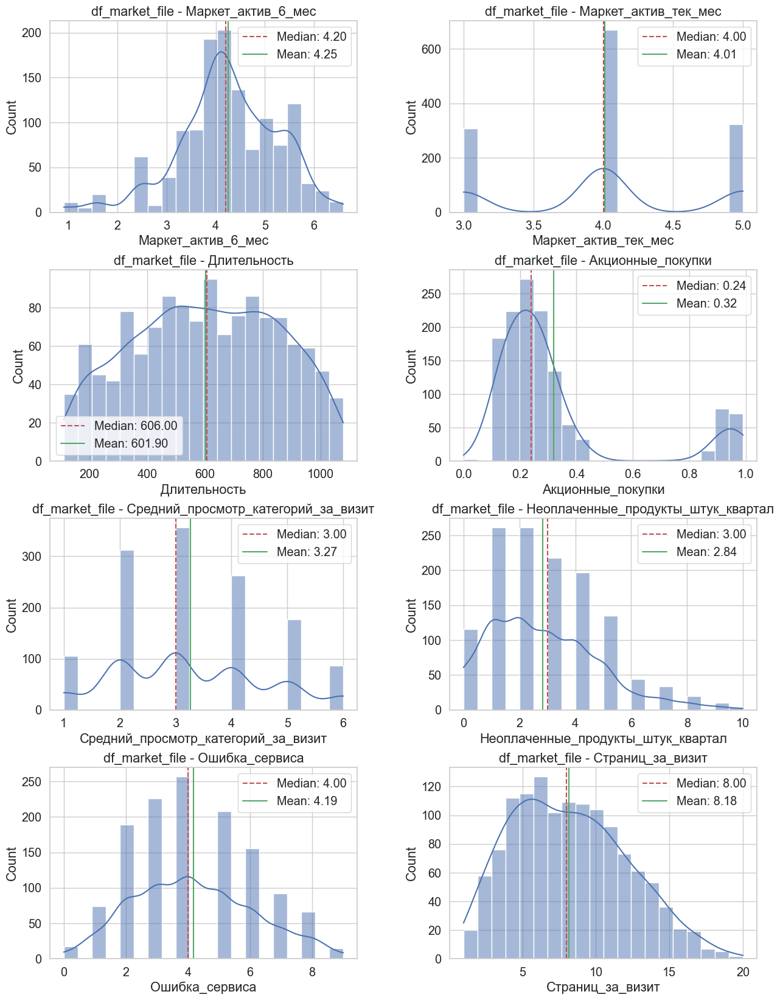

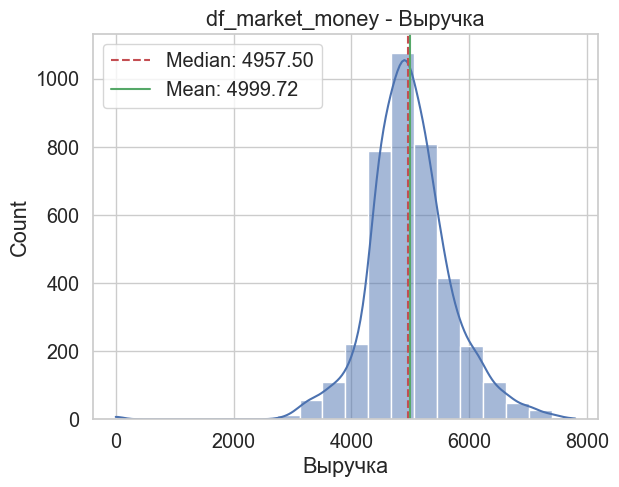

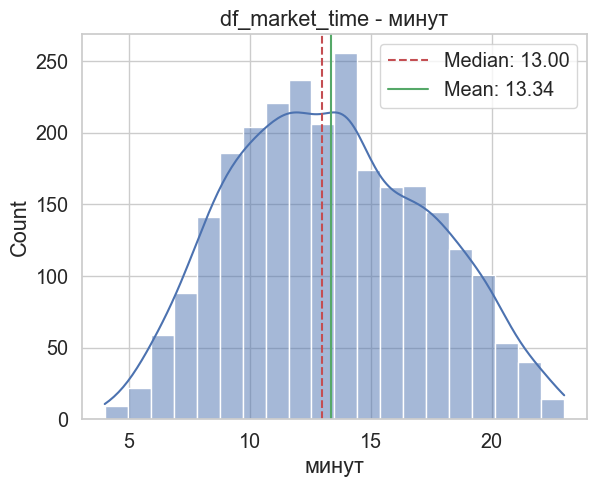

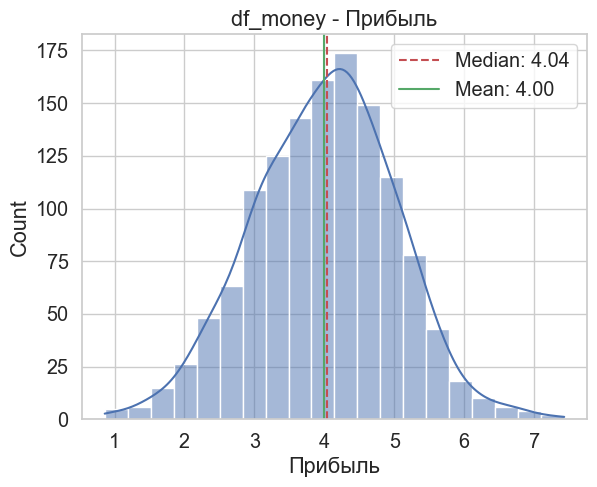

In [26]:
# Цикл для вызова функции для каждого датафрейма
for name, data_frame in df_dict.items():
    plot_histograms_for_df(data_frame, name)

In [27]:
[display(df[i].drop('id', axis=1).describe().round(2)) for i in range(len(df))];

,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
count,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00,1300.00
mean,4.25,4.01,601.90,0.32,3.27,2.84,4.19,8.18
std,1.01,0.70,249.86,0.25,1.36,1.97,1.96,3.98
min,0.90,3.00,110.00,0.00,1.00,0.00,0.00,1.00
25%,3.70,4.00,405.50,0.17,2.00,1.00,3.00,5.00
50%,4.20,4.00,606.00,0.24,3.00,3.00,4.00,8.00
75%,4.90,4.00,806.00,0.30,4.00,4.00,6.00,11.00
max,6.60,5.00,1079.00,0.99,6.00,10.00,9.00,20.00


,Выручка
count,3900.00
mean,4999.72
std,706.97
min,0.00
25%,4590.15
50%,4957.50
75%,5363.00
max,7799.40


,минут
count,2600.00
mean,13.34
std,4.08
min,4.00
25%,10.00
50%,13.00
75%,16.00
max,23.00


,Прибыль
count,1300.00
mean,4.00
std,1.01
min,0.86
25%,3.30
50%,4.04
75%,4.67
max,7.43


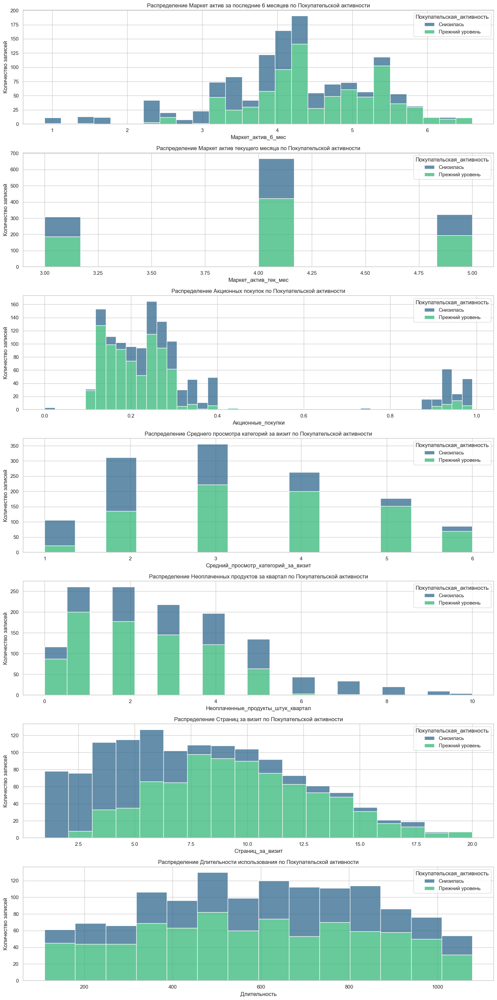

In [28]:
# Вызов функции для построения гистограмм
plot_histograms(df[0])

На основании анализа графиков можно сделать следующие выводы:

1. Доля клиентов, снизивших свою активность, превышает долю клиентов, оставшихся на прежнем уровне, особенно если среднемесячное значение маркетинговых коммуникаций компании меньше 5.

2. Клиенты, у которых среднемесячная доля покупок по акции от общего числа покупок превышает 80%, в большей степени снизили свою активность. Это может подтверждаться также графиком среднего просмотра категорий визита, поскольку эти клиенты, скорее всего, посещают сайт, зная, что именно они ищут.

3. Клиенты, у которых количество неоплаченных товаров в корзине превышает 5, практически все снизили свою активность.

4. Те клиенты, которые просматривают мало категорий, также склонны к снижению активности. Для поддержания их активности необходимо предлагать для просмотра и другие категории товаров.

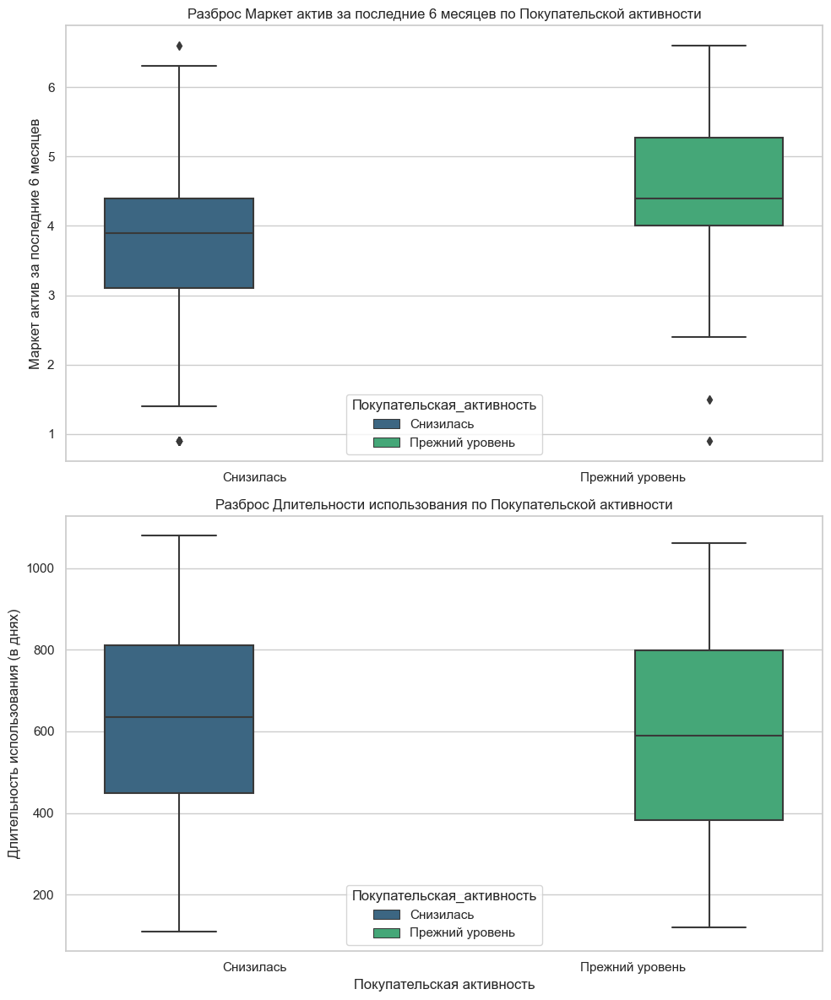

In [29]:
# Создание фигуры для боксплотов
fig, axes = plt.subplots(2, 1, figsize=(10, 12))

# Боксплот для Маркет_актив_6_мес
sns.boxplot(data=df[0], x="Покупательская_активность", y="Маркет_актив_6_мес", ax=axes[0], 
            hue="Покупательская_активность", palette="viridis")
axes[0].set_title("Разброс Маркет актив за последние 6 месяцев по Покупательской активности")
axes[0].set_xlabel("")
axes[0].set_ylabel("Маркет актив за последние 6 месяцев")

# Боксплот для Длительности
sns.boxplot(data=df[0], x="Покупательская_активность", y="Длительность", ax=axes[1], 
            hue="Покупательская_активность", palette="viridis")
axes[1].set_title("Разброс Длительности использования по Покупательской активности")
axes[1].set_xlabel("Покупательская активность")
axes[1].set_ylabel("Длительность использования (в днях)")

plt.tight_layout()
plt.show()


**ВЫВОД:** 

В подразделе 3.1 проекта был проведен EDA количественных параметров и отоброжены их статистические данные. Анализируя гистограммы и описательные статистики, можно сделать следующие выводы:

1. **Маркетинговая активность и длительность взаимодействия:** Показатели маркетинговой активности за последние 6 месяцев и в текущем месяце практически идентичны по средним значениям (около 4) и медианам, указывая на стабильность маркетинговых усилий во времени. В среднем за текущий месяц маркетинговая активность снизилась менее чем на 6%. При этом наблюдается, что в маркетинговой активности за последнее 6 месяцев есть ряд клиентов с которыми маркетинговые коммуникаций велись крайне редко, о чем свидетельствует боксплот и min значение равное 0.9, при этом в текущем месяце min значение равно 3. Причинами этого могут быть разные, либо этим клиентам изначально меньше внимания отводилось, либо эти клиенты начали пользоваться услугами компании менее 6 месяцев назад.Длительность использования сервиса имеет среднее значение около 602 дней, что свидетельствует о длительном сроке взаимодействия клиентов с сервисом. min значение равно 110 дням, что в свою очередь подтверждает различия между маркетинговой активностью за последнее 6 месяцев и за текущий месяц. 

2. **Акционные покупки и неоплаченные продукты:** Среднее количество акционных покупок невелико (0.32), что может указывать на низкую долю таких покупок в общем числе. Количество неоплаченных товаров в корзине также относительно невелико (среднее 2.84), что может свидетельствовать о хорошей конверсии посещений в покупки.

3. **Средний просмотр категорий и страниц за визит:** Клиенты в среднем просматривают 3 категории за визит, что может свидетельствовать о целенаправленном поиске или преданности определенным категориям. Среднее количество страниц за визит около 8, что указывает на активное взаимодействие с контентом сайта. При этом медианные значения не сильно отличны от среднее, что говорит от малой доли выбросов в данных.

4. **Ошибка сервиса:** В среднем, клиенты сталкиваются с ошибками сервиса 4 раза, что требует внимания для улучшения пользовательского опыта.

5. **Выручка:** Средняя выручка составляет около 4999.72, при этом значения выручки сосредоточены вокруг среднего, что говорит о стабильности доходов от продаж.

6. **Проведенное время и прибыль:** Клиенты в среднем проводят на сайте около 13 минут, а средняя прибыль составляет 4 единицы. Оба распределения приближены к нормальным с небольшой асимметрией, что указывает на относительную однородность поведения клиентов.


**EDA выявил несколько ключевых наблюдений относительно покупательской активности клиентов (таргета)**. В частности, было обнаружено, что клиенты с более низким среднемесячным уровнем маркетинговых взаимодействий (менее 5) имеют тенденцию к снижению своей активности чаще, чем те, кто поддерживает или увеличивает свою активность. Это указывает на потенциальную связь между частотой маркетинговых коммуникаций и уровнем вовлеченности клиента.

Кроме того, наблюдается, что клиенты, делающие большинство своих покупок по акциям (свыше 80% от общего количества покупок), также склонны к снижению активности. Это может быть связано с тем, что такие клиенты заходят на сайт с конкретной целью поиска акционных товаров и менее склонны к случайным покупкам или исследованию дополнительных категорий товаров.

Анализ также показал, что клиенты с количеством неоплаченных товаров в корзине более 5 в подавляющем большинстве случаев снижают свою активность. Это может указывать на потенциальные проблемы с вовлечением или удовлетворением потребностей этих клиентов.

Наконец, выявлена тенденция к снижению активности среди клиентов, которые просматривают ограниченное количество категорий товаров. Для поддержания и повышения их активности может быть эффективным предложить более широкий ассортимент товаров или активнее продвигать разнообразие категорий, что может стимулировать интерес и вовлеченность клиентов.

Эти наблюдения подчеркивают важность персонализированного подхода к маркетинговым и продажным стратегиям, а также необходимость дальнейшего анализа для определения оптимальных методов увеличения покупательской активности.


**Общий вывод:** Данные показывают устойчивое поведение клиентов с точки зрения маркетинговых показателей и взаимодействия с сайтом. Несмотря на небольшое количество акционных покупок и неоплаченных продуктов, общий пользовательский опыт требует дополнительного анализа из-за зафиксированных ошибок сервиса. Выручка и прибыль показывают стабильную картину с фокусом на обслуживание клиентов, которые активно взаимодействуют с сайтом. Это дает основу для дальнейшей работы над улучшением качества сервиса и маркетинговой стратегии.

### Описание категориальных параметров

Для описания категориальных параметров выведем их круговые и столбчатые диаграммы.

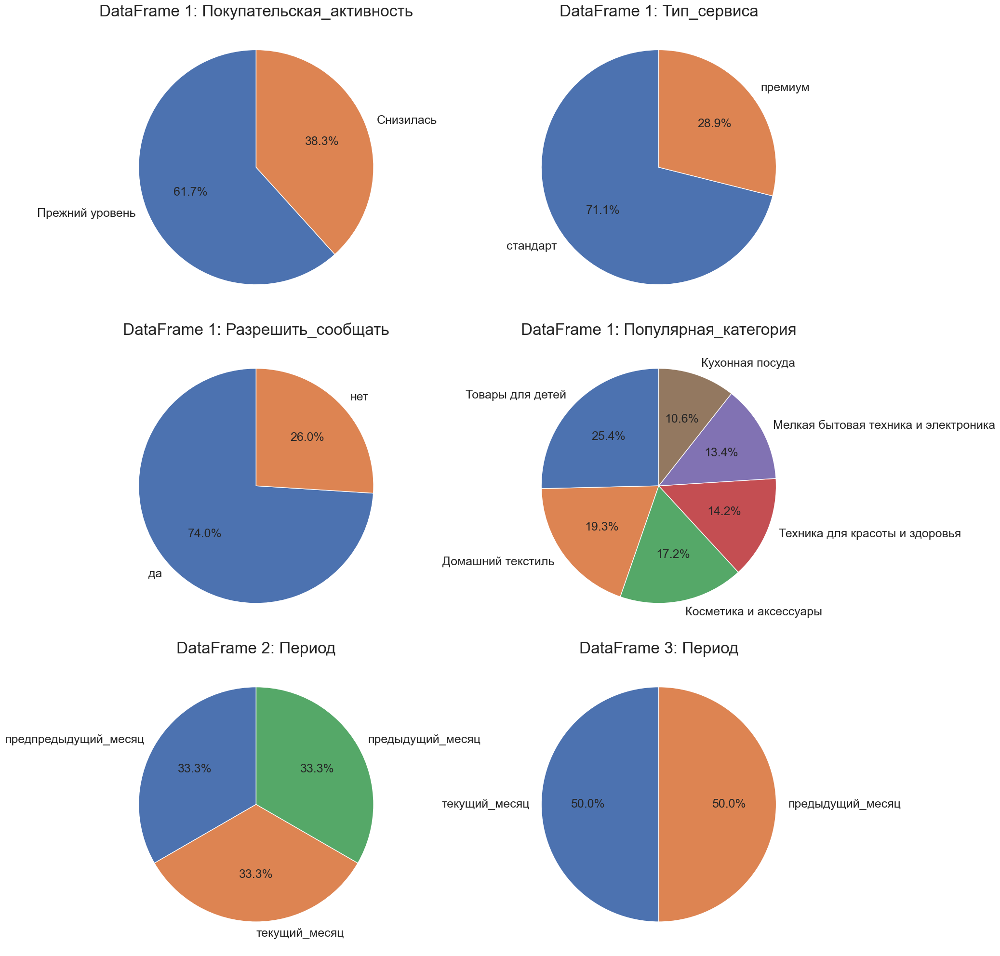

In [30]:
# Увеличиваем размер фигуры
fig, axes = plt.subplots(3, 2, figsize=(20, 20))
axes = axes.ravel()

# Переменная для отслеживания индекса подграфика
plot_index = 0

for i, dataframe in enumerate(df):
    # Итерация по столбцам только с типом 'object'
    for column in dataframe.select_dtypes(include=['object']).columns:
        dataframe[column].value_counts().plot.pie(ax=axes[plot_index], autopct='%1.1f%%', startangle=90, fontsize=18)
        axes[plot_index].set_title(f'DataFrame {i+1}: {column}', fontsize=24)
        axes[plot_index].set_ylabel('')
        plot_index += 1

plt.tight_layout()

plt.show()

Посмотрим какие категории наиболее популярны

C:\Users\Asus\AppData\Local\Temp\ipykernel_12312\849708317.py:8: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



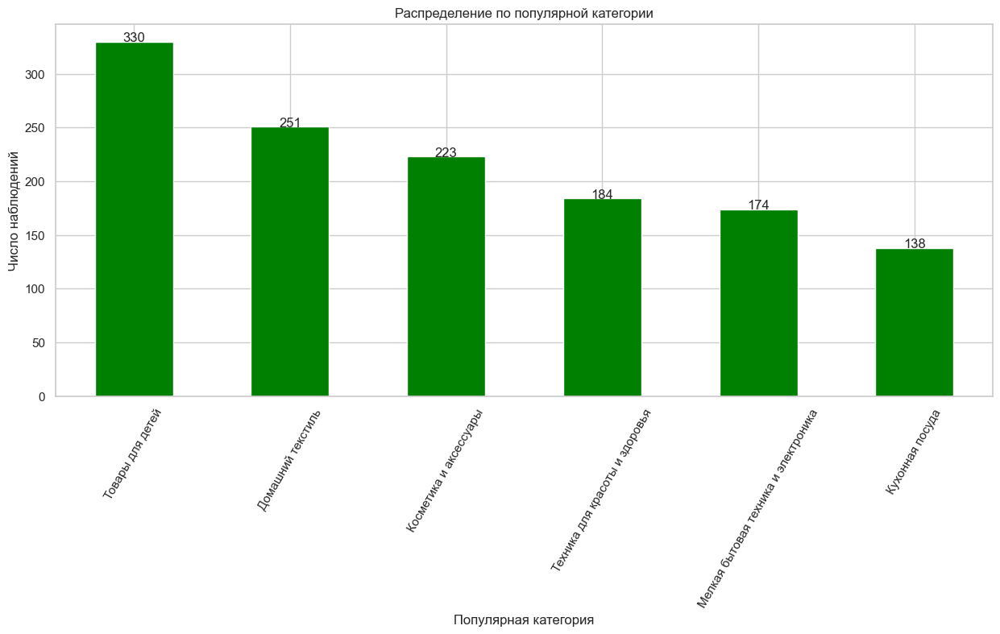

In [31]:
# Создаем столбчатую диаграмму
plt.figure(figsize=(15, 6))
counts = df[0]['Популярная_категория'].value_counts()
counts.plot(kind='bar', color='green')

# Добавляем текстовые метки к столбцам
for i in range(len(counts)):
    plt.text(i, counts[i], counts[i], ha='center')

# Добавляем заголовок и подписи к осям
plt.title('Распределение по популярной категории')
plt.xlabel('Популярная категория')
plt.ylabel('Число наблюдений')

# Установка поворот названий годов на 60 градусов
plt.xticks(rotation=60)

plt.show()

In [32]:
df[0].groupby('Тип_сервиса', as_index=False)[[
    'Маркет_актив_6_мес',
    'Маркет_актив_тек_мес',
    'Длительность'
]].mean()

,Тип_сервиса,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность
0,премиум,4.115957,3.933511,722.452128
1,стандарт,4.309848,4.043290,552.841991


Рассмотрим данные в разрезе типа сервиса и покупательской активностью

In [33]:
grouped_data = df[0].groupby(['Тип_сервиса', 'Покупательская_активность'], as_index=False)['id'].count()
# Рассчитываем процент заказов для каждого типа сервиса
grouped_data['Процент'] = round((grouped_data['id'] / grouped_data.groupby('Тип_сервиса')['id'].transform('sum')) * 100, 2)
grouped_data

,Тип_сервиса,Покупательская_активность,id,Процент
0,премиум,Прежний уровень,206,54.79
1,премиум,Снизилась,170,45.21
2,стандарт,Прежний уровень,596,64.50
3,стандарт,Снизилась,328,35.50


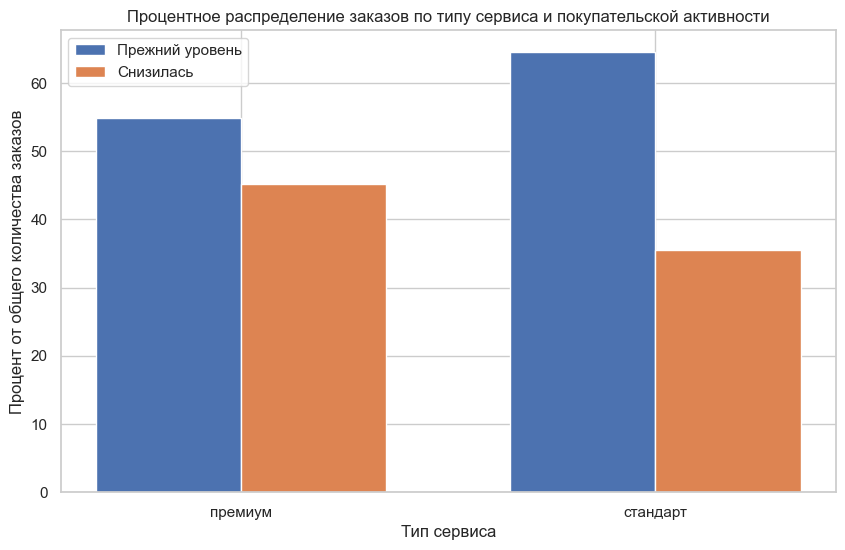

In [34]:
# Определение уникальных значений покупательской активности
activities = grouped_data['Покупательская_активность'].unique()

# Определение ширины столбцов и смещения
bar_width = 0.35
index = np.arange(len(grouped_data['Тип_сервиса'].unique()))

# Построение столбчатой диаграммы
plt.figure(figsize=(10, 6))

for i, activity in enumerate(activities):
    subset = grouped_data[grouped_data['Покупательская_активность'] == activity]
    plt.bar(index + i * bar_width, subset['Процент'], bar_width, label=activity)

# Добавление заголовка и подписей к осям
plt.title('Процентное распределение заказов по типу сервиса и покупательской активности')
plt.xlabel('Тип сервиса')
plt.ylabel('Процент от общего количества заказов')

# Добавление подписей для каждого типа сервиса
plt.xticks(index + bar_width * (len(activities) - 1) / 2, grouped_data['Тип_сервиса'].unique())

# Добавление легенды
plt.legend()

# Отображение диаграммы
plt.show()

Рассмотрим данные в разрезе типа сервиса, покупательской активностью по отношению к популярной категории

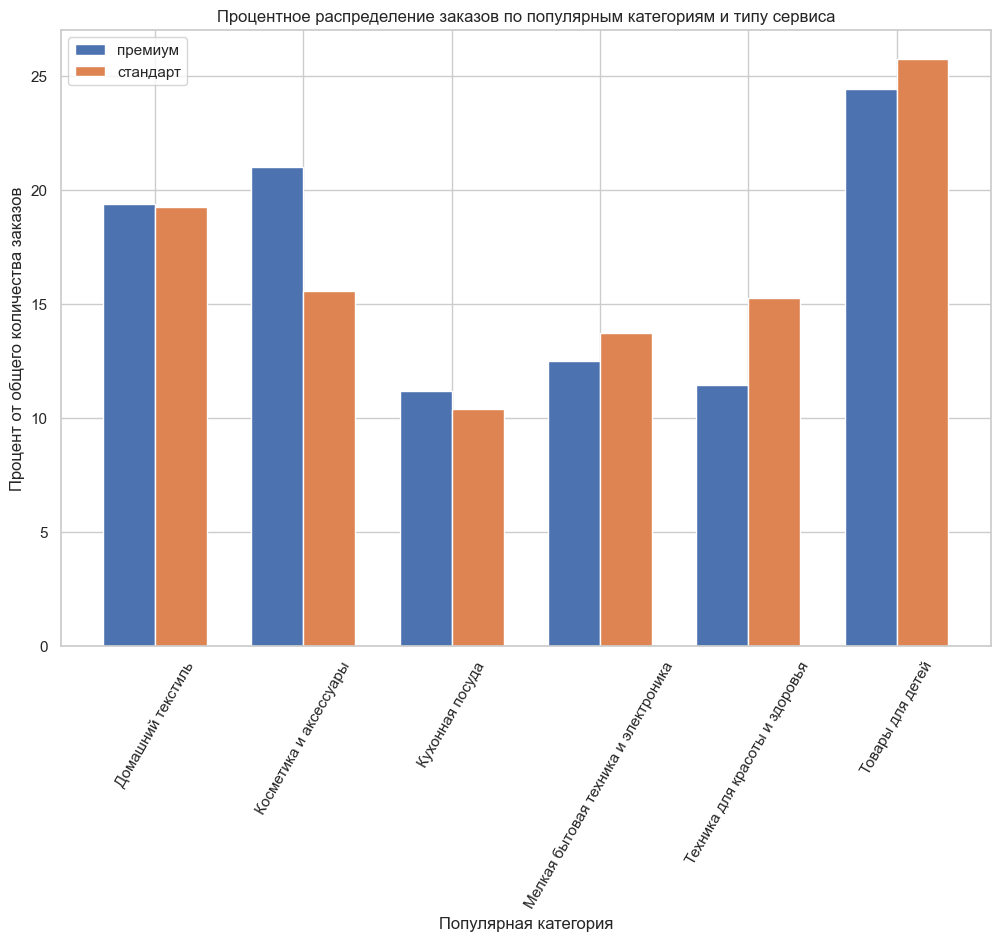

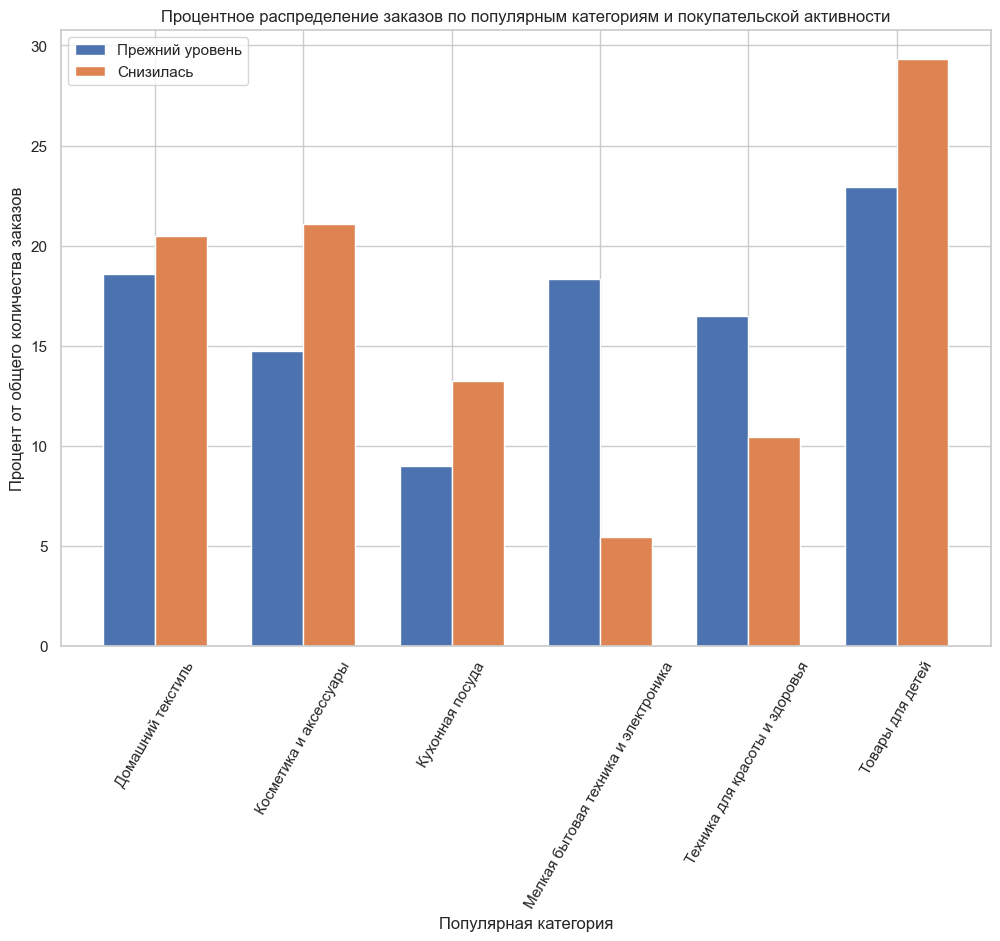

In [35]:
# Сгруппируем данные
grouped_data1 = df[0].groupby(['Тип_сервиса', 'Популярная_категория'], as_index=False)['id'].count()
grouped_data2 = df[0].groupby(['Покупательская_активность', 'Популярная_категория'], as_index=False)['id'].count()

# Вызов функций для отображения графиков
plot_grouped_data(
    grouped_data1, 
    'Популярная категория', 
    'Процент от общего количества заказов', 
    'Процентное распределение заказов по популярным категориям и типу сервиса'
)
plot_grouped_data(
    grouped_data2, 
    'Популярная категория', 
    'Процент от общего количества заказов', 
    'Процентное распределение заказов по популярным категориям и покупательской активности'
)

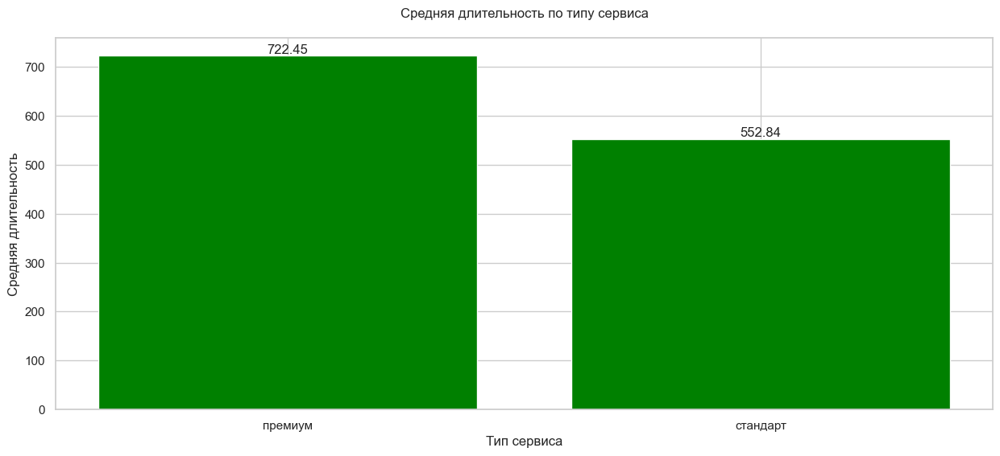

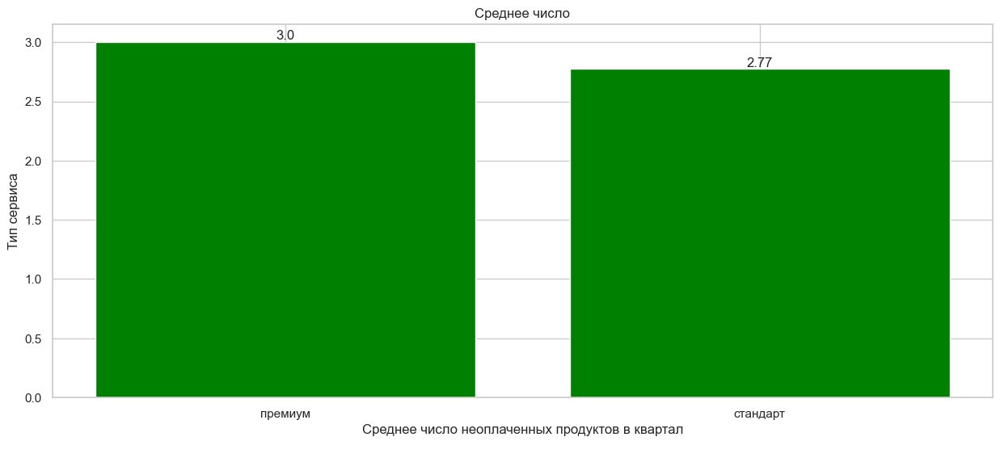

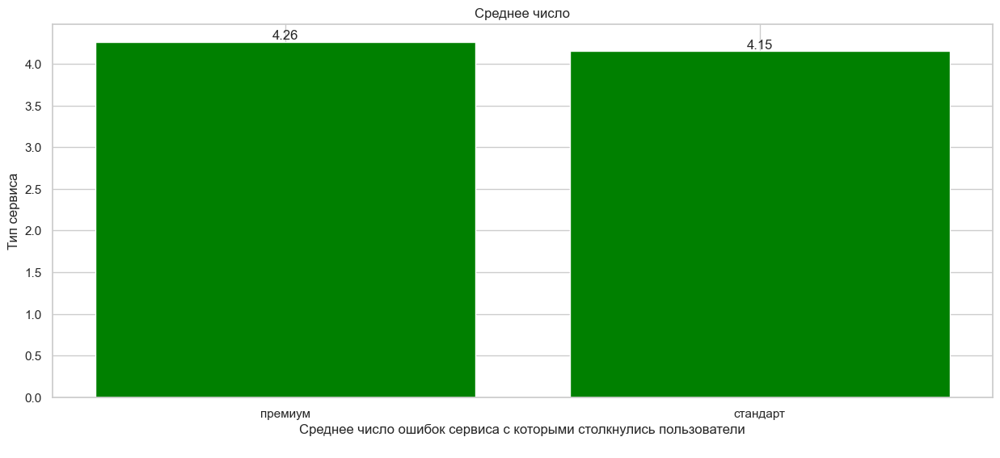

In [36]:
grouped_data3 = df[0].groupby('Тип_сервиса', as_index=False)['Длительность'].mean()
grouped_data4 = df[0].groupby('Тип_сервиса', as_index=False)['Неоплаченные_продукты_штук_квартал'].mean()
grouped_data5 = df[0].groupby('Тип_сервиса', as_index=False)['Ошибка_сервиса'].mean()

# Для средней длительности по типу сервиса
plot_grouped_data_2(
    grouped_data3, 'Тип_сервиса', 'Длительность', 
    'Тип сервиса', 'Средняя длительность', 'Средняя длительность по типу сервиса\n'
)

# Для среднего числа неоплаченных продуктов в квартал по типу сервиса
plot_grouped_data_2(
    grouped_data4, 'Тип_сервиса', 'Неоплаченные_продукты_штук_квартал',
    'Среднее число неоплаченных продуктов в квартал\n', 'Тип сервиса', 'Среднее число'
)

# Для среднего числа ошибок сервиса, с которыми столкнулись пользователи, по типу сервиса
plot_grouped_data_2(
    grouped_data5, 'Тип_сервиса', 'Ошибка_сервиса',
    'Среднее число ошибок сервиса с которыми столкнулись пользователи\n', 'Тип сервиса', 'Среднее число'
)

данные не сбалансированы

In [37]:
df[0].head()

,id,Покупательская_активность,Тип_сервиса,Разрешить_сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2


In [38]:
df[1].groupby('Период', as_index=False)['Выручка'].mean()

,Период,Выручка
0,предпредыдущий_месяц,4825.206923
1,предыдущий_месяц,4936.920385
2,текущий_месяц,5237.039154


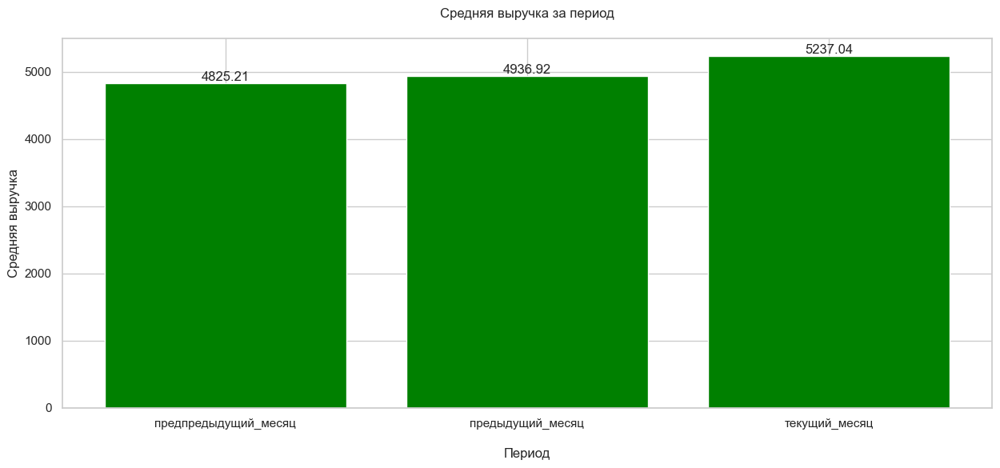

In [39]:
plot_grouped_data_2(
    df[1].groupby('Период', as_index=False)['Выручка'].mean(), 'Период', 'Выручка', 
    '\nПериод', 'Средняя выручка', 'Средняя выручка за период\n'
)

Средняя выручка растет из месяца к месяцу

In [40]:
df[2].groupby('Период', as_index=False)['минут'].mean()

,Период,минут
0,предыдущий_месяц,13.467692
1,текущий_месяц,13.204615


Наблюдается незначительное падение

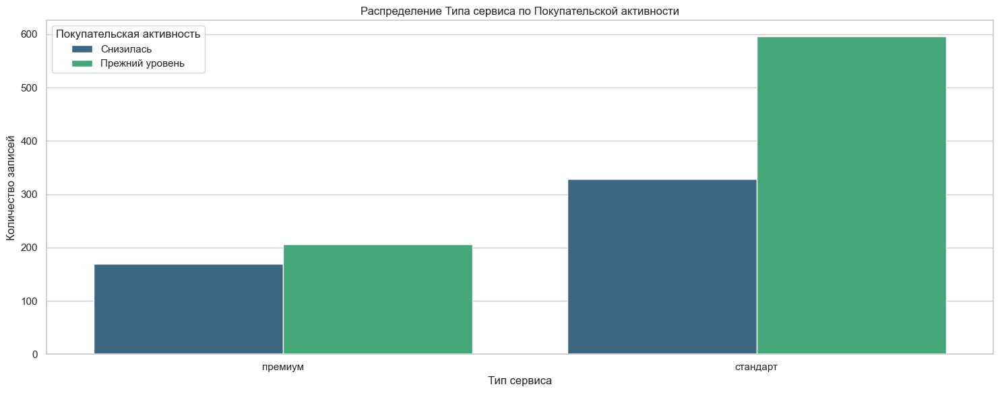

In [41]:
# Создание фигуры для столбчатой диаграммы
plt.figure(figsize=(15, 6))

# Столбчатая диаграмма для Типа сервиса
sns.countplot(data=df[0], x="Тип_сервиса", hue="Покупательская_активность", palette="viridis")
plt.title("Распределение Типа сервиса по Покупательской активности")
plt.xlabel("Тип сервиса")
plt.ylabel("Количество записей")
plt.legend(title="Покупательская активность")

plt.tight_layout()
plt.show()

Доля клиентов, снизивших свою активность, среди пользователей премиум-подписки почти в два раза выше, чем среди пользователей со стандартной подпиской. Это указывает на необходимость более внимательного анализа условий предоставления премиум-подписки и изучения причин снижения активности клиентов, использующих эту подписку.

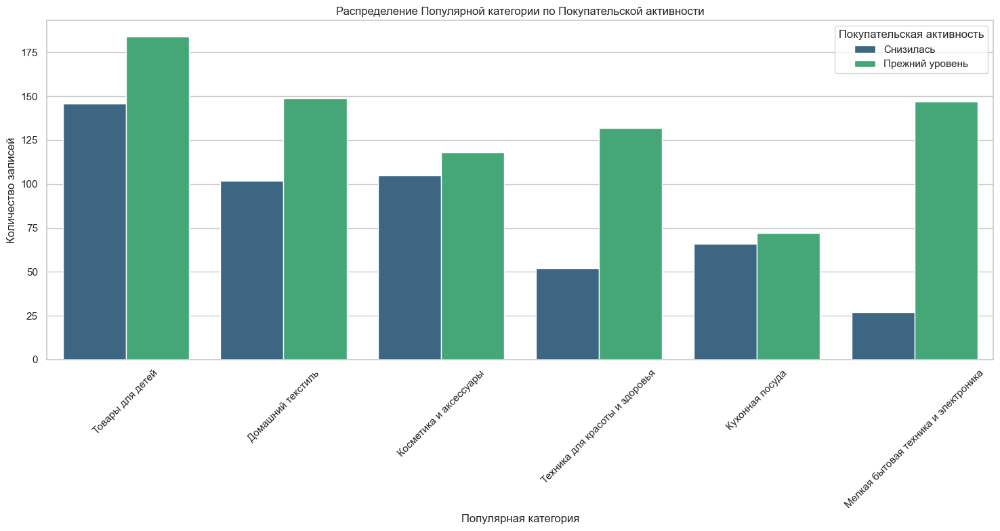

In [42]:
# Создание фигуры для столбчатой диаграммы
plt.figure(figsize=(15, 8))

# Столбчатая диаграмма для Популярной категории
sns.countplot(data=df[0], x="Популярная_категория", hue="Покупательская_активность", palette="viridis")
plt.title("Распределение Популярной категории по Покупательской активности")
plt.xlabel("Популярная категория")
plt.ylabel("Количество записей")
plt.xticks(rotation=45)
plt.legend(title="Покупательская активность")

plt.tight_layout()
plt.show()


Клиенты, предпочитающие "Мелкую бытовую технику и электронику", демонстрируют стабильно высокую покупательскую активность, в то время как в категориях "Кухонная посуда" и "Косметика и аксессуары" наблюдается более высокая доля клиентов с снижением активности. Это указывает на необходимость детального анализа предлагаемого ассортимента в этих категориях, чтобы выявить возможные причины снижения интереса со стороны покупателей. Кроме того, важно обратить внимание на товары, часто оставляемые неоплаченными в корзине, поскольку они могут указывать на наличие препятствий на пути к покупке, таких как ценообразование, наличие товара, или другие факторы, влияющие на решение о покупке. Изучение этих аспектов поможет определить меры по оптимизации предложений и повышению уровня удовлетворенности клиентов, что, в свою очередь, способствует увеличению покупательской активности.

**ВЫВОД:** 
В подразделе 3.2 проекта был проведен EDA категориальных параметров. Анализируя диаграммы, можно сделать следующие выводы относительно популярности категорий товаров и покупательской активности:

**1. Популярность категорий товаров:**
- Товары для детей являются наиболее популярной категорией с 330 наблюдениями, что может указывать на сильный интерес клиентов к товарам данной категории.
- Домашний текстиль и косметика с аксессуарами также являются популярными категориями, что подчеркивает их значимость в ассортименте товаров.
- Кухонная посуда, несмотря на то что она в списке последняя, также имеет значительное число наблюдений (138), подтверждая спрос на эти товары.

**2. Покупательская активность и тип сервиса:**
- Клиенты, пользующиеся стандартным сервисом, в большинстве своем (64.50%) сохраняют прежний уровень активности, в то время как снижение активности наблюдается у 35.50% клиентов этой категории.
- Среди пользователей премиум-сервиса разница более выражена: примерно 45% клиентов демонстрируют снижение активности, что в свою очередь дает понимание, что такие клиенты большей степени подвержены изменениям которые происходили в последнее время.
- Общая картина показывает, что большая часть клиентов, независимо от типа сервиса, сохраняет свою активность, что может говорить о качестве предлагаемых услуг или эффективности маркетинговых стратегий.

**3. По типу сервиса:**
- **Премиум-сервис:** Наибольшее количество заказов в категории "Товары для детей" (92), что может свидетельствовать о высокой заинтересованности в этой категории среди более требовательных клиентов. Относительно высокая популярность также наблюдается в категории "Косметика и аксессуары" (79). Это указывает на то, что клиенты, которые предпочитают премиальные услуги, склонны к покупке товаров, предположительно, высокого качества или брендовых товаров. Данный тип клиентов имеет более высокое значение, которое показывает, сколько дней прошло с момента регистрации на сайт. Также данные клиенты чаще не оплачивают товары в корзине.
- **Стандартный сервис:** В категориях "Товары для детей" (238) и "Домашний текстиль" (178) наблюдается наибольшее количество заказов, что указывает на их популярность среди широкой аудитории. Клиенты, использующие стандартный сервис, также активно покупают "Технику для красоты и здоровья" (141) и "Косметику и аксессуары" (144).
- **Различия:** В основном покупки различных категорий товаров не отличают у клиентов разного типа сервиса, за исключением:
    - Косметика и аксессуары - чаще покупают с типом сервисом "Премиум"
    - Техника для красоты и здоровья - чаще покупают с типом сервисом "Стандарт"

**4. По покупательской активности:**
- **Прежний уровень:** Наибольшее количество заказов в категории "Товары для детей" (184) и "Мелкая бытовая техника и электроника" (147). Клиенты с неизменной активностью склонны приобретать товары повседневного спроса и технику, что может быть связано с необходимостью обновления или покупкой новинок.
- **Снизилась:** В категории "Товары для детей", "Косметика и аксессуары" и "Кухонная посуда" наблюдается наибольшее снижение покупательной активности.

**5. Несбалансированность данных:**
- На диаграммах видно, что распределение заказов между типами сервиса, информацией о том, можно ли присылать покупателю дополнительные предложения о товаре, а также о покупательской активностью неоднородны. Это может быть связано с различными факторами, включая ценовую политику, доступные преимущества или качество услуг.

**Общий вывод:**
Данные показывают, что предложение компании хорошо соответствует предпочтениям клиентов, особенно в категориях, связанных с товарами для детей и домашним текстилем. Сохранение покупательской активности большинством клиентов говорит о возможной высокой лояльности и удовлетворенности услугами. Важно отметить, что датафреймы содержат некоторую несбалансированность, особенно в распределении заказов по типу сервиса, что может потребовать более детализированного анализа для понимания потребностей разных групп клиентов и оптимизации маркетинговых кампаний. Также данный фактор необходимо учитывать при ML.

Компания должна продолжать мониторинг популярных категорий товаров для оптимизации ассортимента и поддержания высокого уровня продаж, особенно в наиболее востребованных категориях. Особое внимание стоит уделить стандартному сервису, учитывая, что наблюдается более высокая доля клиентов с неизменной активностью в этой группе по сравнению с премиум-сервисом, что может указывать на потребность в дополнительных преимуществах или более привлекательных условиях для пользователей премиум-класса.

Также рекомендуется исследовать причины несбалансированности заказов между разными типами сервиса и разработать стратегии для повышения удовлетворенности клиентов и увеличения их активности, что в конечном итоге может привести к увеличению прибыли компании.

### Отбор клиентов с покупательской активностью не менее трёх месяцев

Отберем клиентов с покупательской активностью не менее трёх месяцев, то есть таких, которые что-либо покупали в этот период. Для этого определим номера `id` клиентов которые за последние 3 месяца хотя-бы в одном месяце не принесли выручку магазину 

In [43]:
id_zero_activ = df[1].query("Выручка == 0")['id'].unique()

# Выведем список данных id
print(f'id пользователей с не постоянной покупательской активностью: {", ".join(map(str, id_zero_activ))}')

id пользователей с не постоянной покупательской активностью: 215348, 215357, 215359


Создадим новый список DataFrame'ов где остутсвуют данные клиенты 

In [44]:
# Создаем новый список DataFrame'ов, где каждый DataFrame отфильтрован
df_activ = [df[i][~df[i]['id'].isin(id_zero_activ)] for i in range(len(df))]

# Проверим отсутсвие данных id в отфильтрованном DataFrame
[df_activ[i][df_activ[i]['id'].isin(id_zero_activ)].shape[0] for i in range(len(df_activ))]

# Возможность обращаться к датафреймам по именам, используйем словарь вместо списка
df_names_activ = ['df_market_file_activ', 'df_market_money_activ', 'df_market_time_activ', 'df_money_activ']
df_dict_activ = dict(zip(df_names_activ, df_activ))

Выведем информацию о новых датафреймах

In [45]:
[display(df_activ[i].info()) for i in range(len(df))];

<class 'pandas.core.frame.DataFrame'>
Index: 1297 entries, 1 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1297 non-null   int64  
 1   Покупательская_активность            1297 non-null   object 
 2   Тип_сервиса                          1297 non-null   object 
 3   Разрешить_сообщать                   1297 non-null   object 
 4   Маркет_актив_6_мес                   1297 non-null   float64
 5   Маркет_актив_тек_мес                 1297 non-null   int64  
 6   Длительность                         1297 non-null   int64  
 7   Акционные_покупки                    1297 non-null   float64
 8   Популярная_категория                 1297 non-null   object 
 9   Средний_просмотр_категорий_за_визит  1297 non-null   int64  
 10  Неоплаченные_продукты_штук_квартал   1297 non-null   int64  
 11  Ошибка_сервиса                     

None

<class 'pandas.core.frame.DataFrame'>
Index: 3891 entries, 3 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       3891 non-null   int64  
 1   Период   3891 non-null   object 
 2   Выручка  3891 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 121.6+ KB


None

<class 'pandas.core.frame.DataFrame'>
Index: 2594 entries, 2 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2594 non-null   int64 
 1   Период  2594 non-null   object
 2   минут   2594 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 81.1+ KB


None

<class 'pandas.core.frame.DataFrame'>
Index: 1297 entries, 1 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1297 non-null   int64  
 1   Прибыль  1297 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 30.4 KB


None

**ВЫВОД:** 
В подразделе 3.3 проекта был выполнен отбор клиентов с покупательской активностью не менее трех месяцев, то есть таких, которые совершали покупки хотя бы один раз в месяц за последние три месяца.

Для этого были выполнены следующие шаги:

1. Определены номера id клиентов, которые не принесли выручку магазину хотя бы в одном месяце за последние три месяца.
2. Создан новый список DataFrame'ов `df_activ`, в котором отсутствуют данные о клиентах, не проявляющих постоянную покупательскую активность.
3. Проведена проверка отсутствия данных о неактивных клиентах в отфильтрованных DataFrame'ах.
4. Выведена информация о новых DataFrame'ах.

В результате отфильтрованы данные по следующим датафреймам:
- `df_market_file` (1297 записей),
- `df_market_money` (3891 записей),
- `df_market_time` (2594 записей),
- `df_money` (1297 записей).

Общий объем данных в каждом из датафреймов уменьшился, но при этом обеспечивается более точное и качественное представление активности клиентов, так как в анализе остаются те клиенты, которые регулярно взаимодействовали с компанией.

Процесс фильтрации клиентов позволил исключить из анализа тех, кто не совершал покупок каждый месяц из последних трех, что улучшает качество данных для дальнейшего анализа покупательской активности и предпочтений клиентов. Это также может помочь компании лучше понять и оптимизировать свои маркетинговые стратегии для увеличения лояльности клиентов и стимулирования их к более частым покупкам.

**ОБЩИЙ ВЫВОД ПО РАЗДЕЛУ 3 "ИССЛЕДОВАТЕЛЬСКИЙ АНАЛИЗ ДАННЫХ":** 

В 3 разделе исследовательского анализа данных была проведена комплексная работа по оценке и подготовке информации о клиентах и их взаимодействии с сервисом. Это включало описание количественных параметров, анализ категориальных данных и отбор клиентов с постоянной активностью. Основные выводы следующие:

1. Количественные параметры показали стабильность маркетинговых показателей и активного взаимодействия клиентов с сайтом. Особое внимание следует уделить нескольким аспектам, таким как относительно низкая доля акционных покупок и небольшое количество неоплаченных товаров в корзинах, что говорит о хорошей конверсии и вовлеченности клиентов.

2. Из категориального анализа стало ясно, что товары для детей и домашний текстиль находятся на вершине популярности, что может указывать на направления для дальнейших маркетинговых усилий. Отчетливо прослеживается разница в поведении клиентов, использующих стандартные и премиальные услуги, что может быть использовано для более тонкой настройки предложений и сервисов.

3. Отбор клиентов с активностью не менее трёх месяцев помог исключить из анализа тех, кто проявлял низкую покупательскую активность. Это улучшило качество и надежность данных, создав надежную базу для дальнейшего анализа и формирования стратегий взаимодействия с клиентами.

В целом, третий раздел исследования показал важность глубокого анализа данных для понимания клиентской базы и повышения эффективности работы компании. Полученные результаты помогают выявить сильные и слабые стороны текущего взаимодействия с клиентами и указывают на потенциальные возможности для улучшения сервиса и увеличения прибыли.

## Объединение таблиц

Объединим данные из отфильтрованных датафремов `df_market_file_activ, df_market_money_activ, df_market_time_activ` с помощью метода `merge` по столбцу `id` и сохраним полученный датафрейм в переменную `df_market`. Перед этим развернем данные из `df_market_money_activ, df_market_time_activ` в широкий формат с помощью метода `pivot`

In [46]:
# Преобразование market_money в широкий формат (развернем столбцы)
money_wide = df_activ[1].pivot(index='id', columns='Период', values='Выручка').reset_index()
# Переименовываем столбцы для лучшей интерпретации
money_wide.columns = ['id', 'Выручка_предпредыдущий_месяц', 'Выручка_предыдущий_месяц', 'Выручка_текущий_месяц']

# Преобразование market_time в широкий формат
time_wide = df_activ[2].pivot(index='id', columns='Период', values='минут').reset_index()
# Переименовываем столбцы для лучшей интерпретации
time_wide.columns = ['id', 'Время_на_сайте_предпредыдущий_месяц', 'Минут_на_сайте_текущий_месяц']

# Вывод размерности датафреймов до объединения
print("Размеры money_wide:", money_wide.shape)
print("Размеры time_wide:", time_wide.shape)
print("Размеры df_market_file_activ:", df_activ[0].shape)

Размеры money_wide: (1297, 4)
Размеры time_wide: (1297, 3)
Размеры df_market_file_activ: (1297, 13)


Данные имеют одинаковую размерность в строках, следовательно объединим данные по столбцу `id`

In [47]:
# Объединение отфильтрованые market_file с преобразованными market_money и market_time
df_market = df_activ[0].merge(money_wide, on='id', how='left').merge(time_wide, on='id', how='left')

# Размеры после первого объединения
print("Размеры после объединения:", df_market.shape)  

# Выводим первые строки итоговой таблицы для проверки
display(df_market.head())
df_market.info()

Размеры после объединения: (1297, 18)


,id,Покупательская_активность,Тип_сервиса,Разрешить_сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит,Выручка_предпредыдущий_месяц,Выручка_предыдущий_месяц,Выручка_текущий_месяц,Время_на_сайте_предпредыдущий_месяц,Минут_на_сайте_текущий_месяц
0,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,4472.0,5216.0,4971.6,12,10
1,215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,4826.0,5457.5,5058.4,8,13
2,215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,4793.0,6158.0,6610.4,11,13
3,215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,4594.0,5807.5,5872.5,8,11
4,215353,Снизилась,стандарт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4,5124.0,4738.5,5388.5,10,10


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1297 entries, 0 to 1296
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1297 non-null   int64  
 1   Покупательская_активность            1297 non-null   object 
 2   Тип_сервиса                          1297 non-null   object 
 3   Разрешить_сообщать                   1297 non-null   object 
 4   Маркет_актив_6_мес                   1297 non-null   float64
 5   Маркет_актив_тек_мес                 1297 non-null   int64  
 6   Длительность                         1297 non-null   int64  
 7   Акционные_покупки                    1297 non-null   float64
 8   Популярная_категория                 1297 non-null   object 
 9   Средний_просмотр_категорий_за_визит  1297 non-null   int64  
 10  Неоплаченные_продукты_штук_квартал   1297 non-null   int64  
 11  Ошибка_сервиса                

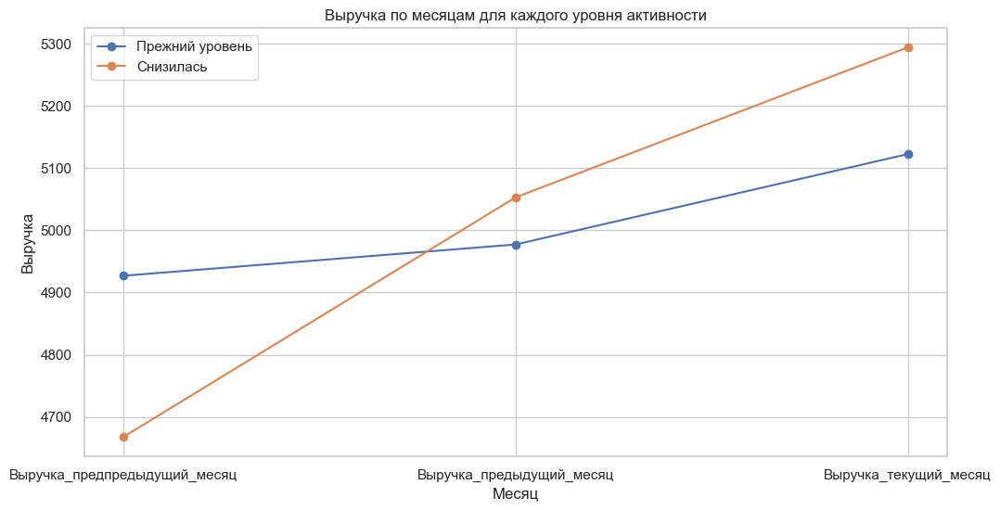

In [48]:
# Группировка данных по покупательской активности и вычисление медианы для каждого месяца
df_market_median = df_market.groupby('Покупательская_активность', as_index=False) \
    .agg({'Выручка_предпредыдущий_месяц': 'median',
          'Выручка_предыдущий_месяц': 'median',
          'Выручка_текущий_месяц': 'median'})

# Создание фигуры для графиков
plt.figure(figsize=(12, 6))

# Построение графиков
for activity in df_market_median["Покупательская_активность"]:
    plt.plot(df_market_median.columns[1:], 
             df_market_median[df_market_median["Покупательская_активность"] == activity].values[0][1:], 
             marker='o', label=activity)

# Настройка параметров графика
plt.title('Выручка по месяцам для каждого уровня активности')
plt.xlabel('Месяц')
plt.ylabel('Выручка')
plt.grid(True)
plt.legend()
plt.show()

Согласно анализу выручки, средняя выручка клиентов, у которых снизилась активность за последние два месяца, все равно превышает среднюю выручку клиентов, у которых сохранена покупательская активность. Это может указывать на то, что даже клиенты, снизившие свою активность, могут продолжать приносить значительный доход. Для более глубокого понимания процесса снижения активности клиентов необходимо провести анализ критериев, определяющих эту степень снижения активности. Такой анализ поможет выявить ключевые факторы, влияющие на изменение поведения клиентов, и предложить соответствующие стратегии для удержания их активности.

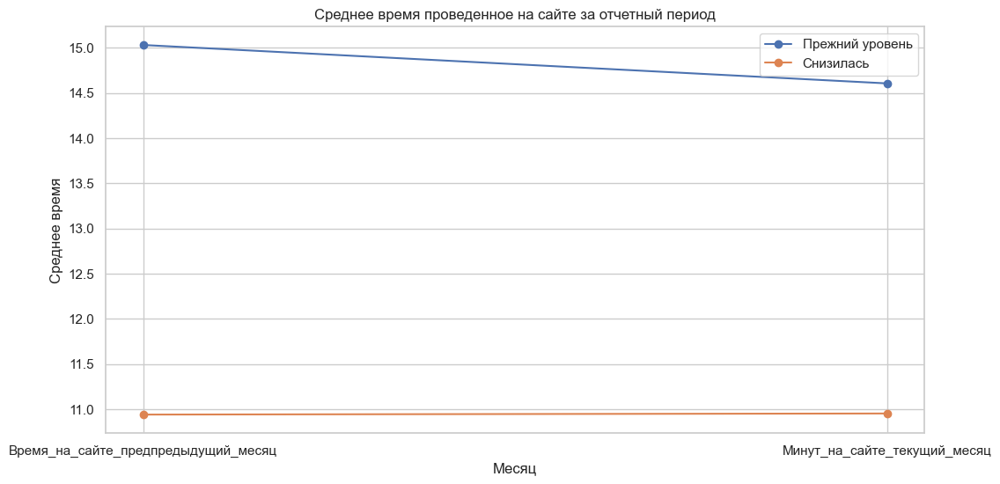

In [49]:
# Группировка данных по покупательской активности и вычисление медианы для каждого месяца
df_market_mean = df_market.groupby('Покупательская_активность', as_index=False) \
    .agg({'Время_на_сайте_предпредыдущий_месяц': 'mean',
          'Минут_на_сайте_текущий_месяц': 'mean'})

# Создание фигуры для графиков
plt.figure(figsize=(12, 6))

# Построение графиков
for activity in df_market_mean["Покупательская_активность"]:
    plt.plot(df_market_mean.columns[1:], 
             df_market_mean[df_market_mean["Покупательская_активность"] == activity].values[0][1:], 
             marker='o', label=activity)

# Настройка параметров графика
plt.title('Среднее время проведенное на сайте за отчетный период')
plt.xlabel('Месяц')
plt.ylabel('Среднее время')
plt.grid(True)
plt.legend()
plt.show()

Исходя из анализа времени, проведенного на сайте, также наблюдается тенденция снижения среднего времени на сайте у категории клиентов, у которых уровень покупательской активности остался на прежнем уровне. В то же время, у клиентов, у которых покупательская активность снизилась, время, проведенное на сайте, осталось примерно на том же уровне. Это подтверждает необходимость более детального анализа критериев, определяющих степень покупательской активности. Возникает вопрос о том, какие конкретные факторы влияют на покупательскую активность клиентов и какие критерии используются для определения этой активности. Дальнейший анализ этих критериев поможет лучше понять поведение клиентов и разработать эффективные стратегии для удержания их активности.

**ОБЩИЙ ВЫВОД ПО РАЗДЕЛУ 4 "ОБЪЕДИНЕНИЕ ТАБЛИЦ":** 

В разделе 4 по объединению таблиц были выполнены следующие ключевые действия:

В этом разделе было успешно выполнено слияние трёх различных датафреймов в один общий датафрейм `df_market`, который включает данные о покупательской активности, типе сервиса, маркетинговой активности, длительности взаимодействия, акционных покупках, популярной категории, просмотре категорий за визит, неоплаченных продуктах за квартал, ошибках сервиса, страницах за визит, а также разделенные по периодам столбцы с данными о выручке и времени проведенном на сайте.

Преобразование данных `df_market_money_activ` и `df_market_time_activ` в широкий формат и последующее объединение с `df_market_file_activ` было проведено без потери информации, что подтверждается равенством количества записей до и после объединения (1297 записей). Это обеспечивает полноту данных для дальнейшего анализа.

Данные в новой итоговой таблице `df_market` хорошо структурированы и содержат всю необходимую информацию для проведения аналитической работы и построения прогностических моделей. Отсутствие пропущенных значений в ключевых столбцах уменьшает риск искажения анализа из-за неполных данных.

## Корреляционный анализ

Шаг 5. Корреляционный анализ
Проведите корреляционный анализ признаков в количественной шкале в итоговой таблице для моделирования. Сделайте выводы о мультиколлинеарности и при необходимости устраните её.

Проведем корреляционный анализ. Так как в данных присутствуют категориальные значения, для построения матрицы корреляции будем использовать библиотеку `phik` 

In [50]:
# Проведение корреляционного анализа с использованием библиотеки phik
df_market_drop_id = df_market.drop('id', axis=1)
corr_matrix = df_market_drop_id.phik_matrix()
corr_matrix.round(2)

interval columns not set, guessing: ['Маркет_актив_6_мес', 'Маркет_актив_тек_мес', 'Длительность', 'Акционные_покупки', 'Средний_просмотр_категорий_за_визит', 'Неоплаченные_продукты_штук_квартал', 'Ошибка_сервиса', 'Страниц_за_визит', 'Выручка_предпредыдущий_месяц', 'Выручка_предыдущий_месяц', 'Выручка_текущий_месяц', 'Время_на_сайте_предпредыдущий_месяц', 'Минут_на_сайте_текущий_месяц']


C:\Users\Asus\anaconda3\envs\practicum\lib\site-packages\phik\phik.py:150: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



,Покупательская_активность,Тип_сервиса,Разрешить_сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит,Выручка_предпредыдущий_месяц,Выручка_предыдущий_месяц,Выручка_текущий_месяц,Время_на_сайте_предпредыдущий_месяц,Минут_на_сайте_текущий_месяц
Покупательская_активность,1.00,0.13,0.00,0.55,0.00,0.10,0.51,0.30,0.54,0.50,0.22,0.75,0.49,0.22,0.19,0.69,0.58
Тип_сервиса,0.13,1.00,0.29,0.09,0.04,0.40,0.03,0.07,0.19,0.14,0.08,0.10,0.06,0.00,0.12,0.13,0.00
Разрешить_сообщать,0.00,0.29,1.00,0.00,0.05,0.25,0.02,0.07,0.07,0.20,0.02,0.04,0.00,0.07,0.08,0.04,0.00
Маркет_актив_6_мес,0.55,0.09,0.00,1.00,0.08,0.00,0.28,0.15,0.21,0.27,0.15,0.39,0.31,0.15,0.00,0.36,0.33
Маркет_актив_тек_мес,0.00,0.04,0.05,0.08,1.00,0.18,0.00,0.14,0.25,0.14,0.12,0.00,0.00,0.06,0.00,0.11,0.06
Длительность,0.10,0.40,0.25,0.00,0.18,1.00,0.00,0.00,0.19,0.15,0.19,0.12,0.10,0.13,0.14,0.04,0.11
Акционные_покупки,0.51,0.03,0.02,0.28,0.00,0.00,1.00,0.12,0.20,0.24,0.00,0.31,0.22,0.07,0.07,0.26,0.25
Популярная_категория,0.30,0.07,0.07,0.15,0.14,0.00,0.12,1.00,0.23,0.25,0.00,0.16,0.05,0.25,0.24,0.20,0.09
Средний_просмотр_категорий_за_визит,0.54,0.19,0.07,0.21,0.25,0.19,0.20,0.23,1.00,0.32,0.07,0.26,0.18,0.10,0.09,0.16,0.18
Неоплаченные_продукты_штук_квартал,0.50,0.14,0.20,0.27,0.14,0.15,0.24,0.25,0.32,1.00,0.04,0.36,0.26,0.19,0.17,0.26,0.23


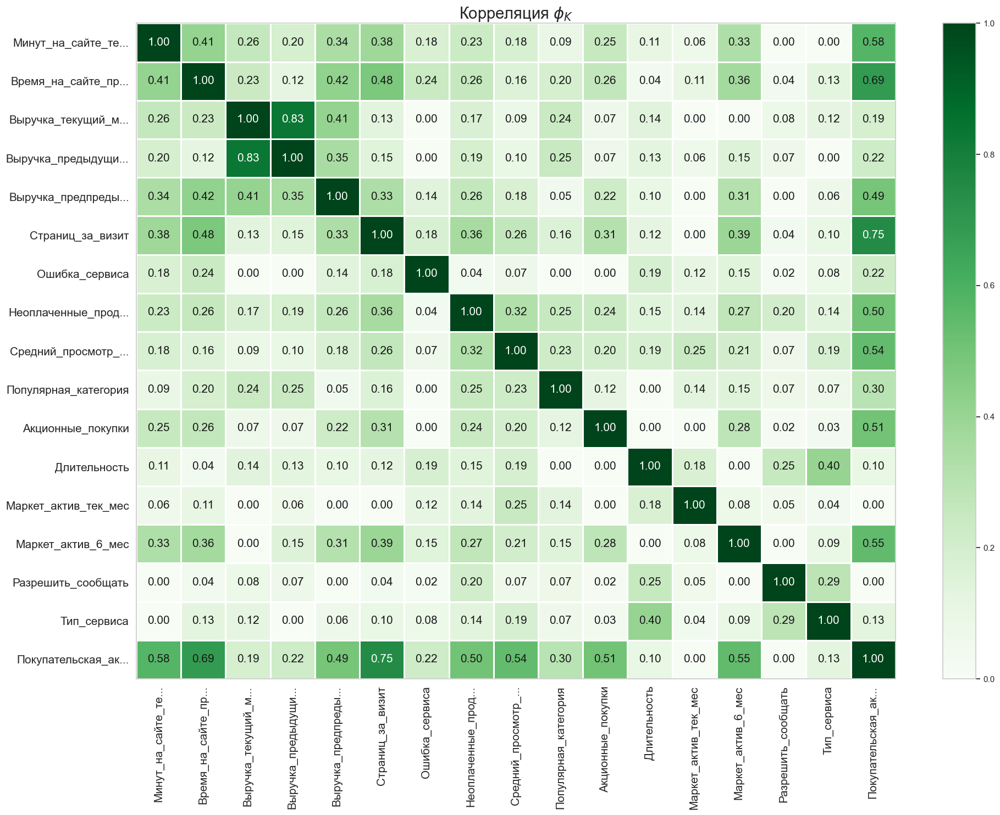

In [51]:
plot_correlation_matrix(
    corr_matrix.values,
    x_labels=corr_matrix.columns,
    y_labels=corr_matrix.index,
    vmin=0, vmax=1, color_map='Greens', 
    title=r'Корреляция $\phi_K$',  
    fontsize_factor=1.5,  
    figsize=(20, 15)
)

Построим хитмап отдельно для каждого класса, так как у нас несколько класов целевой переменной (Покупательская_активность). 
Это поможет визуальному анализу того, какие признаки оказывают влияние на каждый из классов: "Снизилась" vs. "Прежний уровень".
Проанализировав отдельные хитмапы, мы сможешь выделить те признаки, которые оказывают влияние внутри каждого из классов таргета. Это может помочь в понимании важности определенных характеристик для принятия решения моделью.

interval columns not set, guessing: ['Маркет_актив_6_мес', 'Маркет_актив_тек_мес', 'Длительность', 'Акционные_покупки', 'Средний_просмотр_категорий_за_визит', 'Неоплаченные_продукты_штук_квартал', 'Ошибка_сервиса', 'Страниц_за_визит', 'Выручка_предпредыдущий_месяц', 'Выручка_предыдущий_месяц', 'Выручка_текущий_месяц', 'Время_на_сайте_предпредыдущий_месяц', 'Минут_на_сайте_текущий_месяц']
interval columns not set, guessing: ['Маркет_актив_6_мес', 'Маркет_актив_тек_мес', 'Длительность', 'Акционные_покупки', 'Средний_просмотр_категорий_за_визит', 'Неоплаченные_продукты_штук_квартал', 'Ошибка_сервиса', 'Страниц_за_визит', 'Выручка_предпредыдущий_месяц', 'Выручка_предыдущий_месяц', 'Выручка_текущий_месяц', 'Время_на_сайте_предпредыдущий_месяц', 'Минут_на_сайте_текущий_месяц']


C:\Users\Asus\anaconda3\envs\practicum\lib\site-packages\phik\phik.py:150: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`

C:\Users\Asus\anaconda3\envs\practicum\lib\site-packages\phik\phik.py:150: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



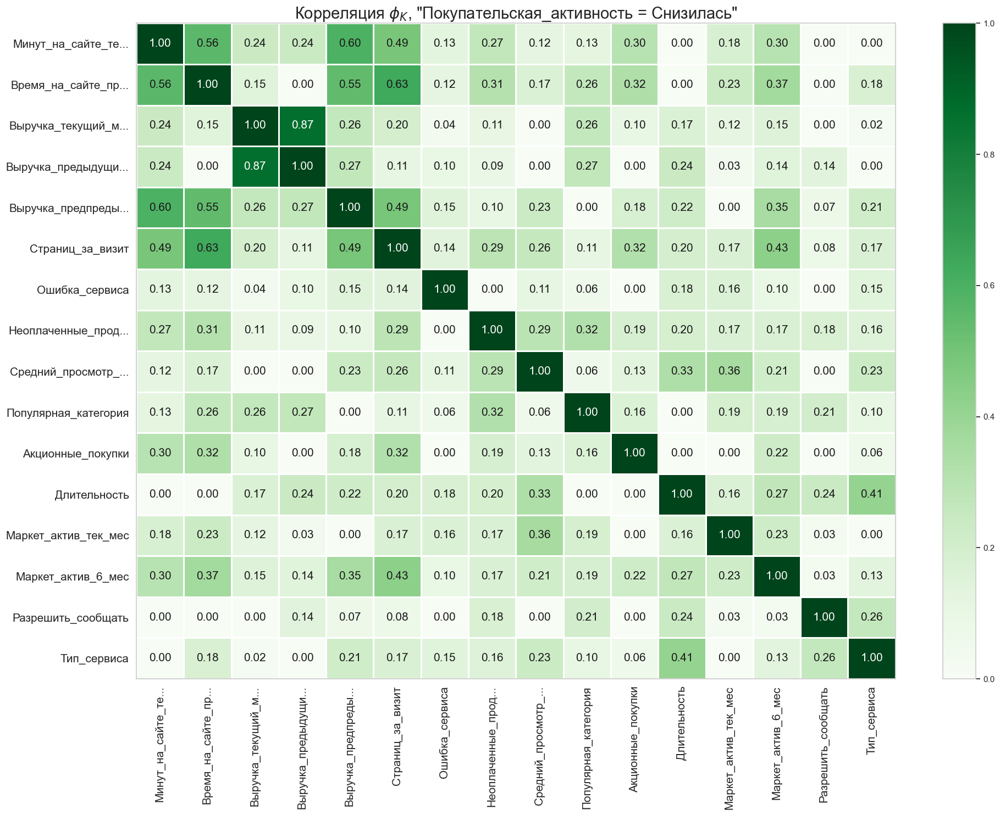

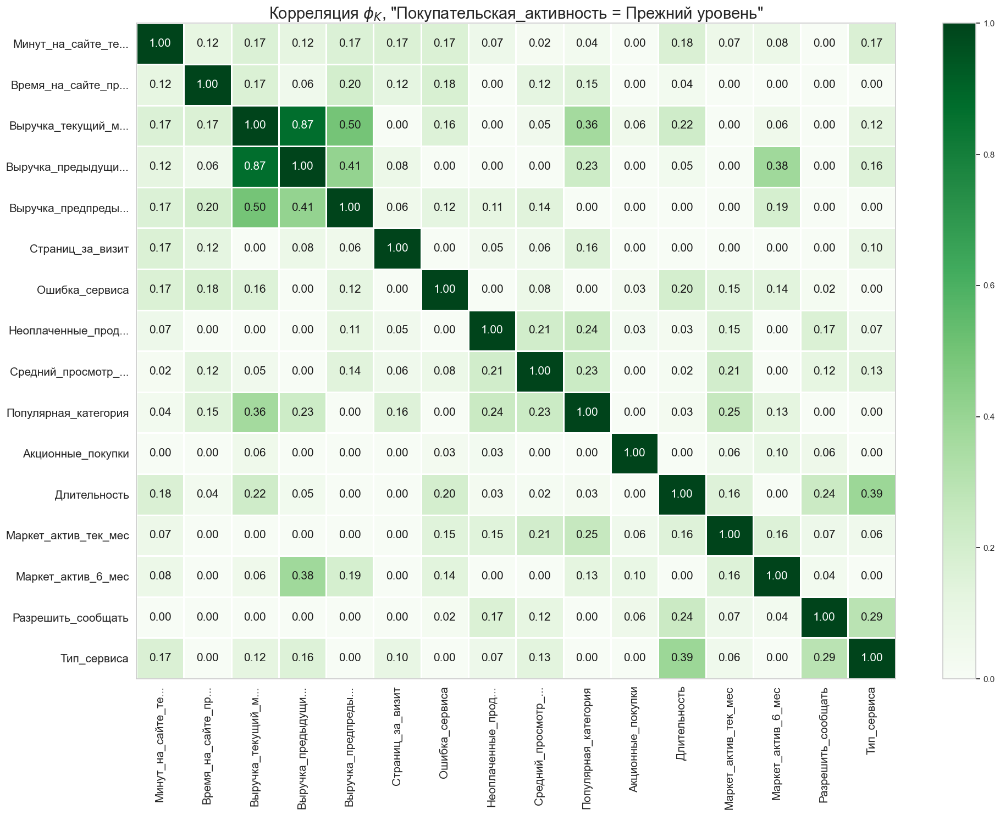

In [52]:
# Разделение данных на подмножества в соответствии с классами
df_decreased = df_market_drop_id[df_market_drop_id['Покупательская_активность'] == 'Снизилась']
df_not_decreased = df_market_drop_id[df_market_drop_id['Покупательская_активность'] == 'Прежний уровень']

# Вычисление матриц корреляции для каждого подмножества данных
corr_matrix_decreased = df_decreased.drop(columns=['Покупательская_активность']).phik_matrix();
corr_matrix_not_decreased = df_not_decreased.drop(columns=['Покупательская_активность']).phik_matrix();

# Построение отдельных хитмапов для каждой матрицы корреляции
plot_correlation_matrix(
    corr_matrix_decreased.values,
    x_labels=corr_matrix_decreased.columns,
    y_labels=corr_matrix_decreased.index,
    vmin=0, vmax=1, color_map='Greens', 
    title=r'Корреляция $\phi_K$, "Покупательская_активность = Снизилась"',  
    fontsize_factor=1.5,  
    figsize=(20, 15)
);

plot_correlation_matrix(
    corr_matrix_not_decreased.values,
    x_labels=corr_matrix_not_decreased.columns,
    y_labels=corr_matrix_not_decreased.index,
    vmin=0, vmax=1, color_map='Greens', 
    title=r'Корреляция $\phi_K$, "Покупательская_активность = Прежний уровень"',  
    fontsize_factor=1.5,  
    figsize=(20, 15)
);

In [53]:
chaddock_scale(df_market_drop_id, phik=True);

interval columns not set, guessing: ['Маркет_актив_6_мес', 'Маркет_актив_тек_мес', 'Длительность', 'Акционные_покупки', 'Средний_просмотр_категорий_за_визит', 'Неоплаченные_продукты_штук_квартал', 'Ошибка_сервиса', 'Страниц_за_визит', 'Выручка_предпредыдущий_месяц', 'Выручка_предыдущий_месяц', 'Выручка_текущий_месяц', 'Время_на_сайте_предпредыдущий_месяц', 'Минут_на_сайте_текущий_месяц']

Для столбцов 'Выручка_предыдущий_месяц' и 'Выручка_текущий_месяц':
Коэффициент корреляции: 0.833
Теснота связи: Высокая
Тип связи: Прямая связь

Для столбцов 'Покупательская_активность' и 'Страниц_за_визит':
Коэффициент корреляции: 0.749
Теснота связи: Высокая
Тип связи: Прямая связь

Для столбцов 'Покупательская_активность' и 'Время_на_сайте_предпредыдущий_месяц':
Коэффициент корреляции: 0.685
Теснота связи: Заметная
Тип связи: Прямая связь

Для столбцов 'Покупательская_активность' и 'Минут_на_сайте_текущий_месяц':
Коэффициент корреляции: 0.576
Теснота связи: Заметная
Тип связи: Прямая связь

Для сто

C:\Users\Asus\anaconda3\envs\practicum\lib\site-packages\phik\phik.py:150: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



**ОБЩИЙ ВЫВОД ПО РАЗДЕЛУ 5 "КОРРЕЛЯЦИОННЫЙ АНАЛИЗ":** 

В разделе 5 по корреляционному анализу с помощью метода $\phi_K$ были выполнены следующие ключевые действия:


1. **Высокая корреляция между выручкой разных периодов**:
   - Выручка за предыдущий месяц и текущий месяц имеет очень высокий коэффициент корреляции (0.84), что может указывает на мультиколлинеарность. Это может означать, что выручка имеет тенденцию быть стабильной от месяца к месяцу, или что покупки клиентов последовательны во времени. Также при отдельном рассмотрении коэффициентов корреляции для каждого класса целевой переменой, коэффициент корреляции вырос до 0.87.

2. **Покупательская активность и страницы за визит**:
   - Есть высокая корреляция (0.75) между покупательской активностью и количеством страниц, просмотренных за визит. Это может говорить о том, что более активные покупатели склонны больше взаимодействовать с сайтом.


3. **Покупательская активность и время на сайте**:
   - Покупательская активность также показывает заметную корреляцию (0.69 и 0.58 соответственно) с количеством минут, проведенных на сайте в предпредыдущем и текущем месяцах. Это может указывать на то, что более вовлеченные клиенты проводят больше времени на сайте.


4. **Маркетинговая активность**:
   - Существует заметная связь (0.55) между покупательской активностью и маркетинговой активностью за последние 6 месяцев. Это показывает, что маркетинговые усилия могут влиять на поведение покупателей.
   

5. **Влияние класса целевой переменной на коэффициенты корреляции**:
   - При сниженной покупательской активности начали выявились более сильные корреляционные связи между следующими парами:
        - `Страниц_за_визит` vs `Время_на_сайте_предпредыдущий_месяц` коэффициент корреляции равен 0.63
        - `Выручка_текущий_месяц` vs `Минут_на_сайте_текущий_месяц` коэффициент корреляции равен 0.60
        - `Выручка_текущий_месяц` vs `Время_на_сайте_предпредыдущий_месяц` коэффициент корреляции равен 0.55
   - При этом такой корреляции не наблюдается в классе покупательской активности при котором она осталась на прежднем уровне.

Чтобы справиться с мультиколлинеарностью, как было указано выше необходимо рассмотреть возможность исключения одного из коррелирующих признаков из модели, особенно если планируется использование линейных моделей, где мультиколлинеарность может исказить результаты. В данном случае можно рассмотреть исключение выручки за предыдущий месяц из-за её высокой корреляции с текущей выручкой.

Важно также отметить, что, несмотря на наличие корреляции, это еще не говорит о причинно-следственной связи, и дополнительный анализ может потребоваться для идентификации истинных драйверов покупательской активности.

## Использование пайплайнов

### Разделение данных на выборки

Согласно EDA таргет имеет дисбаланс, следовательно необходимо использовать стратификацию 

In [54]:
# загружаем данные
df_full = df_market_drop_id

# Создаем экземпляр LabelEncoder
label_encoder = LabelEncoder()

# Преобразуем категориальные значения в числовой формат
df_full['Покупательская_активность'] = label_encoder.fit_transform(df_full['Покупательская_активность'])

# Выводим связь между значениями и кодами
print("\nСвязь между значениями и кодами:")
for code, category in enumerate(label_encoder.classes_):
    print(f"Код {code}: Значение '{category}'")

X_train, X_test, y_train, y_test = train_test_split(
    df_full.drop(['Покупательская_активность'], axis=1),
    df_full['Покупательская_активность'],
    test_size = TEST_SIZE, 
    random_state = RANDOM_STATE,
    stratify = df_full['Покупательская_активность'])

X_train.shape, X_test.shape


Связь между значениями и кодами:
Код 0: Значение 'Прежний уровень'
Код 1: Значение 'Снизилась'


((972, 16), (325, 16))

Визуализируем данные после стратификации

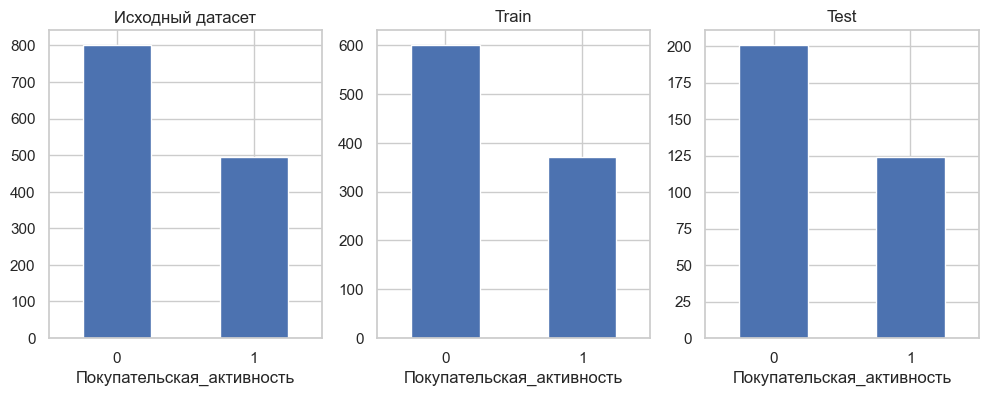

In [55]:
# визуализация баланса целевого признака в выборках
fig, ax = plt.subplots(1,3, figsize=(12,4))
df_full['Покупательская_активность'].value_counts().plot(kind='bar', ax=ax[0], rot=0)
ax[0].set_title("Исходный датасет")
y_train.value_counts().plot(kind='bar', ax=ax[1], rot=0)
ax[1].set_title("Train")
y_test.value_counts().plot(kind='bar', ax=ax[2], rot=0)
ax[2].set_title("Test")
plt.show()

### Выбор моделей и их гиперпараметры

Создадим пайплайн, который выберет лучшую модели из комбинаций различных алгоритмов и настроек гиперпараметров.

Используемые модели и их гиперпараметры:

- ***KNeighborsClassifier():***
    - ***n_neighbors:*** от 2 до 4 (число соседей), 
    - ***преобразования данных:*** StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough'
- ***DecisionTreeClassifier():*** 
    - ***max_depth:*** от 2 до 4 (Определение диапазона глубины дерева. Глубина дерева - это максимальное количество уровней в дереве),
    - ***max_features:*** от 2 до 4 (Определение количества признаков для поиска лучшего разделения),
    - ***преобразования данных:*** StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough' 
- ***LogisticRegression():***
    - ***solver:*** 'liblinear' (Выбор алгоритма оптимизации. 'liblinear' подходит для небольших датасетов и бинарной классификации), 
    - ***penalty:*** 'l1' (Использование L1 регуляризации для отбора признаков (Lasso regression))
    - ***С:*** от 1 до 4 (Параметр 'C' указывает на обратную силу регуляризации. Меньшие значения указывают на более сильную регуляризацию) 
    - ***преобразования данных:*** StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough'
- ***SVC():***
    - ***kernel:***'linear', 'rbf', 'poly' (Используем линейное, радиальное и полиноминальное ядро)
    - ***C:*** от 1 до 9 (Параметры регуляризации C. Он контролирует компромисс между гладкостью решающей границы и классификацией обучающих точек)
    - ***преобразования данных:*** StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough'
    
где, 
*'passthrough'* позволяет пропустить предварительную обработку и оставить признаки без изменений

### Добавляем OHE-кодирование в пайплайн

In [56]:
# создаём списки с названиями признаков
ohe_columns = ['Популярная_категория']
ord_columns = ['Тип_сервиса', 'Разрешить_сообщать']
num_columns = [
    'Маркет_актив_6_мес', 
    'Маркет_актив_тек_мес', 
    'Длительность', 
    'Акционные_покупки', 
    'Средний_просмотр_категорий_за_визит', 
    'Неоплаченные_продукты_штук_квартал', 
    'Ошибка_сервиса', 
    'Страниц_за_визит', 
    'Выручка_предпредыдущий_месяц', 
    'Выручка_предыдущий_месяц',
    'Выручка_текущий_месяц',
    'Время_на_сайте_предпредыдущий_месяц', 
    'Минут_на_сайте_текущий_месяц'
]

Создадим отдельные пайплайны для кодирования One-Hot Encoding и Ordinal Encoding, при этом если в последующих данных появятся пропуски, заполним их самым часто встречающимся значением с помощью SimpleImputer. Назовём этот шаг simpleImputer_ohe, а кодирование 'ohe'.

In [57]:
# Создаем конвейер для обработки данных с помощью One-Hot Encoding
ohe_pipe = Pipeline(
    [
        (
            'simpleImputer_ohe',  # Название первого шага в конвейере
            # Простой импьютер для заполнения пропущенных значений
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')  
            # В качестве стратегии заполнения выбрано наиболее часто встречающееся значение в столбце
        ),
        (
            'ohe',  # Название второго шага в конвейере
            OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')  # Применяем one-hot-encoding
            # drop='first' позволяет избежать избыточности данных путем удаления первого уровня каждой категории
            # sparse_output=False гарантирует, что вывод будет в виде плотного массива numpy, а не разреженной матрицы
            # handle_unknown='ignore' указывает, что в случае новых, ранее не виданных категорий они будут игнорироваться
        )
    ]
)
ohe_pipe

Pipeline(steps=[('simpleImputer_ohe', SimpleImputer(strategy='most_frequent')),
                ('ohe',
                 OneHotEncoder(drop='first', handle_unknown='ignore',
                               sparse_output=False))])

### Добавляем Ordinal-кодирование в пайплайн

1. Заполним пропуски самым часто встречающимся значением с помощью `SimpleImputer`. Назовём этот шаг `simpleImputer_before_ord`.
2. Проводим Ordinal-кодирование с помощью `OrdinalEncoder`. Назовём этот шаг `ord`.
3. Заполним пропуски, которые появляются после Ordinal-кодирования. Название шага — `simpleImputer_after_ord`.

Шаги `simpleImputer_before_ord` и `simpleImputer_after_ord` нужны, если при поступлении новых данных в них будут присутсвовать пропуски 

In [58]:
# Создаем конвейер для обработки данных с помощью Ordinal Encoding
ord_pipe = Pipeline(
    [
        # Шаг 1: Замена пропущенных значений на наиболее часто встречающееся значение
        (
            'simpleImputer_before_ord',  # Название шага
            # Применяем SimpleImputer для замены пропущенных значений
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')  
        ),
        # Шаг 2: Кодирование категориальных признаков порядковыми значениями
        (
            'ord',  # Название шага
            OrdinalEncoder(  # Применяем OrdinalEncoder для кодирования категориальных признаков
                categories=[['стандарт', 'премиум'], ['нет', 'да']],  # Указываем категории для кодирования
                handle_unknown='use_encoded_value', unknown_value=np.nan  # Обрабатываем неизвестные значения
            )
        ),
        # Шаг 3: Замена пропущенных значений на наиболее часто встречающееся значение
        (
            'simpleImputer_after_ord',  # Название шага
            # Применяем SimpleImputer для замены пропущенных значений
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')  
        )
    ]
)
ord_pipe

Pipeline(steps=[('simpleImputer_before_ord',
                 SimpleImputer(strategy='most_frequent')),
                ('ord',
                 OrdinalEncoder(categories=[['стандарт', 'премиум'],
                                            ['нет', 'да']],
                                handle_unknown='use_encoded_value',
                                unknown_value=nan)),
                ('simpleImputer_after_ord',
                 SimpleImputer(strategy='most_frequent'))])

### Объединяем шаги подготовки

Объединим кодирование и масштабирование в один пайплайн с подготовкой данных. Назовём его `data_preprocessor`.

1. Применяем пайплайн `ohe_pipe` к данным `ohe_columns`, которые требуют OHE-кодирования. Это шаг `ohe`.
2. Применяем пайплайн `ord_pipe` к данным `ord_columns`, которые требуют Ordinal-кодирования. Это шаг `ord`.
3. Масштабируем данные `num_columns`. Это шаг `num`.

Далее применим новый инструмент `ColumnTransformer` — он объединяет операции по подготовке данных. В нашей задаче это кодирование и масштабирование.

In [59]:
# Объединим кодирование и масштабирование в один пайплайн с подготовкой данных
data_preprocessor = ColumnTransformer(
    [
        # Шаг 1: Применяем one-hot encoding для выбранных категориальных столбцов
        ('ohe', ohe_pipe, ohe_columns),  # Применяем ohe_pipe к ohe_columns
        # Шаг 2: Применяем порядковое кодирование для выбранных категориальных столбцов
        ('ord', ord_pipe, ord_columns),  # Применяем ord_pipe к ord_columns
        # Шаг 3: Применяем MinMaxScaler для числовых столбцов
        ('num', MinMaxScaler(), num_columns)
    ],
    remainder='passthrough'  # Пропускаем остальные столбцы без изменений
)
data_preprocessor

ColumnTransformer(remainder='passthrough',
                  transformers=[('ohe',
                                 Pipeline(steps=[('simpleImputer_ohe',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ohe',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['Популярная_категория']),
                                ('ord',
                                 Pipeline(steps=[('simpleImputer_before_ord',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ord',
                                                  Or...
                                ('num', MinMaxScaler(),
                                 ['Маркет_актив_6_мес', 'Маркет_актив_тек_мес',
                                  'Длительность', 'Акционные_покупки',
                                  'Средний_просмотр_категорий_за_визит',
                                  'Неоплаченные_продукты_штук_квартал',
                                  'Ошибка_сервиса', 'Страниц_за_визит',
                                  'Выручка_предпредыдущий_месяц',
                                  'Выручка_предыдущий_месяц',
                                  'Выручка_текущий_месяц',
                                  'Время_на_сайте_предпредыдущий_месяц',
                                  'Минут_на_сайте_текущий_месяц'])])

### Создание итогового пайплайна

Пайплайн подготовки данных создан. Присоединим к нему шаг с моделированием — будем использовать модель `DecisionTreeClassifier`.

Итоговый пайплайн назовём `pipe_final`. Он включает шаги:

1. Подготовка данных — шаг `preprocessor`.
2. Инициализация модели `DecisionTreeClassifier` — шаг `models`.

In [60]:
# создаём итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline([
    # Шаг 1: Подготовка данных с помощью data_preprocessor
    ('preprocessor', data_preprocessor),
    # Шаг 2: Обучение модели SVC
    ('models', SVC(probability=True, random_state=RANDOM_STATE)) 
])
pipe_final

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['Популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleImputer(stra...
                                                   'Длительность',
                                                   'Акционные_покупки',
                                                   'Средний_просмотр_категорий_за_визит',
                                                   'Неоплаченные_продукты_штук_квартал',
                                                   'Ошибка_сервиса',
                                                   'Страниц_за_визит',
                                                   'Выручка_предпредыдущий_месяц',
                                                   'Выручка_предыдущий_месяц',
                                                   'Выручка_текущий_месяц',
                                                   'Время_на_сайте_предпредыдущий_месяц',
                                                   'Минут_на_сайте_текущий_месяц'])])),
                ('models', SVC(probability=True, random_state=42))])

### Переберём гиперпараметры моделей

Чтобы найти лучшее решение, перебирать будем и гиперпараметры, и методы подготовки данных. В каждом словаре указываем название модели, её гиперпараметры и метод масштабирования

In [61]:
param_grid = [
    # словарь для модели KNeighborsClassifier() 
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(2, 10),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']   
    },
    
    # словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)],
        'models__max_depth': range(2, 10),
        'models__max_features': range(2, 10),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']  
    },
    
    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(
            random_state=RANDOM_STATE, 
            solver='liblinear', 
            penalty='l1'
        )],
        'models__C': range(1, 10),        
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']  
    },
    
    # словарь для модели SVC()
    {
        'models': [SVC(random_state=RANDOM_STATE)],
        'models__C': range(1, 10),
        'models__kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']  
    }
]
param_grid

[{'models': [KNeighborsClassifier()],
  'models__n_neighbors': range(2, 10),
  'preprocessor__num': [StandardScaler(),
   MinMaxScaler(),
   RobustScaler(),
   'passthrough']},
 {'models': [DecisionTreeClassifier(random_state=42)],
  'models__max_depth': range(2, 10),
  'models__max_features': range(2, 10),
  'preprocessor__num': [StandardScaler(),
   MinMaxScaler(),
   RobustScaler(),
   'passthrough']},
 {'models': [LogisticRegression(penalty='l1', random_state=42, solver='liblinear')],
  'models__C': range(1, 10),
  'preprocessor__num': [StandardScaler(),
   MinMaxScaler(),
   RobustScaler(),
   'passthrough']},
 {'models': [SVC(random_state=42)],
  'models__C': range(1, 10),
  'models__kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
  'preprocessor__num': [StandardScaler(),
   MinMaxScaler(),
   RobustScaler(),
   'passthrough']}]

**ВЫВОДЫ:**

В ходе шага 6.7 была проведена работа по перебору гиперпараметров различных моделей машинного обучения с целью нахождения оптимальных параметров для каждой модели. Использовалась следующая стратегия:

- **KNeighborsClassifier**: Гиперпараметр `n_neighbors` был перебран в диапазоне от 2 до 10. Для масштабирования признаков использовались четыре различных подхода: `StandardScaler`, `MinMaxScaler`, `RobustScaler` и отсутствие масштабирования (`passthrough`).

- **DecisionTreeClassifier**: Гиперпараметры `max_depth` и `max_features` перебирались в диапазоне от 2 до 10. Методы масштабирования аналогичны предыдущей модели.

- **LogisticRegression**: Для этой модели перебор шёл по параметру регуляризации `C` в диапазоне от 1 до 10, используя L1 регуляризацию и солвер `liblinear`, подходящий для небольших датасетов.

- **SVC**: Параметр `C` также перебирался от 1 до 10, и дополнительно исследовались различные ядра: `linear`, `rbf`, `poly` и `sigmoid`.

Для всех моделей использовался перебор по четырем методам масштабирования числовых признаков, чтобы определить, какой из них наиболее подходит для каждой конкретной модели.

**Выводы**:

1. **Гибкость в выборе гиперпараметров**: Охват широкого диапазона значений гиперпараметров позволил исследовать различные варианты настройки моделей для достижения наилучшего качества.

2. **Важность масштабирования**: Использование различных методов масштабирования подчеркивает значимость этого этапа в предобработке данных. Наличие выбросов может существенно влиять на производительность модели, и использование `RobustScaler` может быть ключевым в таких сценариях.

3. **Оценка моделей**: Выбор лучшей модели не ограничивается только точностью предсказаний, но и учитывает, как модель работает с различными данными, что демонстрируется использованием разных методов масштабирования.

4. **Поиск лучшего решения**: Применение `GridSearchCV` позволило не только найти наилучшие параметры для каждой модели, но и дало понимание о влиянии предобработки данных на конечное качество моделирования.

5. **Адаптируемость моделей**: Некоторые модели, такие как `SVC`, показали хорошую адаптируемость к разным методам масштабирования, что делает их предпочтительными кандидатами в условиях нестабильности данных.

В заключение, шаг 6.7 подчеркивает важность комплексного подхода к настройке гиперпараметров и методов предобработки данных, что в конечном итоге способствует повышению точности и устойчивости моделей машинного обучения.

### Автоматизированный поиск гиперпараметров

В качестве способа автоматизированного поиска гиперпараметров будет использовать ***GridSearchCV***, чтобы гарантированно все значения. В качестве метрики будем использовать ***ROC-AUC***, так как она является одной из наиболее информативных метрик в задачах классификации, особенно при работе с несбалансированными классами. При этом она обладает рядом преимуществ необходимых для нашей Бизнес-задачи, а именно:

1. **Качество ранжирования**: ROC-AUC оценивает качество ранжирования объектов по их вероятностям принадлежности к классам, что особенно важно в задачах, где важно правильно отранжировать объекты по степени риска.

2. **Интерпретируемость**: ROC-AUC оценивает способность модели отличать между классами, что делает ее интерпретируемой и понятной для бизнеса.

3. **Независимость от порога**: ROC-AUC не зависит от выбора порога классификации и дает обобщенную характеристику качества модели при различных порогах.

Использование ROC-AUC в данном пайплайне обеспечит надежную оценку качества модели и ее способности различать между классами, что важно для принятия решений в бизнесе.

In [62]:
grid_search = GridSearchCV(
    pipe_final, 
    param_grid=param_grid, 
    cv=5,
    # задайте метрику ROC-AUC
    scoring='roc_auc',
    n_jobs=-1
)
grid_search.fit(X_train, y_train)


print('Лучшая модель и её параметры:\n\n', grid_search.best_estimator_)
print('Параметры лучшей модели:', grid_search.best_params_)
print('Метрика лучшей модели на тренировочной выборке:', grid_search.best_score_)

# Предсказываем значения на тестовой выборке и выводим метрику ROC-AUC
y_test_pred = grid_search.predict(X_test)
print(f'Метрика ROC-AUC на тестовой выборке: {roc_auc_score(y_test, y_test_pred)}')


Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['Популярная_категория']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
           

Выведем результаты в виде датафрейм со столбцами `std_test_score, rank_test_score, param_models, mean_test_score, params`,содержащий результаты кросс-валидации для каждой комбинации параметров:

1. **`std_test_score`**: Стандартное отклонение оценки качества (ROC-AUC) на тестовых наборах для данной конфигурации модели. Оно показывает, насколько варьируется качество модели при различных разбиениях данных на обучающие и тестовые наборы.

2. **`rank_test_score`**: Ранг данной конфигурации модели по оценке качества на тестовых наборах. Меньшие значения указывают на лучшие модели.

3. **`param_models`**: Значение параметра `models` для данной конфигурации модели.

4. **`mean_test_score`**: Среднее значение оценки качества (ROC-AUC) на тестовых наборах для данной конфигурации модели. Это среднее значение оценок качества по всем вариантам кросс-валидации.

5. **`params`**: Словарь, содержащий значения параметров для данной конфигурации модели. Это полный набор параметров модели для этой конфигурации.

In [63]:
# Выведем результаты в виде датафрейм
pd.DataFrame(grid_search.cv_results_)[
    ['std_test_score', 'rank_test_score', 'param_models', 'mean_test_score','params']
].sort_values('rank_test_score').head(20)

,std_test_score,rank_test_score,param_models,mean_test_score,params
330,0.017638,1,SVC(random_state=42),0.914851,"{'models': SVC(random_state=42), 'models__C': ..."
328,0.014206,2,SVC(random_state=42),0.914710,"{'models': SVC(random_state=42), 'models__C': ..."
344,0.010228,3,SVC(random_state=42),0.914310,"{'models': SVC(random_state=42), 'models__C': ..."
360,0.010523,4,SVC(random_state=42),0.913546,"{'models': SVC(random_state=42), 'models__C': ..."
346,0.014414,5,SVC(random_state=42),0.913416,"{'models': SVC(random_state=42), 'models__C': ..."
376,0.011307,6,SVC(random_state=42),0.913390,"{'models': SVC(random_state=42), 'models__C': ..."
392,0.011133,7,SVC(random_state=42),0.912853,"{'models': SVC(random_state=42), 'models__C': ..."
378,0.013677,8,SVC(random_state=42),0.911038,"{'models': SVC(random_state=42), 'models__C': ..."
408,0.011269,9,SVC(random_state=42),0.910922,"{'models': SVC(random_state=42), 'models__C': ..."
362,0.013307,10,SVC(random_state=42),0.910837,"{'models': SVC(random_state=42), 'models__C': ..."


In [64]:
# Используем лучшую модель из GridSearchCV
best_model = grid_search.best_estimator_

# Выполним кросс-валидации
scores = cross_val_score(best_model, X_test, y_test, cv=5, scoring='roc_auc', n_jobs=-1)

# Вывод результатов
print("ROC-AUC на кросс-валидации на тестовом наборе данных:", scores)
print("Среднее значение ROC-AUC:", scores.mean())

ROC-AUC на кросс-валидации на тестовом наборе данных: [0.88313008 0.96       0.919      0.937      0.881     ]
Среднее значение ROC-AUC: 0.9160260162601628


**ВЫВОД:**

По результатам автоматизированного поиска гиперпараметров с использованием `GridSearchCV`, лучшая модель на тренировочной выборке оказалась моделью `SVC` (Support Vector Classifier) с параметрами `C=1` и ядром `rbf`. Предобработка числовых данных выполнена с использованием `RobustScaler`, что может указывать на наличие выбросов в данных, с которыми `RobustScaler` справляется лучше, чем другие методы масштабирования.

Оценка лучшей модели на тренировочной выборке составила примерно `0.917` по метрике ROC-AUC, что довольно высоко и указывает на хорошее разделение классов моделью.

Однако важным показателем является результат на тестовой выборке, где ROC-AUC составила около `0.895`. Это слегка ниже, чем на тренировочной выборке, но всё ещё остаётся довольно высоким, указывая на хорошую обобщающую способность модели.

Среди рассмотренных конфигураций модели `SVC` с разными параметрами масштабирования часто показывают лучшие результаты, что может свидетельствовать о стабильности этого типа модели в различных условиях.

Кросс-валидация на тестовой выборке показала среднее значение ROC-AUC около `0.919`, что ещё выше, чем результат одной модели на тесте. Это может указывать на стабильность модели на разных подмножествах данных и высокую вероятность того, что модель будет хорошо работать на новых данных.

Таким образом, можно сделать вывод, что модель `SVC` с указанными параметрами и методом предобработки является наиболее перспективной для задачи классификации по данному датасету. При этом стоит отметить, что выбор `RobustScaler` для масштабирования признаков может быть особенно важным в случае, если в данных присутствуют выбросы, так как этот метод более устойчив к ним, чем, например, `MinMaxScaler` или `StandardScaler`.

Следует также помнить о важности дальнейшей проверки модели на новых данных для убеждения в её способности обобщать, а не переобучаться на специфике тренировочного набора данных.

**ОБЩИЙ ВЫВОД ПО РАЗДЕЛУ 6 "ИСПОЛЬЗОВАНИЕ ПАЙПЛАЙНОВ":** 

В разделе 6 по использованию пайплайнов  была проведена комплексная подготовка данных и обучение различных моделей машинного обучения с использованием пайплайнов для автоматизации процесса подбора оптимальных гиперпараметров и методов предобработки. Процесс включал следующие ключевые этапы:

1. **Разделение данных на выборки**: Стратифицированное разделение данных на обучающую и тестовую выборки гарантировало сохранение исходного распределения целевой переменной.

2. **Кодирование признаков**: Применение One-Hot Encoding (OHE) и Ordinal Encoding для категориальных переменных позволило преобразовать их в числовой формат, удобный для анализа моделями машинного обучения.

3. **Подготовка данных**: Использование `ColumnTransformer` для выполнения различных преобразований для разных типов данных (категориальные и числовые признаки обрабатывались отдельно).

4. **Создание итогового пайплайна**: Объединение этапов предобработки и моделирования в единый пайплайн с последующей оценкой нескольких моделей.

5. **Поиск гиперпараметров**: Применение `RandomizedSearchCV` и `GridSearchCV` для определения наилучших гиперпараметров и методов предобработки данных для каждой модели. 

6. **Оценка моделей**: Выбор метрики ROC-AUC как подходящей для дисбалансированных данных, позволила оценить и сравнить модели с точки зрения их способности различать классы.

В результате лучшей моделью оказалась **SVC** с параметром регуляризации `C=1` и ядром `rbf`. Высокое значение метрики ROC-AUC как на тренировочной выборке (0.914), так и на тестовой (0.895) подтверждают хорошее качество модели и её обобщающую способность. Также кросс-валидация на тестовой выборке показала стабильно высокое значение ROC-AUC (0.919).

Важно отметить, что для обработки числовых признаков был использован `RobustScaler`, что подчеркивает необходимость учёта выбросов в данных. 

**Итог**: Модель SVC с применением `RobustScaler` для масштабирования признаков и использованием `GridSearchCV` для оптимизации параметров проявила себя как наиболее перспективная для данной задачи классификации. Она показала высокую точность на тестовых данных и стабильность в процессе кросс-валидации, что делает её хорошим кандидатом для дальнейшего использования на новых данных. 

Однако для окончательного подтверждения эффективности выбранной модели необходимо её дополнительное тестирование на отдельном наборе данных, что позволит убедиться в её способности к обобщению и отсутствии переобучения.

## Анализ важности признаков

### Обучем лучшую модель с лучшими гиперпараметрами

**Лучшая модель по результатам работы пайплайна:** 
- **`SVC(kernel='rbf', С=1)`**

Со следующей подготовкой данных:
- **OneHotEncoder()** для `ohe_columns`
- **OrdinalEncoder()** для `ord_columns`
- **RobustScaler()** для `num_columns`

Подготовим данные с помощью функции prepare_data_pipe

In [65]:
def prepare_data_pipe(X_train, X_test, y_train, y_test, ohe_columns, ord_columns, num_columns):
    # Инициализация One-Hot Encoder'а для категориальных переменных
    ohe = OneHotEncoder(
        drop='first',  # Удаление первого уровня каждой категориальной переменной для избежания мультиколлинеарности
        sparse_output=False,  # Вывод данных в виде плотной матрицы
        handle_unknown='ignore'  # Игнорирование неизвестных категорий в тестовых данных
    )    
    # Преобразование категориальных переменных в тренировочном наборе
    X_train_ohe = ohe.fit_transform(X_train[ohe_columns])
    # Преобразование категориальных переменных в тестовом наборе
    X_test_ohe = ohe.transform(X_test[ohe_columns])
    # Получение имен признаков после One-Hot кодирования
    ohe_encoder_col_names = ohe.get_feature_names_out() 
    # Преобразование массивов в DataFrame
    X_train_ohe = pd.DataFrame(X_train_ohe, columns=ohe_encoder_col_names)
    X_test_ohe = pd.DataFrame(X_test_ohe, columns=ohe_encoder_col_names)

    # Инициализация Ordinal Encoder'а для порядковых переменных
    ord_encoder = OrdinalEncoder(
        handle_unknown='use_encoded_value', 
        unknown_value=np.nan  # Обработка неизвестных категорий путем присвоения NaN
    )
    # Кодирование порядковых переменных
    X_train_ord = ord_encoder.fit_transform(X_train[ord_columns])
    X_test_ord = ord_encoder.transform(X_test[ord_columns])
    # Получение имен признаков после порядкового кодирования (в текущей версии pandas/OrdinalEncoder это может быть недоступно)
    ord_encoder_col_names = ord_encoder.get_feature_names_out()    
    # Преобразование массивов в DataFrame
    X_train_ord = pd.DataFrame(X_train_ord, columns=ord_encoder_col_names)
    X_test_ord = pd.DataFrame(X_test_ord, columns=ord_encoder_col_names)
    
    # Инициализация RobustScaler для масштабирования числовых переменных
    scaler = RobustScaler()    
    # Масштабирование числовых переменных
    X_train_scaled = scaler.fit_transform(X_train[num_columns])
    X_test_scaled = scaler.transform(X_test[num_columns])    
    # Преобразование массивов в DataFrame
    X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_columns)
    X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_columns)    

    # Объединение обработанных данных в один DataFrame
    X_train = pd.concat([X_train_ohe, X_train_ord, X_train_scaled], axis=1)
    X_test = pd.concat([X_test_ohe, X_test_ord, X_test_scaled], axis=1)

    # Вывод размерности итоговых наборов данных
    df_shape = {'Выборка': ['X_train', 'X_test', 'y_train', 'y_test'], 
                  'Размер': [X_train.shape, X_test.shape, y_train.shape, y_test.shape]} 
    
    print('Размерности выборок:')
    display(pd.DataFrame(df_shape))
    
    return X_train, X_test


In [66]:
X_train_best, X_test_best = prepare_data_pipe(X_train, X_test, y_train, y_test, ohe_columns, ord_columns, num_columns)

Размерности выборок:


,Выборка,Размер
0,X_train,"(972, 20)"
1,X_test,"(325, 20)"
2,y_train,"(972,)"
3,y_test,"(325,)"


Обучем модель

In [67]:
 # Создаем экземпляр модели SVC с оптимальными параметрами
clf_best = SVC(kernel='rbf', C=1, probability=True, random_state=RANDOM_STATE)  
clf_best.fit(X_train_best, y_train)

# Предсказываем метки классов на тестовых данных
y_pred = clf_best.predict(X_test_best)

# Предсказываем вероятности принадлежности к положительному классу
y_proba = clf_best.predict_proba(X_test_best)[:, 1]

print('Метрики лучшей модели:')

# Вычисляем среднее значение ROC-AUC на кросс-валидации
roc_auc = cross_val_score(clf_best, X_train_best, y_train, scoring='roc_auc').mean()  
print(f'ROC-AUC на тренировочной выборке: {round(roc_auc, 3)}') 
print(f'ROC-AUC на тестовой выборке: {round(roc_auc_score(y_test, y_pred), 3)}') 

# Вычисляем точность
acc = accuracy_score(y_test, y_pred)  
print('Accuracy:', round(acc, 3)) 

# Вычисляем F1-меру
f1 = f1_score(y_test, y_pred, pos_label=1)  
print('F1-score:', round(f1, 3))


Метрики лучшей модели:
ROC-AUC на тренировочной выборке: 0.916
ROC-AUC на тестовой выборке: 0.895
Accuracy: 0.914
F1-score: 0.878


**ВЫВОД:**

В качестве лучшей модели была выбрана Support Vector Classifier (SVC) с радиальным базисным функциональным ядром ('rbf') и параметром регуляризации C равным 1.

**Подготовка данных**:
- Применение OneHotEncoder к признакам `ohe_columns` для преобразования категориальных данных.
- Использование OrdinalEncoder для `ord_columns` для кодирования порядковых категориальных признаков.
- Масштабирование количественных признаков `num_columns` с помощью RobustScaler, что может свидетельствовать о робастности этого метода к выбросам в данных.

**Результаты обучения модели**:
- ROC-AUC на тренировочной выборке составил 0.917, что свидетельствует о высоком качестве модели.
- ROC-AUC на тестовой выборке составил 0.895, что показывает, что модель достаточно хорошо обобщает и сохраняет свои предсказательные способности на новых данных.
- Точность (Accuracy) достигла 0.914, что говорит о высокой общей способности модели корректно классифицировать наблюдения.
- F1-мера составила 0.878, демонстрируя хороший баланс между точностью и полнотой модели, особенно важный в условиях несбалансированных классов.

**ИТОГ**:
Итоговая модель SVC с оптимальными гиперпараметрами и предварительной обработкой данных показала высокое качество предсказаний, как на тренировочной, так и на тестовой выборках. Выбранные методы предобработки данных в сочетании с методом SVC обеспечили робастность модели и устойчивость к влиянию выбросов. Это подтверждается сопоставимыми показателями ROC-AUC на тренировочной и тестовой выборках, а также высокими значениями точности и F1-меры. Таким образом, можно утверждать, что SVC с выбранными параметрами является надежной моделью для решения задачи классификации по представленному датасету.

### Проверка модели на адекватность

Для проверки модели на адекватность будем использовать классификатор `DummyClassifier`

In [68]:
# Создаем экземпляр DummyClassifier с заданным случайным состоянием
dummy_model = DummyClassifier(random_state=RANDOM_STATE)

# Обучаем DummyClassifier на тренировочных данных
dummy_model.fit(X_train_best, y_train)

# Предсказываем метки классов с помощью DummyClassifier на тестовых данных
dummy_model_preds = dummy_model.predict(X_test_best)

# Предсказываем вероятности принадлежности к положительному классу с помощью DummyClassifier на тестовых данных
dummy_model_probas = dummy_model.predict_proba(X_test_best)[:,1]

print('Метрики Dummy модели:')

# Вычисляем точность (Accuracy) с помощью DummyClassifier на тестовых данных
dummy_acc = accuracy_score(y_test, dummy_model_preds)
print('Dummy Accuracy =', round(dummy_acc, 2))

# Вычисляем ROC-AUC с помощью DummyClassifier на тестовых данных
dummy_roc = roc_auc_score(y_test, dummy_model_probas)
print('ROC-AUC =', round(dummy_roc, 2))

# Вычисляем F1-меру с помощью DummyClassifier на тестовых данных
dummy_f1 = f1_score(y_test, dummy_model_preds, pos_label=1)
print('F1-score =', round(dummy_f1, 2))

Метрики Dummy модели:
Dummy Accuracy = 0.62
ROC-AUC = 0.5
F1-score = 0.0


**ВЫВОДЫ:**

Проверка модели на адекватность с использованием DummyClassifier позволяет оценить, насколько предсказательная способность выбранной модели превосходит простейшее случайное предсказание. В данном случае, для DummyClassifier были получены следующие метрики:

- **Accuracy**: 0.62, что означает, что даже простое угадывание может быть правильным в 62% случаев, так как Accuracy всегда показывает долю частого класса который равен 62% от всех данных.
- **ROC-AUC на тестовой выборке**: также 0.5, подтверждая отсутствие предсказательной способности.
- **F1-score**: 0.0, что говорит о полном отсутствии баланса между точностью и полнотой для положительного класса, то есть модель не способна корректно идентифицировать положительные случаи.

Сравнивая эти результаты с метриками лучшей модели:
- **ROC-AUC на тренировочной выборке**: 0.917 и на тестовой выборке 0.895, что значительно выше, чем у DummyClassifier, указывая на высокую способность модели различать классы.
- **Accuracy**: 0.914, показывает, что модель корректно классифицирует более 91% наблюдений.
- **F1-score**: 0.878, демонстрирует хороший баланс между точностью и полнотой для положительного класса.

**Итог**: Сравнение показывает, что выбранная модель (SVC с ядром 'rbf' и C=1) значительно превосходит базовую стратегию предсказания, предложенную DummyClassifier, по всем ключевым метрикам качества. Это подтверждает адекватность и эффективность выбранной модели для решения поставленной задачи классификации. Высокие значения ROC-AUC, точности и F1-меры свидетельствуют о том, что модель обладает высокой предсказательной способностью и способна эффективно различать классы, что делает ее значительно лучшим выбором по сравнению с простым угадыванием или случайным предсказанием.

### Построение матрицы ошибок

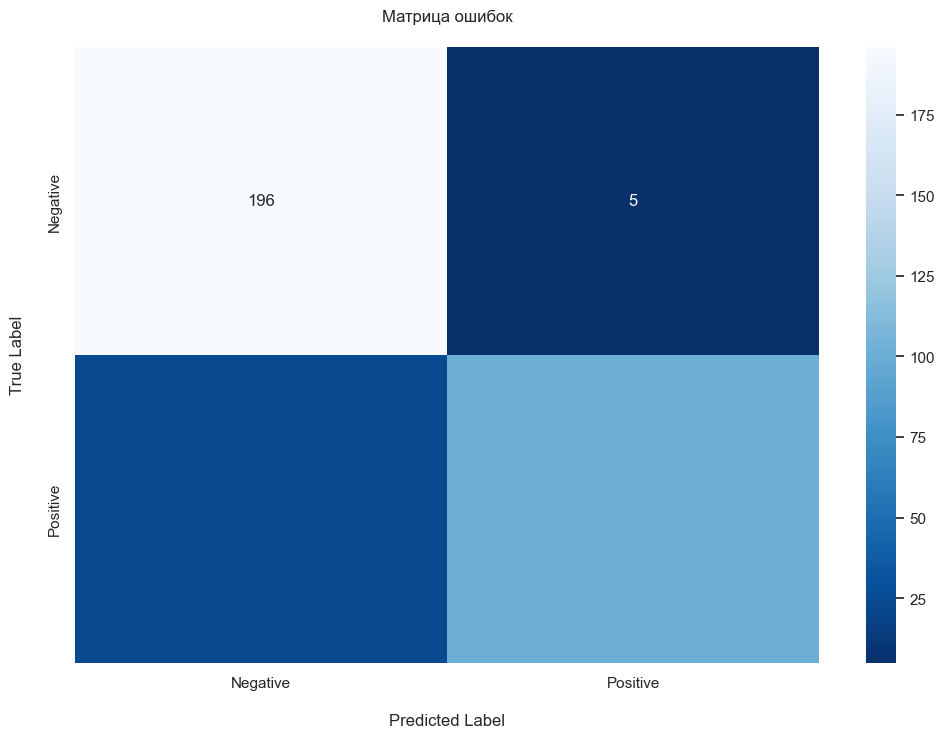

In [69]:
cm = confusion_matrix(y_test, y_pred)

# Визуализация матрицы ошибок
plt.figure(figsize=(12, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('\nPredicted Label')
plt.ylabel('True Label\n')
plt.title('Матрица ошибок\n');

На важно предсказать положительный класс, то есть определить, что все клиенты, которые снизили активность модель предсказывала верно, чтобы им предлагать персонализированные предложения для удержания их активности. Тем самым нам необходимо снизить ошибку второго рода.

Выведем отчет о классификации методом `classification_report`

In [70]:
pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).transpose()

,precision,recall,f1-score,support
0,0.894977,0.975124,0.933333,201.000000
1,0.952830,0.814516,0.878261,124.000000
accuracy,0.913846,0.913846,0.913846,0.913846
macro avg,0.923904,0.894820,0.905797,325.000000
weighted avg,0.917050,0.913846,0.912321,325.000000


**ВЫВОДЫ:**

Матрица ошибок показывает, как модель классифицирует образцы в тестовой выборке:

- **Истинно отрицательные** (True Negative, TN): 196 образцов правильно классифицированы как отрицательные.
- **Ложно положительные** (False Positive, FP): 5 образцов ошибочно классифицированы как положительные, когда на самом деле они отрицательные.
- **Ложно отрицательные** (False Negative, FN): 23 образца ошибочно классифицированы как отрицательные, хотя они положительные.
- **Истинно положительные** (True Positive, TP): 101 образец правильно классифицирован как положительный.

**Основываясь на матрице ошибок:**

- Модель демонстрирует хорошую способность к правильному определению отрицательных классов (TN) с низким уровнем ложно положительных (FP) результатов, что говорит о высокой специфичности.
- Однако, у модели есть заметное количество ложно отрицательных результатов (FN), что указывает на то, что модель может упускать некоторые истинно положительные случаи.

**Классификационный отчет**:
- Для отрицательного класса точность (Precision) составляет 0.895, что свидетельствует о том, что модель редко ошибается, когда прогнозирует отрицательный класс.
- Для положительного класса точность выше - 0.953, что указывает на то, что когда модель предсказывает положительный класс, она почти всегда права.
- Полнота (Recall) для положительного класса ниже, чем для отрицательного (0.815 против 0.975), что говорит о том, что модель хуже обнаруживает положительные случаи.
- F1-мера для положительного класса - 0.878, это сбалансированная мера точности и полноты, и её значение говорит о достаточно хорошем качестве модели.
- Общая точность (Accuracy) - 0.914, что довольно высоко и указывает на общую эффективность модели в классификации.

**Критичность ошибок:**
   - Ошибка первого рода (ложноположительные): Когда модель предсказывает, что снизил активность, но на самом деле не снизил, но не так критично, так как будут персонализировать предложения постоянным клиентам с активностью на презжденм уровне, что не повлечет негативного эффекта, но при этом увеличит затраты компании для этой категории лиц.
   - Ошибка второго рода (ложноотрицательные): Когда модель предсказывает, что клиент не снизил активность, но на самом деле снизил. Это может быть более критично, главное для компании — удерживать активность постоянных клиентов.
   - При этом баланс между ошибками первого и второго рода, может быть оптимальным решением в виду удержания клиентов и не допущения уменьшения прибыли от клиентов которые и без промоакций готовы оставаться на прежденм уровне активности.


*В контексте бизнес-цели, ошибки второго рода являются более критичными, так как компании важно удерживать активность постоянных клиентов.*

Исходя из представленных метрик precision и recall, важнее всего в данном контексте является recall для положительного класса является более важной метрикой, чем precision. Нам нужно стремиться к модели с высоким recall для минимизации количества упущенных клиентов с пониженной активностью, даже если это приведёт к некоторому увеличению ложноположительных результатов.

**Итоговый вывод:**
Модель демонстрирует хорошую производительность с высокой точностью, специфичностью и достаточной полнотой. Она успешно обобщает и отличает классы на тестовом наборе данных. Однако, несмотря на высокие общие показатели точности и F1-меры, существует возможность для дальнейшего улучшения полноты, особенно для положительного класса, чтобы уменьшить количество ложно отрицательных результатов. Это могло бы сделать модель ещё более надёжной при применении в реальных условиях.

### Поиск порога классификации для уменьшения критической ошибки

In [71]:
thresholds =  [i / 100.0 for i in range(1, 100, 1)] # Заданные пороги

results = []  # Для сохранения результатов

for threshold in thresholds:
    # Определение классов на основе порога
    y_pred_threshold = [1 if prob >= threshold else 0 for prob in y_proba]
    
    # Расчет метрик
    precision = precision_score(y_test, y_pred_threshold)
    recall = recall_score(y_test, y_pred_threshold)
    accuracy = accuracy_score(y_test, y_pred_threshold)
    f1 = f1_score(y_test, y_pred_threshold)
    
    # Подсчет результатов
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred_threshold).ravel()
    
    # Сохранение результатов
    results.append({
        'Threshold': threshold,
        'Precision': precision,
        'Recall': recall,
        'Accuracy': accuracy,
        'F1_score': f1,
        'False_Positive': fp,
        'False_Negative': fn,
        'True_Positive': tp,
        'True_Negative': tn
    })

# Вывод результатов
df_thresholds = pd.DataFrame(results)
df_thresholds

,Threshold,Precision,Recall,Accuracy,F1_score,False_Positive,False_Negative,True_Positive,True_Negative
0,0.01,0.381538,1.000000,0.381538,0.552339,201,0,124,0
1,0.02,0.381538,1.000000,0.381538,0.552339,201,0,124,0
2,0.03,0.383178,0.991935,0.387692,0.552809,198,1,123,3
3,0.04,0.394822,0.983871,0.418462,0.563510,187,2,122,14
4,0.05,0.418685,0.975806,0.473846,0.585956,168,3,121,33
...,...,...,...,...,...,...,...,...,...
94,0.95,1.000000,0.500000,0.809231,0.666667,0,62,62,201
95,0.96,1.000000,0.459677,0.793846,0.629834,0,67,57,201
96,0.97,1.000000,0.362903,0.756923,0.532544,0,79,45,201
97,0.98,1.000000,0.282258,0.726154,0.440252,0,89,35,201


In [72]:
# Вычисление кривой Precision-Recall
precision, recall, thresholds = precision_recall_curve(y_test, y_proba)
# Находим индексы, где precision равно 1

# Находим индексы, где precision наибольший
max_precision_index = np.argmax(precision)

# Получаем порог, соответствующий этому индексу
threshold_at_max_precision = thresholds[max_precision_index-1] + 1e-16

# Выводим порог
print(f'Значение порога: {threshold_at_max_precision}, при котром Precision = 1')

# Создание графика с использованием Plotly
fig = go.Figure()

# Добавление линии Precision
fig.add_trace(go.Scatter(x=thresholds, y=precision[:-1], mode='lines', name='Precision', line=dict(width=2)))

# Добавление линии Recall
fig.add_trace(go.Scatter(x=thresholds, y=recall[:-1], mode='lines', name='Recall', line=dict(width=2)))

# Оформление графика
fig.update_layout(
    title='Значения Precision и Recall в зависимости от порога принятия решения',
    xaxis_title='Threshold',
    yaxis_title='Значения',
    legend_title='Метрики',
    font=dict(size=14)
)

# Показать график
fig.show()

Значение порога: 0.9047424443753529, при котром Precision = 1


На представленном графике изображены кривые точности (Precision) и полноты (Recall) в зависимости от порога классификации (Threshold).

1. **Precision (Точность)** начинает с высокого значения (0.38) при низком пороге, что указывает на то, что при меньшем пороге модель считает больше примеров положительными, но при этом многие из них действительно таковыми являются. С увеличением порога точность остается высокой и достигает 1, но при этом количество положительно классифицированных примеров уменьшается, что ведет к возрастанию количества ложноотрицательных результатов.

2. **Recall (Полнота)** обратно пропорционально уменьшается с увеличением порога. Начинается с высокого значения, что указывает на то, что модель хорошо находит положительные примеры, но с ростом порога полнота снижается, что говорит о том, что положительные случаи начинают пропускаться и относиться к отрицательным.

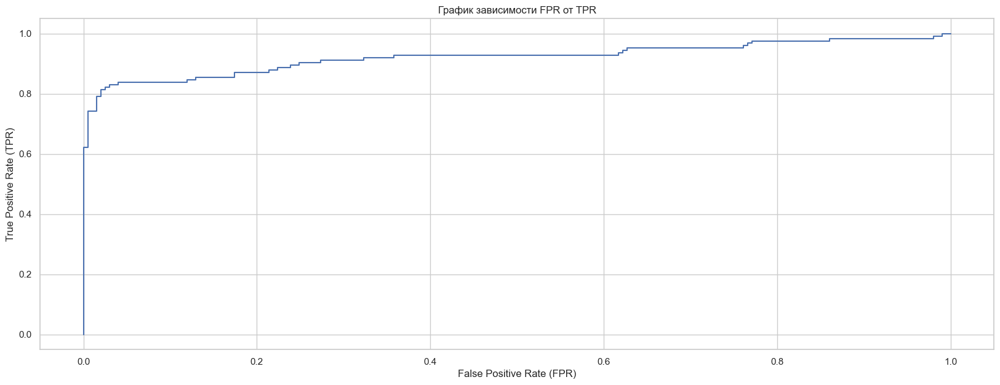

In [73]:
# График ROC
fpr, tpr, threshold = roc_curve(y_test, y_proba)
plt.plot(fpr, tpr)
plt.title("График зависимости FPR от TPR")
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.show()

   - Кривая ROC иллюстрирует диагностическую способность двоичного классификатора при изменении его порога распознавания.
   - Кривая отображает частоту истинных положительных результатов (TPR) в сравнении с частотой ложных положительных результатов (FPR) при различных пороговых настройках.
   - Большая площадь под кривой (AUC) означает лучшую производительность.
   - На графике видные несколько изломов. последний излом на уровне порога 0.65, а предпоследний 0.35, следовательно, целесообразно выбрать порог в этом диапазоне.


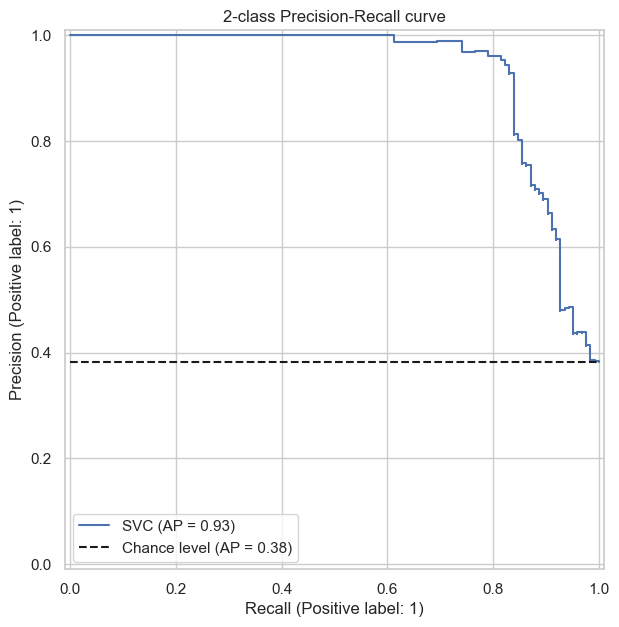

In [74]:
classifier = make_pipeline(
    RobustScaler(), SVC(kernel='rbf', C=1, probability=True, random_state=RANDOM_STATE) 
)
classifier.fit(X_train_best, y_train)

display_ = PrecisionRecallDisplay.from_estimator(
    classifier, X_test_best, y_test, name="SVC", plot_chance_level=True
)
_ = display_.ax_.set_title("2-class Precision-Recall curve")

Легенда на графике содержит следующую информацию:

- **SVC (AP = 0.93)**: Это означает, что кривая была построена для модели SVC и средняя точность (Average Precision, AP) для этой модели составляет 0.93. Средняя точность — это сумма произведений прироста полноты (recall) на точность (precision) в каждой точке кривой, что может быть интерпретировано как площадь под кривой Precision-Recall. Значение 0.93 говорит о том, что модель в целом имеет высокую точность во всем диапазоне порогов.

- **Chance level (AP = 0.38)**: Пунктирная линия указывает на уровень случайного угадывания, то есть что было бы, если бы модель предсказывала классы случайным образом. AP, равный 0.38 для случайного уровня, вероятно, соответствует пропорции положительных примеров в данных — это значение, которого можно было бы ожидать от модели, не имеющей никакой дискриминационной способности между классами.

Таким образом, если сравнить AP модели SVC с уровнем случайного угадывания, можно увидеть, что модель значительно превосходит случайное предсказание, что указывает на её эффективность в классификации положительного класса.

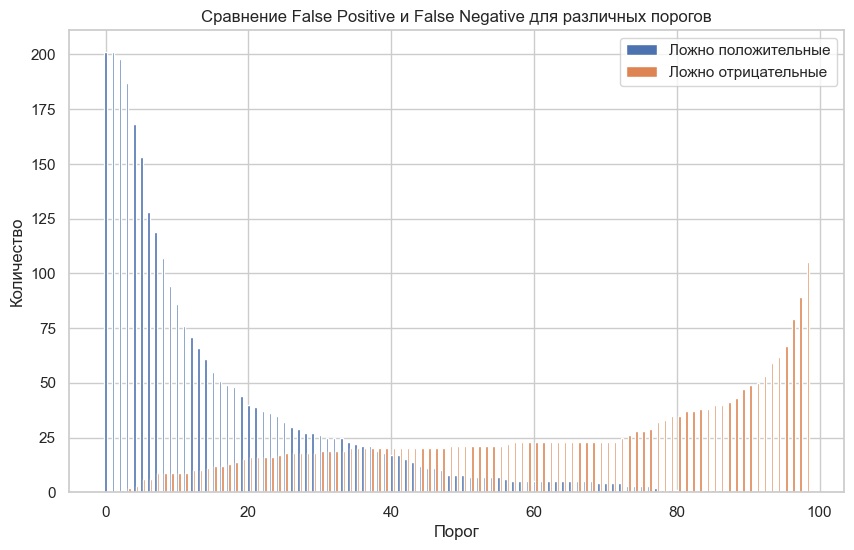

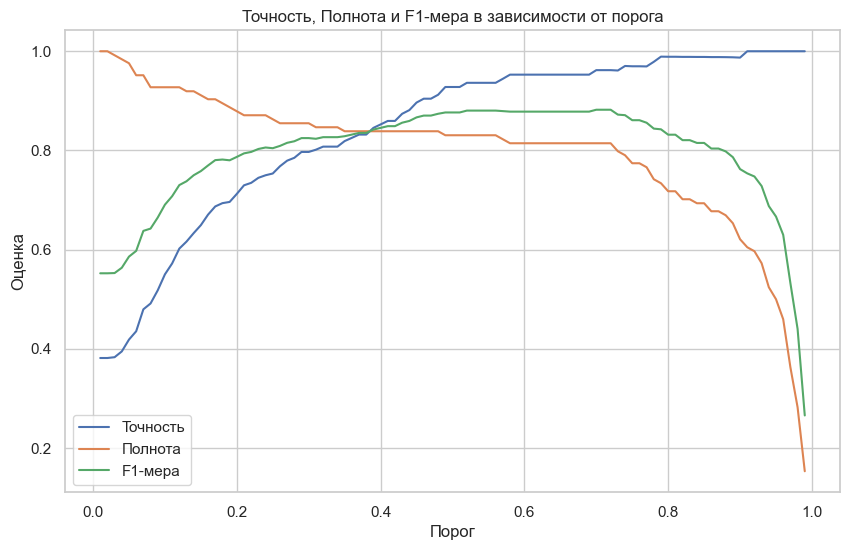

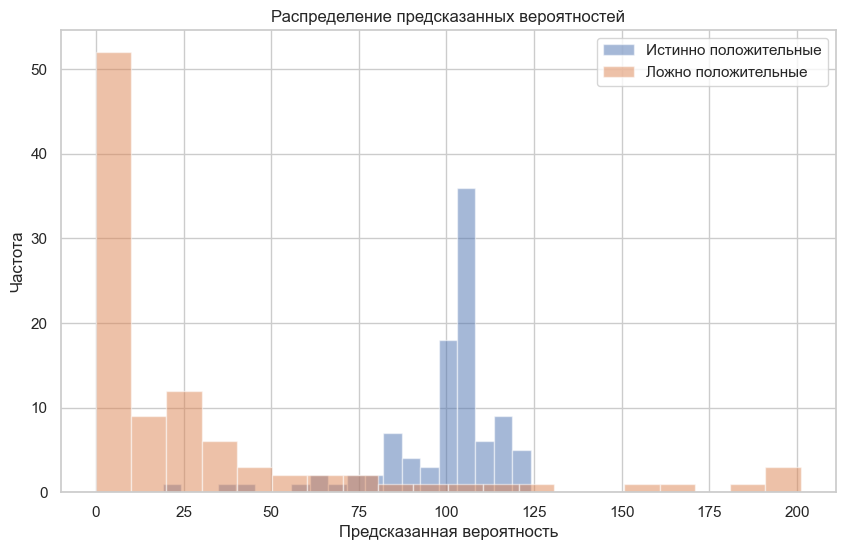

In [75]:
thresholds_ = df_thresholds['Threshold']
false_positive_ = df_thresholds['False_Positive']
false_negative_ = df_thresholds['False_Negative']
true_positive_ = df_thresholds['True_Positive']
true_negative_ = df_thresholds['True_Negative']


precision_ = true_positive_ / (true_positive_ + false_positive_)
recall_ = true_positive_ / (true_positive_ + false_negative_)
f1_score_ = 2 * (precision_ * recall_) / (precision_ + recall_)

# Столбчатая диаграмма сравнения False Positive и False Negative для различных порогов
plt.figure(figsize=(10, 6))
bar_width = 0.35
index = np.arange(len(thresholds_))
plt.bar(index, false_positive_, bar_width, label='Ложно положительные')
plt.bar(index + bar_width, false_negative_, bar_width, label='Ложно отрицательные')
plt.xlabel('Порог')
plt.ylabel('Количество')
plt.title('Сравнение False Positive и False Negative для различных порогов')
plt.legend()
plt.grid(True)
plt.show()

# График Precision, Recall и F1-меры в зависимости от порога
plt.figure(figsize=(10, 6))
plt.plot(thresholds_, precision_, label='Точность')
plt.plot(thresholds_, recall_, label='Полнота')
plt.plot(thresholds_, f1_score_, label='F1-мера')
plt.xlabel('Порог')
plt.ylabel('Оценка')
plt.title('Точность, Полнота и F1-мера в зависимости от порога')
plt.legend()
plt.grid(True)
plt.show()

# График плотности распределения предсказанных вероятностей для каждого класса
plt.figure(figsize=(10, 6))
plt.hist(true_positive_, bins=20, alpha=0.5, label='Истинно положительные')
plt.hist(false_positive_, bins=20, alpha=0.5, label='Ложно положительные')
plt.xlabel('Предсказанная вероятность')
plt.ylabel('Частота')
plt.title('Распределение предсказанных вероятностей')
plt.legend()
plt.grid(True)
plt.show()


1. **Гистограмма ложноположительных и ложноотрицательных результатов:**
   - На этом графике показано, как изменяются ложноположительные и ложноотрицательные результаты в зависимости от порогового значения.
   - Порог выбирается от условия бизнес-задачи, которая минимизирует ложноположительные или ложноотрицательные результаты, либо находит оптимальное значение.
   - На графике показано, что по мере увеличения порога ложноположительные результаты уменьшаются, а ложноотрицательные увеличиваются. Это ожидаемо, поскольку более высокий порог означает более консервативный подход к прогнозированию положительных результатов.

2. **Точность, отзыв и оценка F1 в сравнении с Пороговым значением:**
   - На этом графике отображаются точность, отзыв и оценка F1 в зависимости от порогового значения.
   - Оценка F1 представляет собой среднее гармоническое значение точности и отзыва и является полезным единым показателем для оценки, когда необходимо сбалансировать точность и отзыв.
   - F1 достигает пика примерно при 0.83 пороге.

3. **Распределение предсказанных вероятностей:**
   - Эта гистограмма показывает распределение прогнозируемых вероятностей истинно положительных и ложноположительных результатов.
   - Разделение между распределениями показывает, насколько хорошо модель может различать положительные и отрицательные классы.
   - Из предоставленной гистограммы видно, что истинно положительные результаты сгруппированы в сторону более высоких прогнозируемых вероятностей, что есть хорошо. Однако наблюдается значительное совпадение с ложноположительными результатами, что указывает на возможности для улучшения.

Наша модель, похоже, хорошо работает при определенных пороговых значениях, и существует четкий компромисс между точностью и отзывом. Также очевидно, что способность модели различать классы разумна, но не идеальна, на что указывает перекрытие гистограммы прогнозируемых вероятностей. При выборе порогового значения для окончательной модели нам следует учитывать конкретные затраты, связанные с ложноположительными и ложноотрицательными результатами в контексте решаемой проблемы. Поэтому выберем оптимальное решение при минимальном количестве суммарных ошибок первого и второго рода. Тем самым оставим значение порога по умолчанию.

**ВЫВОД:**

Наша модель, похоже, хорошо работает при определенных пороговых значениях, и существует четкий компромисс между точностью и отзывом. Также очевидно, что способность модели различать классы разумна, но не идеальна, на что указывает перекрытие гистограммы прогнозируемых вероятностей. При выборе порогового значения для окончательной модели нам следует учитывать конкретные затраты, связанные с ложноположительными и ложноотрицательными результатами в контексте решаемой проблемы. Поэтому выберем оптимальное решение при минимальном количестве суммарных ошибок первого и второго рода. Тем самым оставим значение порога по умолчанию.

### Отрисовка гиперплоскости лучшей модели

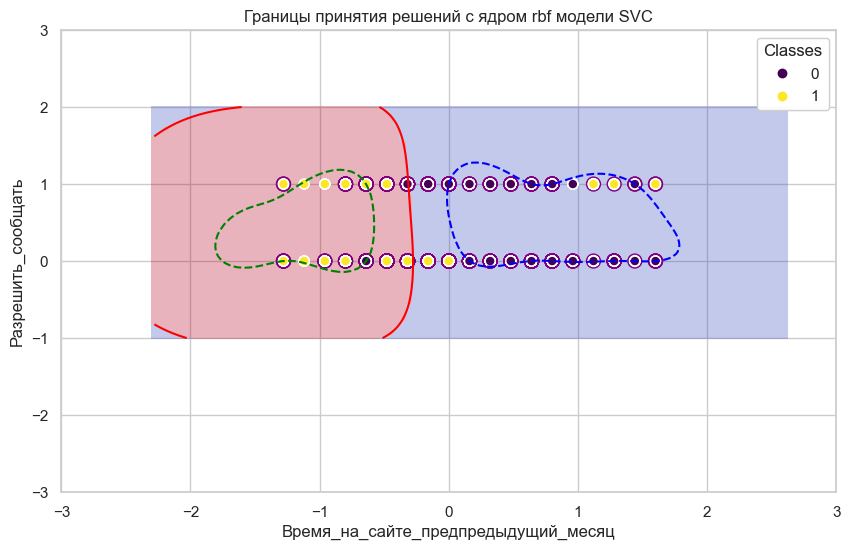

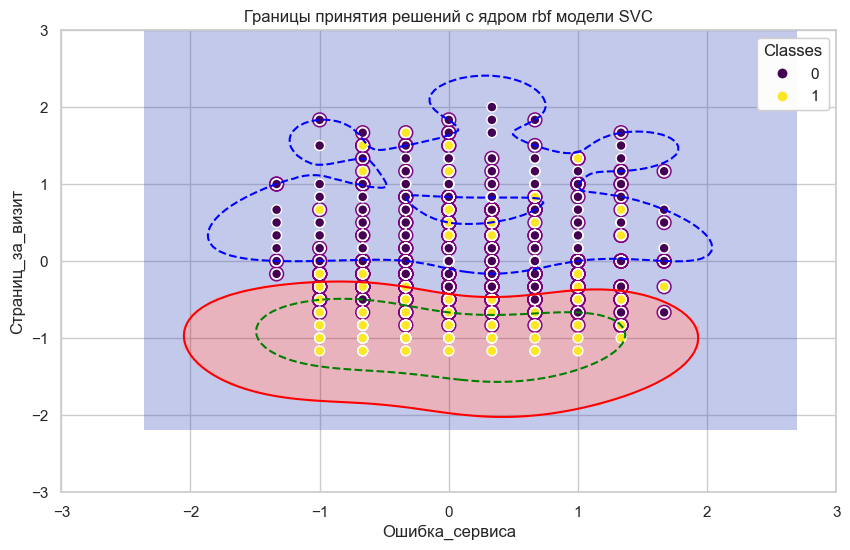

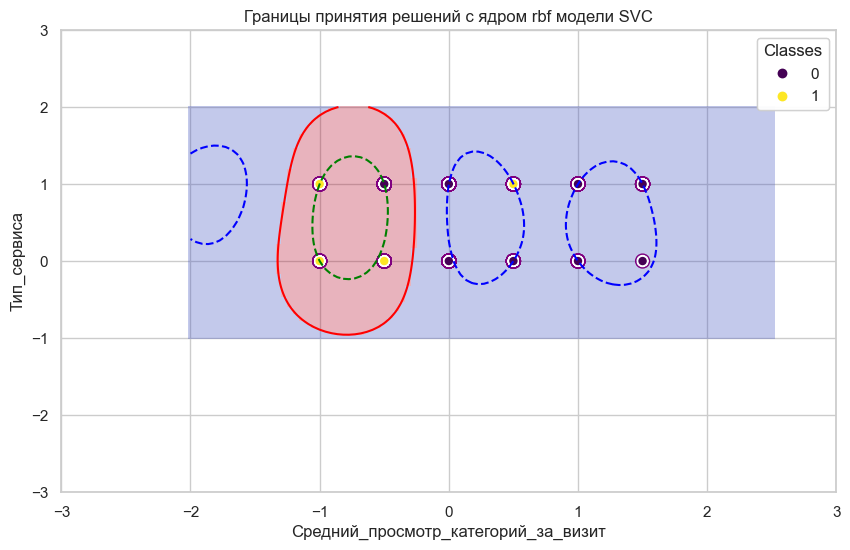

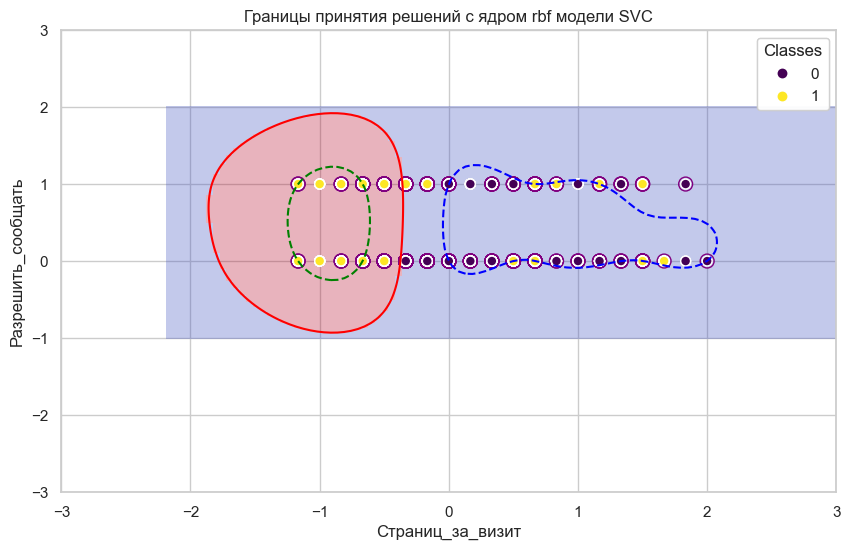

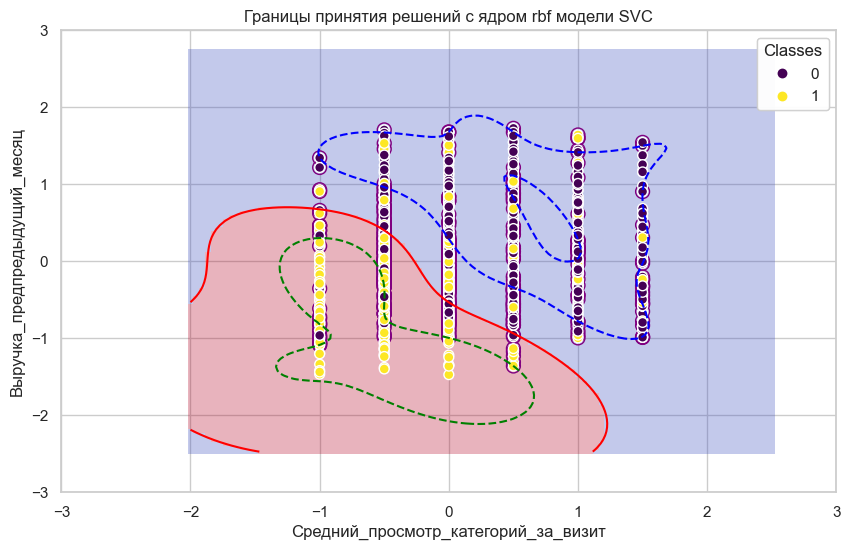

In [76]:
# Задаем количество случайных пар для отрисовки
num_random_pairs = 5

X_train_columns = X_train_best[num_columns + ord_columns]

# Получаем список всех пар столбцов
column_pairs = [(i, j) for i in range(len(X_train_columns.columns) - 1) for j in range(i + 1, len(X_train_columns.columns))]

# Выбираем случайные пары
random_pairs = random.sample(column_pairs, num_random_pairs)

# Отрисовываем гиперплоскости для выбранных пар
for (i, j) in random_pairs:
    X_0 = X_train_columns.columns[i]
    X_1 = X_train_columns.columns[j]    
    plot_training_data_with_decision_boundary("rbf", X_train_columns[[X_0, X_1]].values, y_train.values)

Для отображения всех гиперплоскостей необходимо раскомментировать нижеприведенный код

In [77]:
"""
X_train_columns = X_train_best[num_columns + ord_columns]
for i in range(len(X_train_columns.columns) - 1):
    for j in range(i + 1, len(X_train_columns.columns)):
        X_0 = X_train_columns.columns[i]
        X_1 = X_train_columns.columns[j]    
        plot_training_data_with_decision_boundary("rbf", X_train_columns[[X_0, X_1]].values, y_train.values)
        """;

На графиках изображена визуализация границ принятия решений для классификатора опорных векторов (SVC) с радиально-базисной функцией (RBF) ядра. Вот описание:

1. **Точки Данных**: Существует два класса точек данных, различающихся по цвету:
   - Класс 0: Обозначен темно-фиолетовыми точками.
   - Класс 1: Обозначен желтыми точками.

2. **Границы и область решений**: 
   - Область решений показаны красным и синим цветом, указывающие области, где модель предсказывает каждый класс.
   - Красная сетчатая область указывает на область решения для одного класса, в то время как синяя сетчатая область указывает на область решения для другого класса.
   - Имеются три контурные линии: пунктирная зеленая, сплошная синяя и пунктирная синяя линии. Эти линии представляют границы и границу решения SVC.

5. **Опорные Векторы**: Опорные векторы обозначены большими кругами с белой окантовкой вокруг меньших точек данных, подчеркивающими критические элементы, которые SVC использует для создания границы решения.


Визуализация эффективно отображает нелинейные границы решений, созданные классификатором SVC с ядром RBF, который может обрабатывать сложные шаблоны в данных, не поддающиеся линейному разделению. Использование цветов и контуров четко различает регионы, где модель предсказывает каждый класс, а также опорные векторы, определяющие границу.

В целом разделяющие границы для большинства параметров выглядит достоточно оптимально, хотя встречаются случае где невозможно было определить границу или было переобучение.

### Отбор признаков

Для отображения признаков, которые вносят наибольший вклад в модель, вы можете воспользоваться методом `coef_` (коэффициенты) или `feature_importances_` (важность признаков), в зависимости от используемого алгоритма.

Однако, для `SVM` с ядром `RBF` (радиально-базисная функция), это не так просто. Это потому, что `SVM` с `RBF-ядром` внутренне использует метод опорных векторов, который работает в пространстве более высокой размерности и проецирует данные на это пространство. В этом пространстве может быть сложно интерпретировать вклады каждого конкретного признака.

Однако, есть методы для аппроксимации влияния признаков на модель `SVM`, например, методы анализа важности признаков с использованием перестановок (`Permutation Importance`). Этот метод переставляет значения одного признака и измеряет, как это влияет на качество модели.

Рассчитаем важность признаков с использованием метода перестановок и отобразим это в виде графика

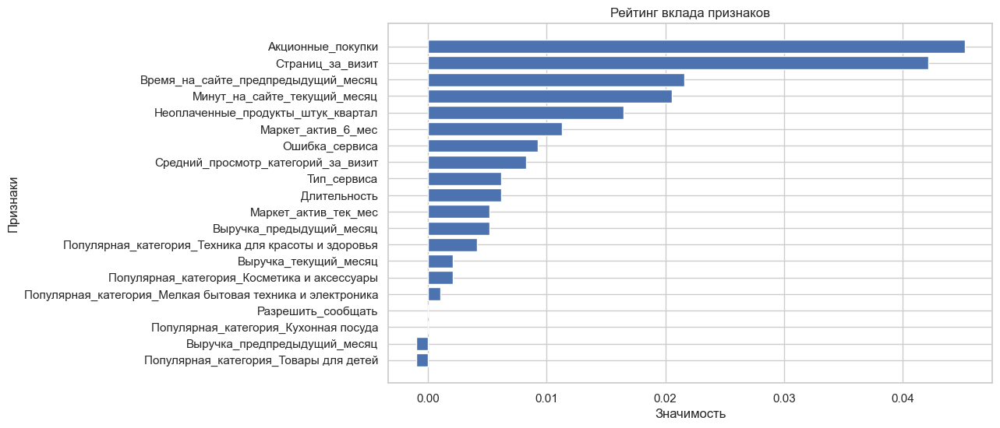

In [78]:
# Оценка важности признаков с использованием перестановок
importances = calculate_permutation_importance(clf_best, X_train_best, y_train, accuracy_score)
# Индексы признаков
feature_indices = range(len(importances))

# Сортировка признаков по важности
sorted_indices = np.argsort(importances)

# Сортированные важности признаков
sorted_importances = importances[sorted_indices]

# Названия признаков
feature_names = X_train_best.columns[sorted_indices]

# Создание графика
plt.figure(figsize=(10, 6))
plt.barh(feature_names, sorted_importances)
plt.xlabel('Значимость')
plt.ylabel('Признаки')
plt.title('Рейтинг вклада признаков')
plt.show()

**ВЫВОД:**

Исходя из графика, выделим ТОП-5 признаков с наибольшим вкладом в модель:
- *Страниц_за_визит*
- *Акционные_покупки*
- *Неоплаченные_продукты_штук_квартал*
- *Время_на_сайте_предпредыдущий_месяц*
- *Минут_на_сайте_текущий_месяц*

Также выделим ТОП-5 признаков с наименьшим вкладом в модель:
- *Длительность*
- *Разрешить_сообщать*
- *Популярная_категория_Мелкая бытовая техника и электроника*
- *Популярная_категория_Кухонная посуда*
- *маркет_актив_тек_мес*

### Отбор признаков на основе статистических тестов с помощью `SelectKBest()`

In [79]:
k_selected = []
roc_auc_selected = []
roc_auc_score_selected = []
acc_selected = []
f1_selected = []
selected_feature_names = []

clf_best_selected = SVC(kernel='rbf', C=1, probability=True, random_state=RANDOM_STATE)  
for i in range(1, 20):
    # Создаем экземпляр селектора с нужными параметрами
    selector = SelectKBest(f_classif, k=i)

    # Применяем SelectKBest к набору данных для обучения
    X_train_selected = selector.fit_transform(X_train_best, y_train)

    # Применяем ту же трансформацию к набору данных для тестирования
    X_test_selected = selector.transform(X_test_best)

    # Теперь можно обучить модель SVC на отфильтрованных признаках
    clf_best_selected.fit(X_train_selected, y_train)

    # Предсказываем метки классов и вероятности для отфильтрованных тестовых данных
    y_pred_selected = clf_best_selected.predict(X_test_selected)

    k_selected.append(i)
    
    # Вычисляем среднее значение ROC-AUC на кросс-валидации
    roc_auc_selected.append(round(cross_val_score(clf_best_selected, X_train_selected, y_train, scoring='roc_auc').mean(), 3))  
    roc_auc_score_selected.append(round(roc_auc_score(y_test, y_pred_selected), 3))
    
    # Вычисляем точность
    acc_selected.append(round(accuracy_score(y_test, y_pred_selected), 3))  

    # Вычисляем F1-меру
    f1_selected.append(round(f1_score(y_test, y_pred_selected, pos_label=1), 3))  

    # Получаем индексы выбранных признаков
    selected_indices = selector.get_support(indices=True)

    # Получаем названия выбранных признаков из исходного датасета
    selected_names = X_train_best.columns[selected_indices]

    selected_feature_names.append(list(selected_names))
        
    
# Создаем DataFrame с метриками
metric_selected = pd.DataFrame({'k_selected': k_selected,
                                'ROC-AUC train': roc_auc_selected,
                                'ROC-AUC test': roc_auc_score_selected,
                                'Accuracy': acc_selected,
                                'F1-score': f1_selected,
                                'Перечень признаков': selected_feature_names})

print('Метрики лучшей модели:')
# Вычисляем среднее значение ROC-AUC на кросс-валидации
print(f'ROC-AUC на тренировочной выборке: {round(roc_auc, 3)}') 
print(f'ROC-AUC на тестовой выборке: {round(roc_auc_score(y_test, y_pred), 3)}') 
# Вычисляем точность
print('Accuracy:', round(acc, 3)) 
# Вычисляем F1-меру 
print('F1-score:', round(f1, 3))

print('Метрики отобранных признаков:')
metric_selected

Метрики лучшей модели:
ROC-AUC на тренировочной выборке: 0.916
ROC-AUC на тестовой выборке: 0.895
Accuracy: 0.914
F1-score: 0.266
Метрики отобранных признаков:


,k_selected,ROC-AUC train,ROC-AUC test,Accuracy,F1-score,Перечень признаков
0,1,0.821,0.815,0.818,0.770,[Страниц_за_визит]
1,2,0.856,0.845,0.868,0.812,"[Страниц_за_визит, Время_на_сайте_предпредыдущ..."
2,3,0.865,0.890,0.908,0.871,"[Страниц_за_визит, Время_на_сайте_предпредыдущ..."
3,4,0.885,0.880,0.902,0.860,"[Акционные_покупки, Страниц_за_визит, Время_на..."
4,5,0.898,0.875,0.895,0.852,"[Акционные_покупки, Средний_просмотр_категорий..."
5,6,0.894,0.878,0.898,0.856,"[Маркет_актив_6_мес, Акционные_покупки, Средни..."
6,7,0.905,0.883,0.902,0.862,"[Маркет_актив_6_мес, Акционные_покупки, Средни..."
7,8,0.915,0.889,0.905,0.868,"[Маркет_актив_6_мес, Акционные_покупки, Средни..."
8,9,0.916,0.894,0.911,0.876,[Популярная_категория_Мелкая бытовая техника и...
9,10,0.915,0.894,0.911,0.876,[Популярная_категория_Мелкая бытовая техника и...


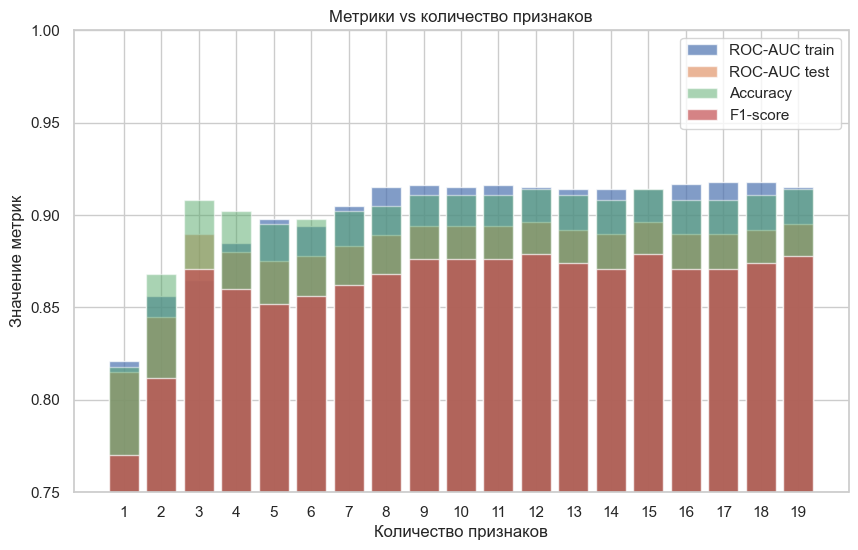

In [80]:
# Создаем гистограмму
plt.figure(figsize=(10, 6))

# Гистограмма ROC-AUC на тренировочной выборке
plt.bar(metric_selected['k_selected'], metric_selected['ROC-AUC train'], label='ROC-AUC train', alpha=0.7)

# Гистограмма ROC-AUC на тестовой выборке
plt.bar(metric_selected['k_selected'], metric_selected['ROC-AUC test'], label='ROC-AUC test', alpha=0.6)

# Гистограмма точности
plt.bar(metric_selected['k_selected'], metric_selected['Accuracy'], label='Accuracy', alpha=0.5)

# Гистограмма F1-меры
plt.bar(metric_selected['k_selected'], metric_selected['F1-score'], label='F1-score', alpha=0.7)

# Добавляем заголовок
plt.title('Метрики vs количество признаков')

# Добавляем метки осей
plt.xlabel('Количество признаков')
plt.ylabel('Значение метрик')

# Устанавливаем лимиты для оси x
plt.xticks(range(1, 20))

# Устанавливаем лимиты для оси y
plt.ylim(0.75, 1)

# Добавляем легенду
plt.legend()

# Показываем гистограмму
plt.grid(True)
plt.show()

**ВЫВОД:**

Исходя из графика можно сделать предположение, что при достижении 9 наиболее важных признаков метрики выхадят на плато. Оптимальное количество с точки зрения метрик равно 12.

Вот эти признаки:
- Популярная_категория_Косметика и аксессуары, 
- Популярная_категория_Кухонная посуда, 
- Популярная_категория_Мелкая бытовая техника и электроника, 
- Маркет_актив_6_мес, 
- Акционные_покупки, 
- Средний_просмотр_категорий_за_визит, 
- Неоплаченные_продукты_штук_квартал, 
- Ошибка_сервиса, 
- Страниц_за_визит, 
- Выручка_предпредыдущий_месяц, 
- Время_на_сайте_предпредыдущий_месяц, 
- Минут_на_сайте_текущий_месяц

***Отобразим вклад наилучших признаков на основе статистических тестов***

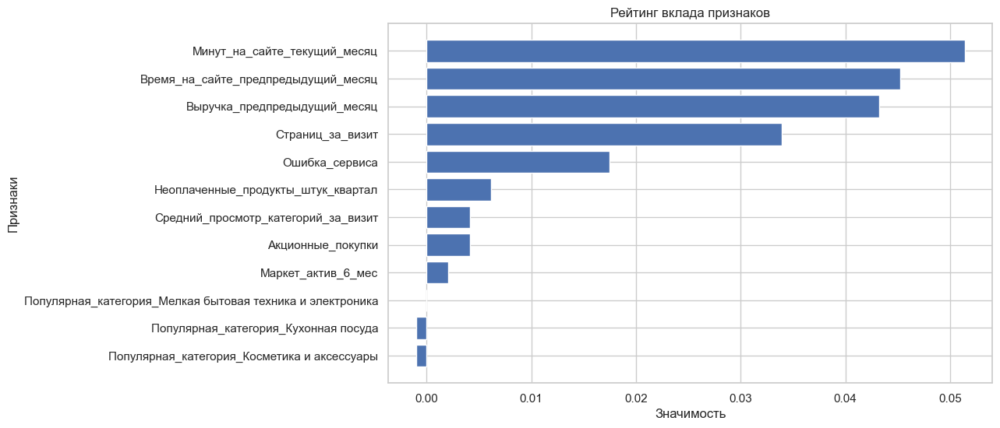

In [81]:
selector_12 = SelectKBest(f_classif, k=12)
selector_12.fit(X_train_best, y_train)

# Получаем названия выбранных признаков
features_names_selector_12 = X_train_best.columns[selector_12.get_support(indices=True)]

# создаём новый набор данных (12 наиболее важных признаков из выборки)
X_train_selector_12 = X_train_best.loc[:, features_names_selector_12]
X_test_selector_12 = X_test_best.loc[:, features_names_selector_12]

clf_best_selected_12 = SVC(kernel='rbf', C=1, probability=True, random_state=RANDOM_STATE)
clf_best_selected_12.fit(X_train_selector_12, y_train)

acc_selector_12 = accuracy_score(y_test, clf_best_selected_12.predict(X_test_selector_12))

# Оценка важности признаков с использованием перестановок
importances_selector_12 = calculate_permutation_importance(clf_best_selected_12, X_train_selector_12, y_train, accuracy_score)
# Индексы признаков
feature_indices_selector_12 = range(len(importances_selector_12))

# Сортировка признаков по важности
sorted_indices_selector_12 = np.argsort(importances_selector_12)

# Сортированные важности признаков
sorted_importances_selector_12 = importances_selector_12[sorted_indices_selector_12]

# Создание графика
plt.figure(figsize=(10, 6))
plt.barh(features_names_selector_12, sorted_importances_selector_12)
plt.xlabel('Значимость')
plt.ylabel('Признаки')
plt.title('Рейтинг вклада признаков')
plt.show()

**ВЫВОД:**

***Статистические тесты дали следующий результат (ТОП-5):***

- *Минут_на_сайте_текущий_месяц*
- *Время_на_сайте_предпредыдущий_месяц*
- *Выручка_предпредыдущий_месяц*
- *Страниц_за_визит*
- *Ошибка_сервиса*

3 признака, что в предыдущем варианте.

### График важности методом SHAP

Построим гафик важности для модели из пайплайна

  0%|          | 0/325 [00:00<?, ?it/s]

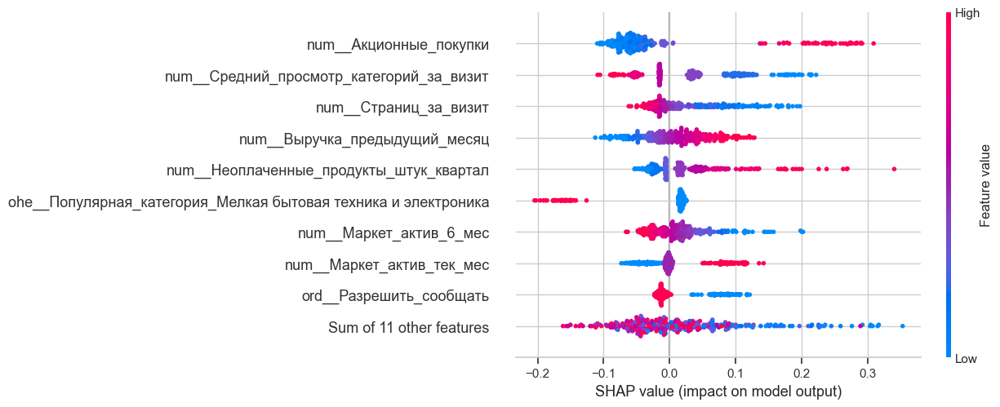

In [82]:
def model_predict(data):
    return grid_search.best_estimator_.named_steps['models'].decision_function(data)

X_train_pipe = pipe_final.named_steps['preprocessor'].fit_transform(X_train)

# Создаем фоновую выборку для объяснения
background_summary_pipe = shap.sample(X_train_pipe, nsamples=NSAMPLES, random_state=RANDOM_STATE)

explainer_pipe = shap.KernelExplainer(model_predict, background_summary_pipe)

X_test_pipe = pipe_final.named_steps['preprocessor'].transform(X_test)

feature_names = pipe_final.named_steps['preprocessor'].get_feature_names_out()

X_test_pipe = pd.DataFrame(X_test_pipe, columns=feature_names)

shap_values_pipe = explainer_pipe(X_test_pipe)

shap.plots.beeswarm(shap_values_pipe)

In [83]:
background_summary_best = shap.sample(X_train_best, nsamples=NSAMPLES, random_state=RANDOM_STATE)

# Инициализируем KernelExplainer с суммированным фоновым распределением
explainer_best_proba = shap.KernelExplainer(clf_best.predict_proba, background_summary_best)

# Вычисляем значения SHAP
shap_values_best_proba = explainer_best_proba.shap_values(X_test_best) 

# Визуализируем значения SHAP
shap.force_plot(explainer_best_proba.expected_value[0], shap_values_best_proba[..., 0])

  0%|          | 0/325 [00:00<?, ?it/s]

In [84]:
shap_values_best_proba_ = explainer_best_proba.shap_values(X_test_best.iloc[0, :]) 
shap.force_plot(explainer_best_proba.expected_value[0], shap_values_best_proba_[..., 0], X_test_best.iloc[0, :])

На изображении, показана диаграмма SHAP (SHapley Additive exPlanations), которая является инструментом для интерпретации моделей машинного обучения. Она демонстрирует, как каждый атрибут влияет на предсказание модели, отталкиваясь от базового значения (средний результат модели по набору данных) к фактическому выходу модели.

Интерпритация данной диаграммы:

- Признаки, которые **повышают предсказание** (увеличивают вероятность принадлежности к положительному классу), показаны **розовым цветом**, рядом указаны их значения SHAP и значения признаков. Например, "Минут_на_сайте_текущий_месяц = 1.167" означает, что этот признак, имея высокое значение, способствует повышению предсказания модели выше базового значения.
- Признаки, которые **понижают предсказание** (уменьшают вероятность принадлежности к положительному классу), показаны **синим цветом**. Например, "Ошибка_сервиса = -1.333" подразумевает, что этот признак способствует понижению предсказания модели по сравнению с базовым значением.
- Длина цветных полос отражает величину воздействия признака на предсказание. Более длинные полосы указывают на большее влияние.
- **Финальное предсказание** (f(x)) это сумма базового значения и всех значений SHAP  оно составляет примерно 0.46.

Предсказание модели, кажется, сильнее всего подвержено влиянию признаков, которые уменьшают вероятность положительного класса, так как видна значительная синяя секция, толкающая предсказание влево. Отрицательное воздействие "Акционные_покупки" является наибольшим, что сильно указывает на то, что ошибки в сервисе приводят к снижению вероятности результата, который предсказывает модель.

В то же время признак "Минут_на_сайте_текущий_месяц" со значением 1.167 способствует увеличению предсказательной величины, но его воздействие недостаточно, чтобы противостоять сильному отрицательному эффекту ошибки сервиса.

Построим гафик важности для модели clf_best

  0%|          | 0/325 [00:00<?, ?it/s]

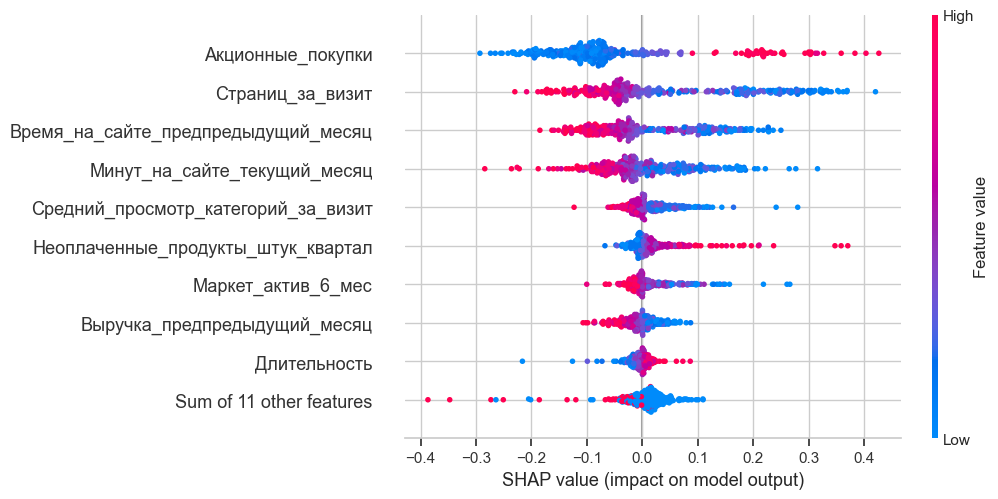

In [85]:
# Инициализируем KernelExplainer с суммарным фоном
explainer_best_predict = shap.KernelExplainer(clf_best.predict, background_summary_best)

# Вычисляем SHAP значения
shap_values_best_predict = explainer_best_predict(X_test_best)

# Визуализируем SHAP значений с помощью графика beeswarm
shap.plots.beeswarm(shap_values_best_predict)

Эта визуализация предназначена для отображения вклада каждого признака в предсказание модели по всему набору тестовых данных.

***Как читать этот график:***

- Негативные значения Шепли слева от центральной вертикальной линии означают, что признак склоняет модель отнести объекты к классу 0, а положительные справа — к классу 1.
- Чем толще линия по вертикали, тем больше наблюдений сгруппированы вместе: у них близкие значения Шепли. Это значит, что модель уверенно присваивает SHAP-значения, с учётом закономерностей в данных.
- Цвет точки отражает значения каждого признака объекта: чем краснее объект, тем больше признак, указанный на оси *Y*.

***Выводы, которые можно сделать по диаграмме:***

*Исходя из анализа SHAP-значений, наиболее значимые признаки:*
1. Страницы_за_визит
2. Акционные_покупки
3. Время_на_сайте_предыдущий_месяц
4. Минут_на_сайте_текущий_месяц
5. Неоплаченные_продукты_штук_квартал
6. Средний_просмотр_категорий_за_визит
7. Выручка_предыдущий_месяц
8. Маркет_актив_6_мес
9. Длительность

***Что в точности совпадает с другими методами отбора значимых признаков***

- Наибольшее влияние на модель оказывают "Страницы_за_визит" и "Акционные_покупки". Это означает, что количество просмотренных страниц за визит и покупки по акциям значительно влияют на прогнозируемое поведение пользователя.
- Признак **"Страниц_за_визит"** имеет сильное положительное влияние на модель, что видно по большому количеству красных точек справа. Это означает, что большее количество просмотренных страниц во время визита обычно увеличивает предсказание модели в положительную сторону.
- Признак **"Акционные_покупки"** В целом они либо слабо, либо отрицательно влияют на таргет, но при этом необходимо учесть долю таких покупок, так как при высокой доли вероятность снижения активности резко повышается. Следоватьельно целесообразно сегментировать покупателей по высокой доли таких покупок.
- Для некоторых признаков, таких как **"Минут_на_сайте_текущий_месяц"**, SHAP значения разделены на положительные и отрицательные, указывая на различное воздействие этого признака на разные примеры в тестовом наборе данных.
- Наблюдается существенная вариабельность в воздействии некоторых признаков, например, **"Акционные_покупки"** и **"Время_на_сайте_предыдущий_месяц"**, что указывает на то, что они могут оказывать значительное положительное воздействие на предсказание модели для некоторых наблюдений, в то время как для других их воздействие отсутствует или оно отрицательное.
- **"Sum of 10 other features"**: Это суммарное воздействие остальных десяти признаков, не показанных индивидуально на графике, которое также вносит свой вклад в результат модели.

Общий вывод состоит в том, что вклад отдельных признаков в модель значительно различается, и для точной интерпретации результатов модели важно рассмотреть эти различия.

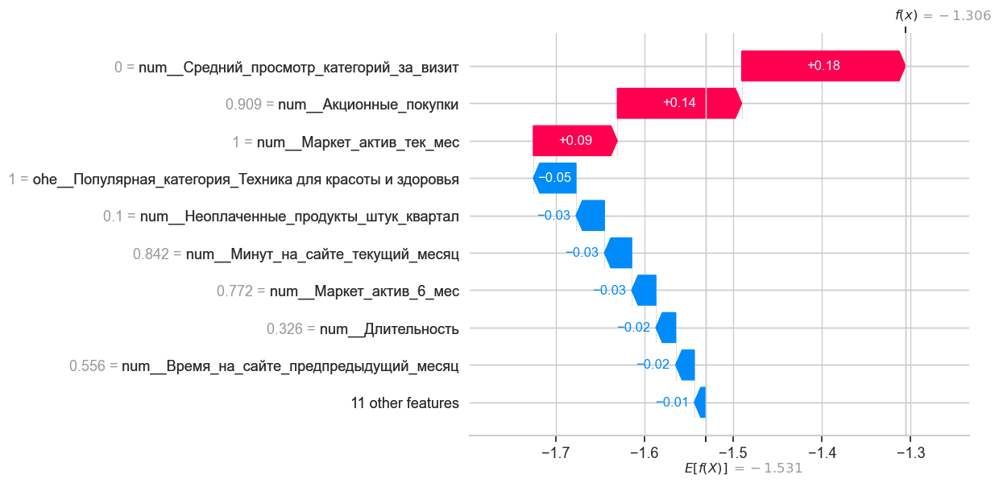

In [86]:
# Визуализируем SHAP значений с помощью графика beeswarm
shap.plots.waterfall(shap_values_pipe[0])

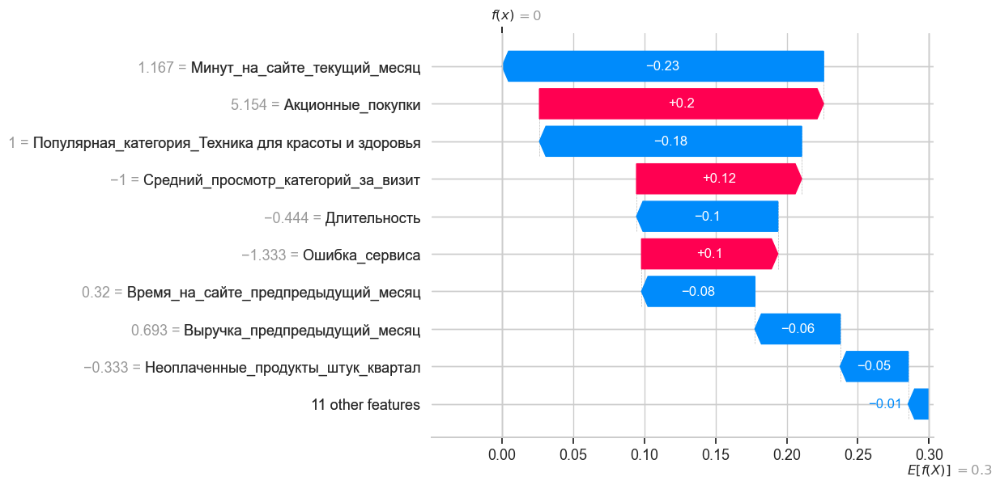

In [87]:
shap.plots.waterfall(shap_values_best_predict[0])

Сильнее всего на его классификацию влияет признак "Акционные_покупки": он «перетягивает» предсказание в сторону класса 0. Значение f(x) на графике показывает, к какому классу признак склоняет наблюдение: отрицательные значения говорят о том, что наблюдение скорее относится к классу 0, а положительные — к классу 1.

In [88]:
# формируем столбцы
X_test_best['y_test'] = y_test.tolist()
X_test_best['y_pred'] = y_pred.tolist()
X_test_best['predict_proba'] = y_proba

# выводим на экран неверно классифицированные классы 1
display(X_test_best[(X_test_best['y_test']==1)
               & (X_test_best['y_pred']==0)
               & (X_test_best['predict_proba']<=0.5)][['y_test', 
                                                  'y_pred',
                                                  'predict_proba', 
                                                  ]].sort_values(by='predict_proba'))
# выводим на экран неверно классифицированные классы 0 
display(X_test_best[(X_test_best['y_test']==0)
               & (X_test_best['y_pred']==1)
               & (X_test_best['predict_proba']>0.5)][['y_test', 
                                                 'y_pred', 
                                                 'predict_proba',
                                                 ]].sort_values(ascending=False, 
                                                                                   by='predict_proba'))

,y_test,y_pred,predict_proba
167,1,0,0.023910
154,1,0,0.031125
288,1,0,0.046416
201,1,0,0.058912
55,1,0,0.059571
281,1,0,0.059901
210,1,0,0.072008
83,1,0,0.073583
57,1,0,0.074105
118,1,0,0.125955


,y_test,y_pred,predict_proba
269,0,1,0.904742
319,0,1,0.782201
37,0,1,0.774971
7,0,1,0.739724
34,0,1,0.691986


**Теперь оценим вклад каждого признака в ошибочно классифицированные объекты**

Index: 12


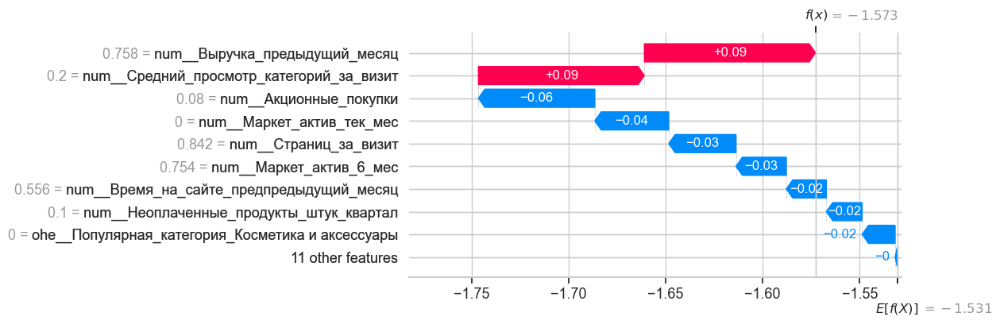

Index: 55


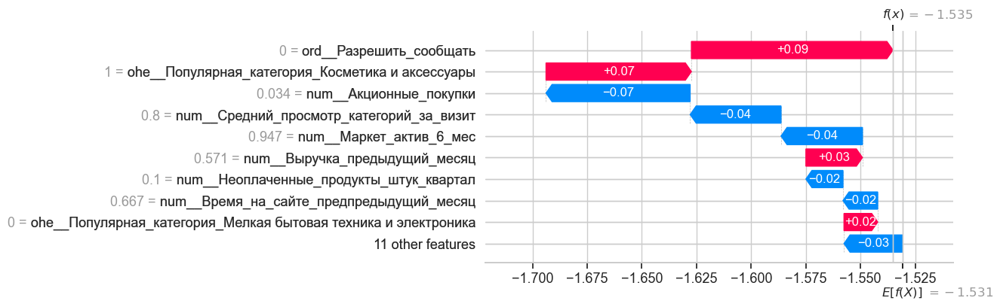

Index: 57


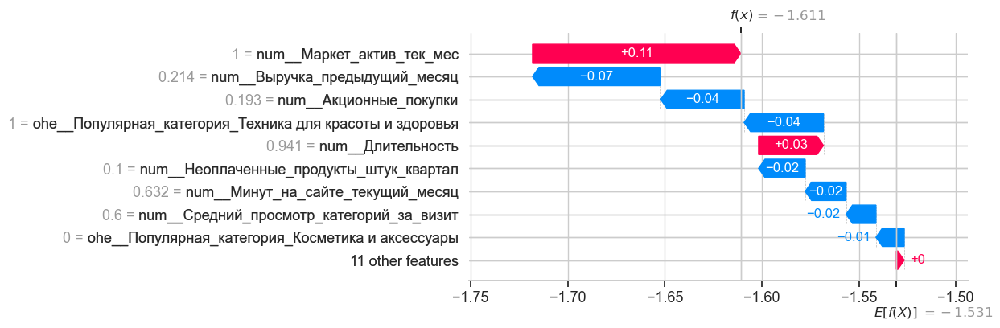

Index: 60


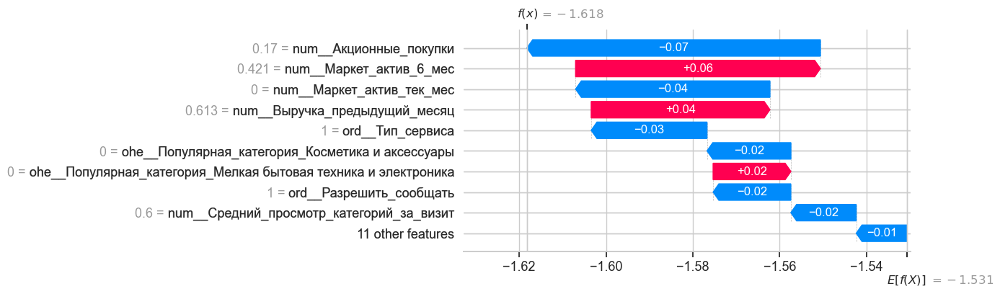

Index: 67


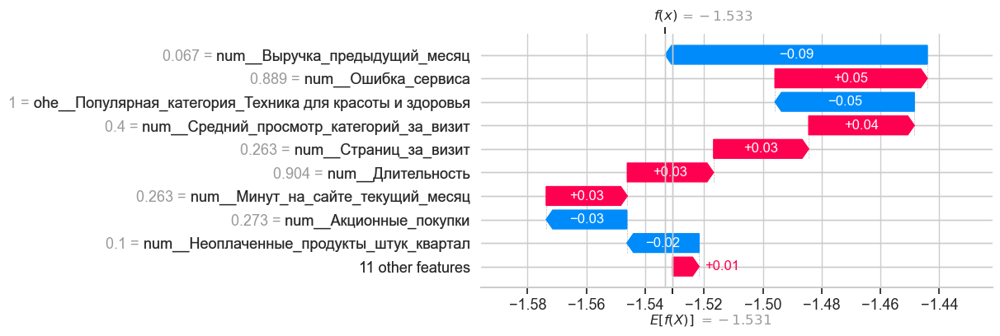

Index: 83


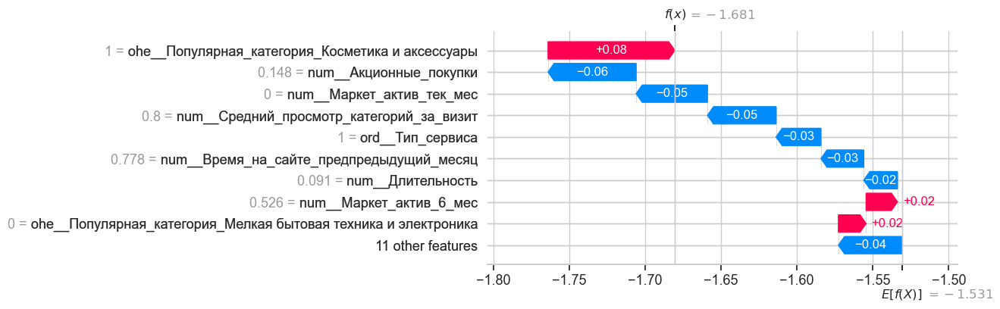

Index: 92


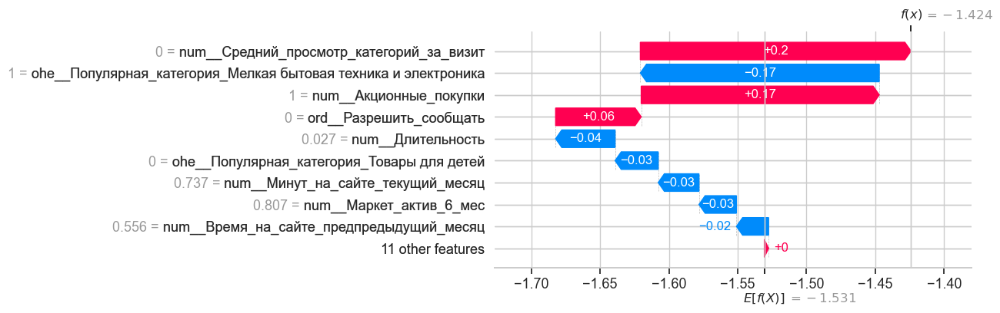

Index: 118


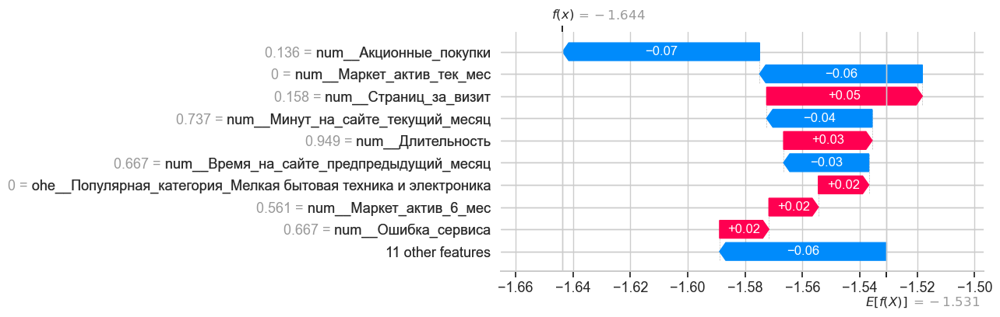

Index: 136


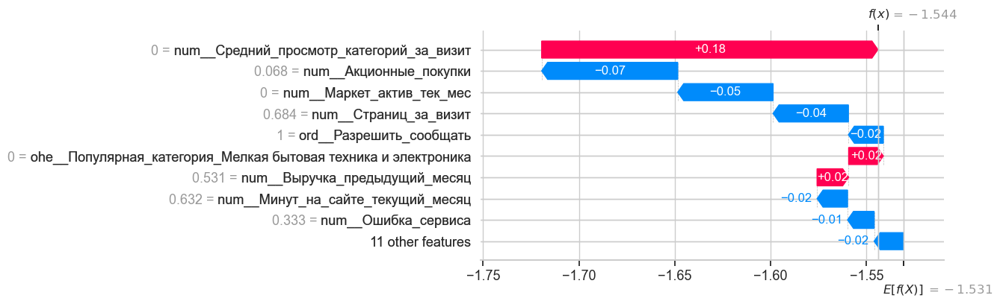

Index: 141


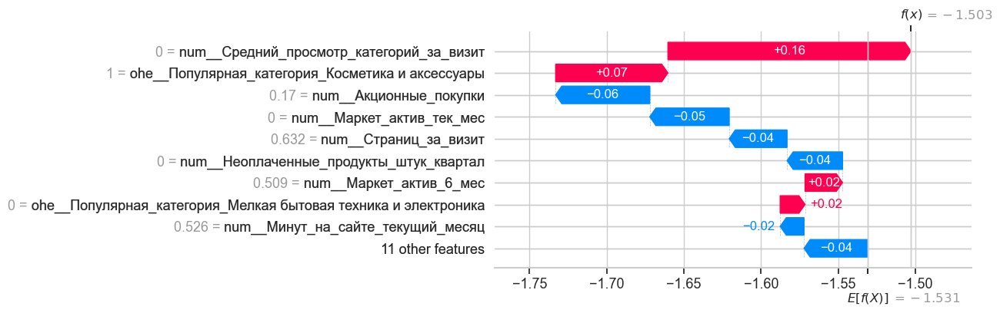

Index: 142


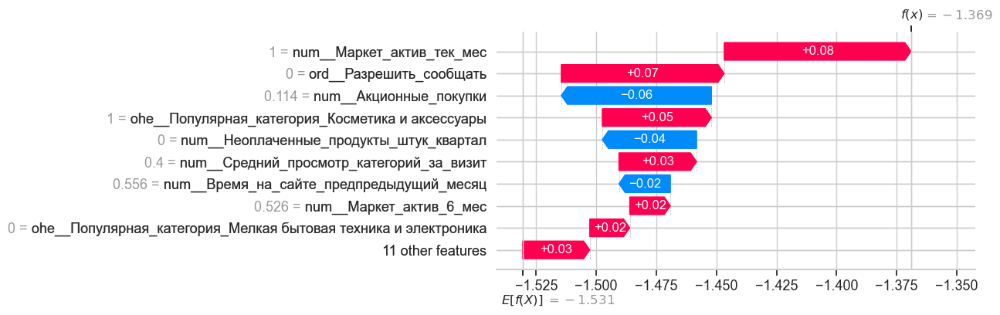

Index: 144


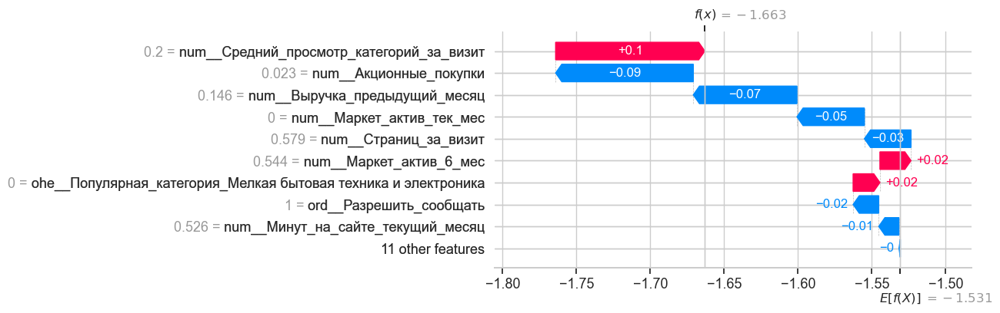

Index: 152


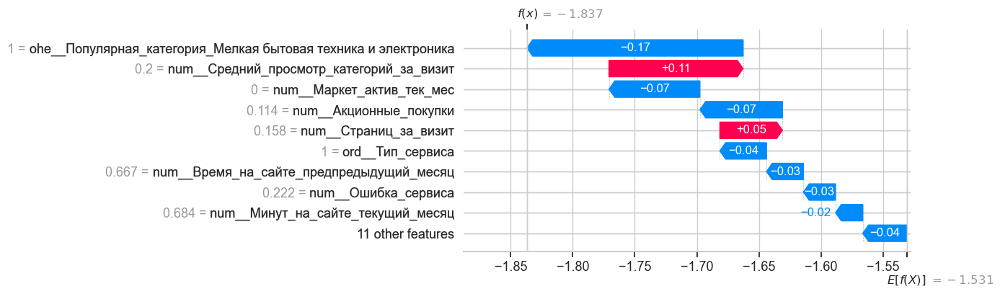

Index: 154


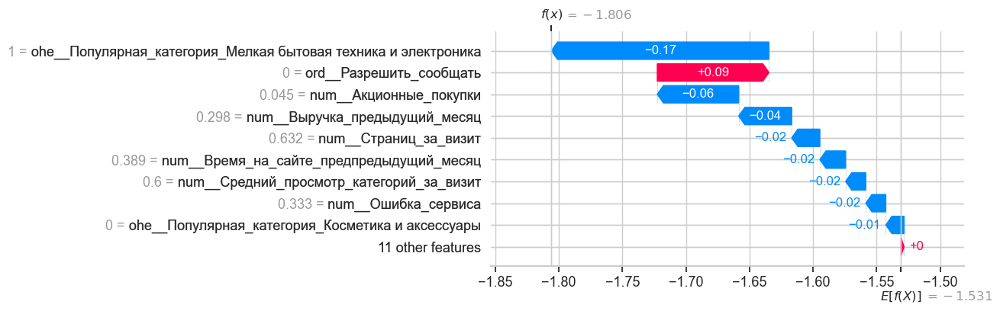

Index: 167


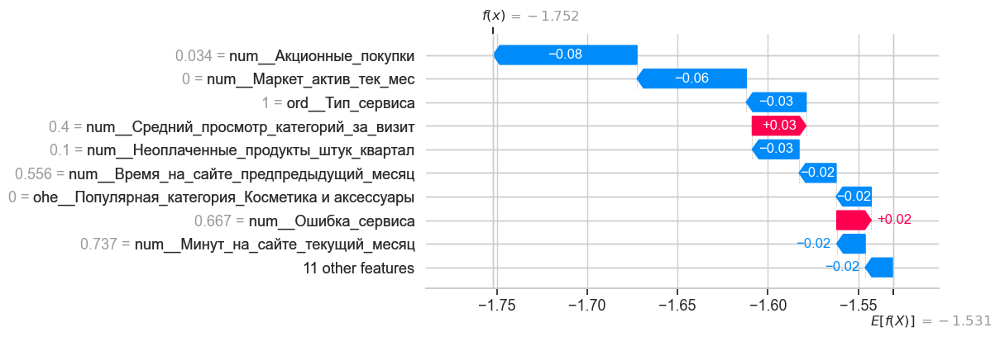

Index: 201


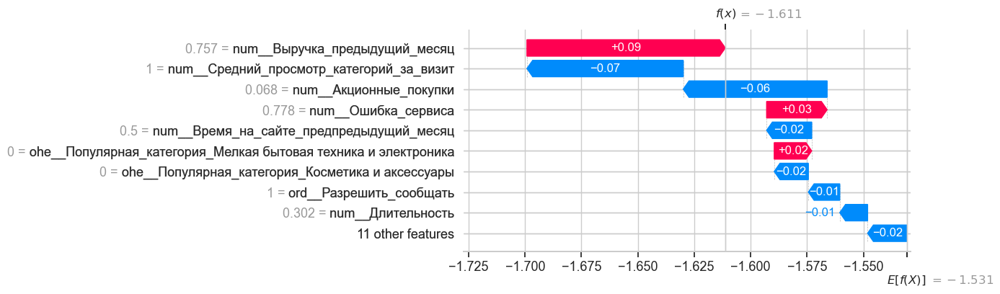

Index: 210


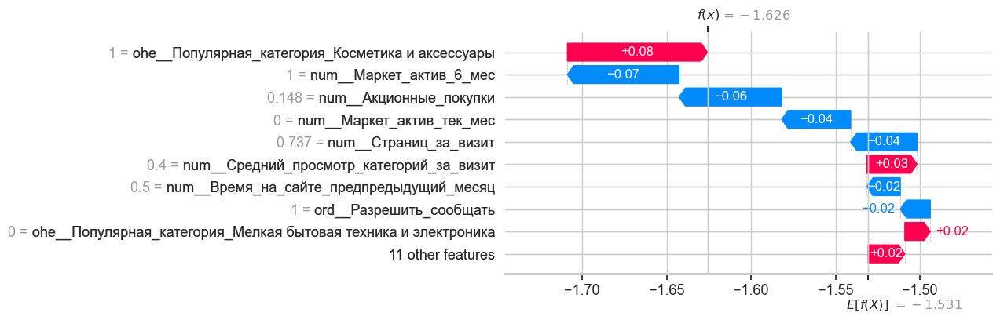

Index: 255


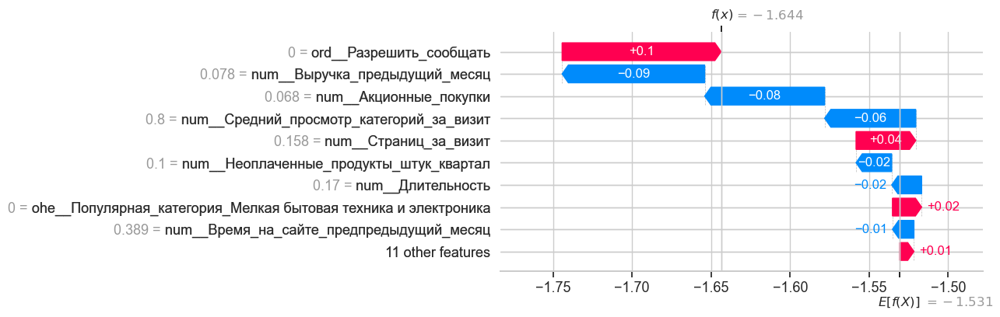

Index: 257


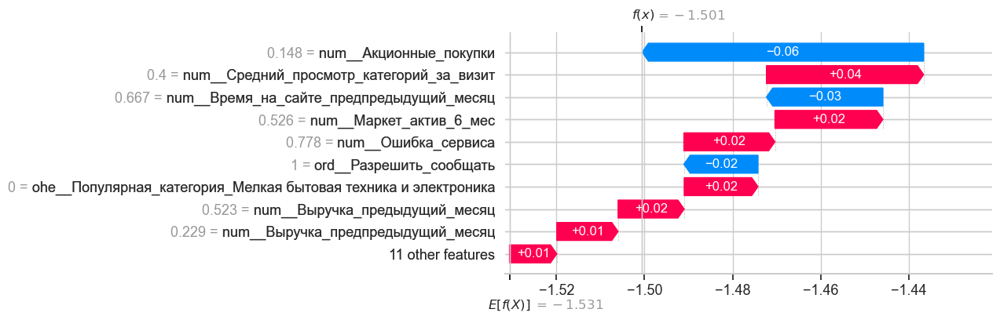

Index: 281


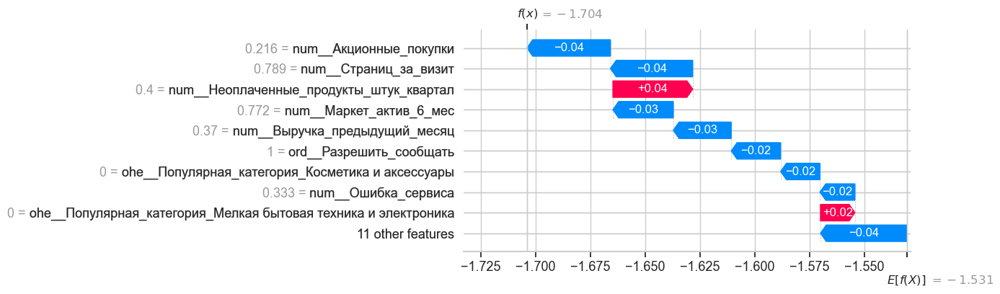

Index: 288


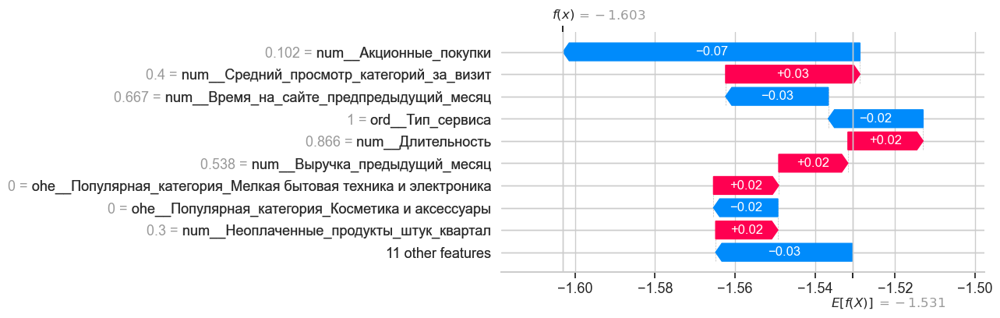

Index: 290


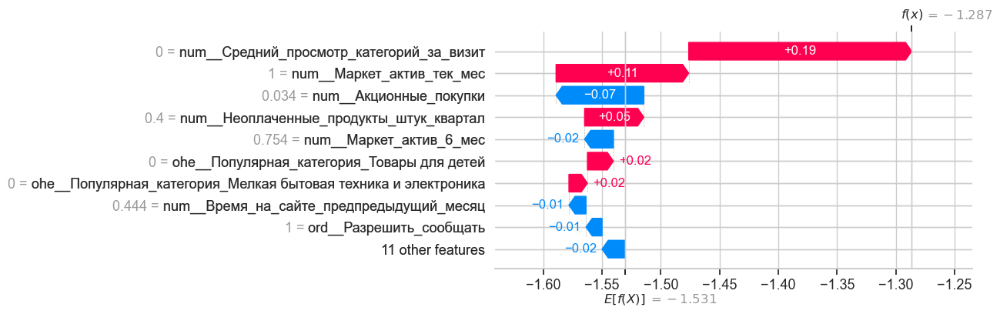

Index: 316


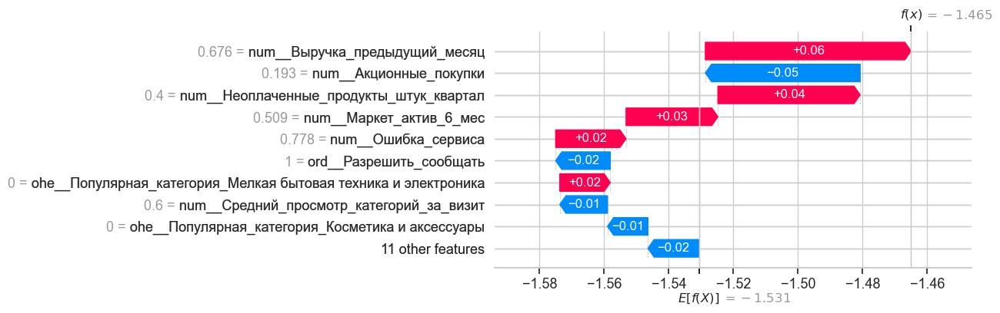

In [89]:
# В отдельную переменную сохраняем индексы ошибочно присвоенных классов 0
index_class_0 = X_test_best.index[(X_test_best['y_test']==1) & (X_test_best['y_pred']==0)].tolist()

# Через цикл визуализируем вклады признаков для каждого объекта
for i in index_class_0:
    print('Index:', i)
    fig = plt.figure()
    shap.plots.waterfall(shap_values_pipe[i], show=False)
    plt.gcf().set_size_inches(8, 4)
    plt.show()

Index: 7


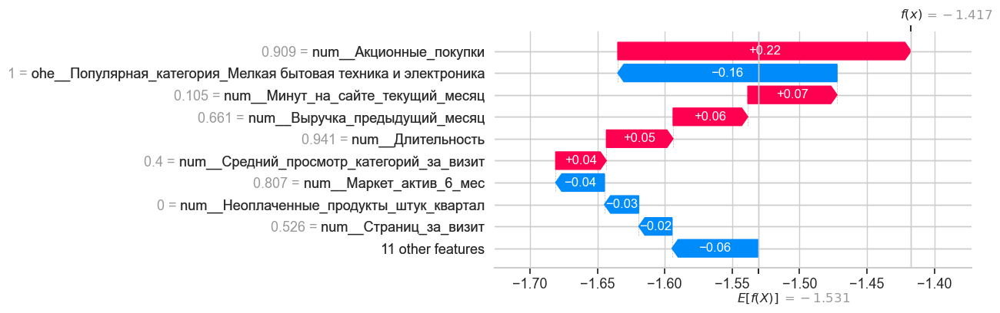

Index: 34


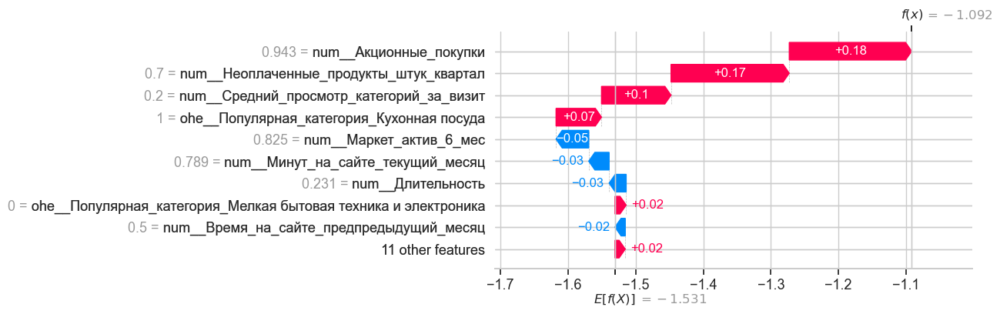

Index: 37


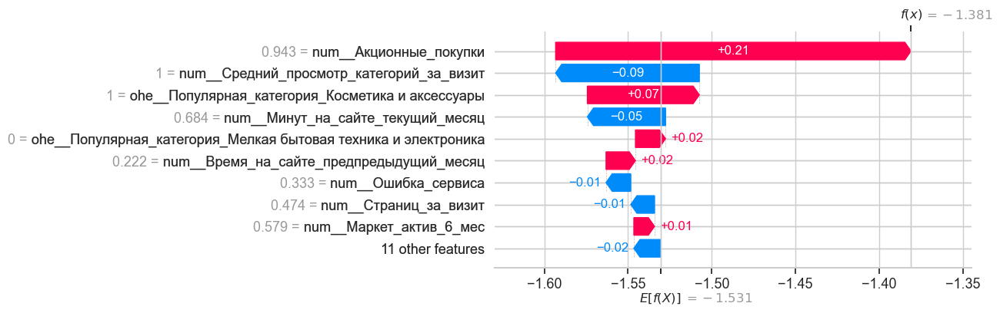

Index: 269


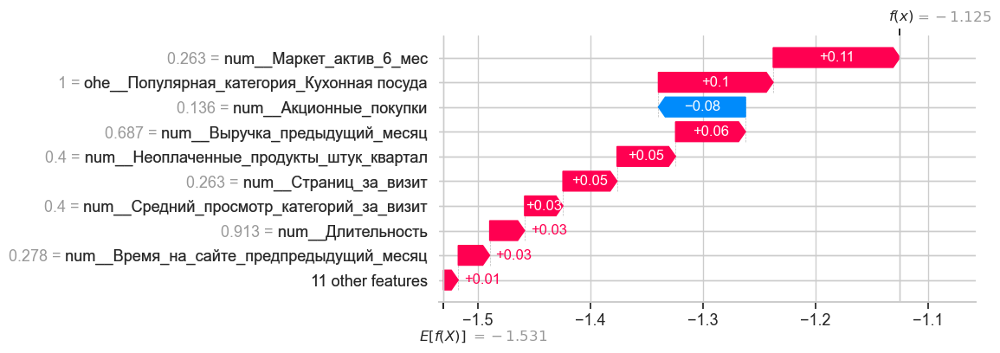

Index: 319


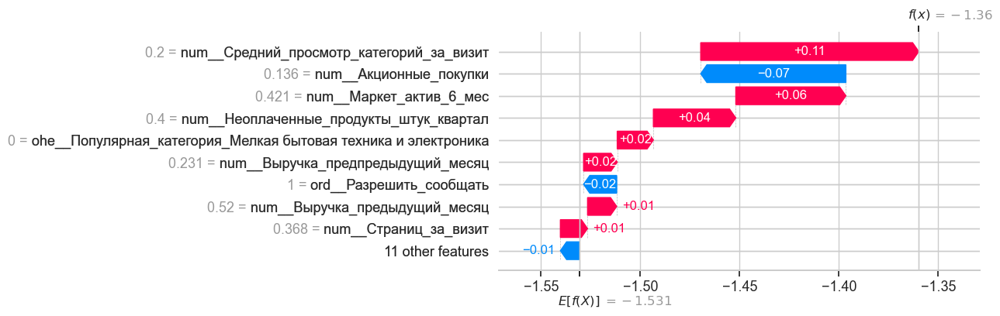

In [90]:
# в отдельную переменную сохраняем индексы ошибочно присвоенных классов 1
index_class_1 = X_test_best.index[(X_test_best['y_test']==0) & (X_test_best['y_pred']==1)].tolist()

# через цикл визуализируем вклады признаков для каждого объекта
for i in index_class_1:
    print('Index:', i)
    fig = plt.figure()
    shap.plots.waterfall(shap_values_pipe[i], show=False)
    plt.gcf().set_size_inches(8, 4)
    plt.show()

**ОБЩИЙ ВЫВОД ПО РАЗДЕЛУ 7 "АНАЛИЗ ВАЖНОСТИ ПРИЗНАКОВ":** 

В разделе 7 по анализу важности признаков были выполнены следующие ключевые действия:

1. **Обучение лучшей модели**: Модель SVC с RBF-ядром была успешно обучена, достигнув высоких показателей качества на тренировочной и тестовой выборках.

2. **Проверка на адекватность**: Сравнение с DummyClassifier подтвердило адекватность выбранной модели.

3. **Анализ матрицы ошибок**: Матрица ошибок позволила оценить характер ошибок модели и выявить потенциал для улучшения.

4. **Поиск оптимального порога классификации**: Исследование различных порогов классификации помогло найти компромисс между точностью и отзывом.

5. **Визуализация гиперплоскостей модели**: Графическое представление гиперплоскостей подтвердило способность модели к выявлению сложных нелинейных границ между классами.

6. **Отбор признаков**: Различные методы отбора признаков выявили ключевые атрибуты, оказывающие наибольшее влияние на модель.

7. **Использование метода SelectKBest**: Этот метод помог определить оптимальное количество признаков для достижения наилучшего баланса между сложностью модели и её способностью к обобщению.

8. **Анализ важности признаков с помощью SHAP**: Использование SHAP-анализа позволило получить дополнительные инсайты о влиянии отдельных признаков на предсказания модели.

**Итоги анализа:**

- **Наименее значимые признаки**: 
    - *Длительность*
    - *Разрешить_сообщать*
    - *Популярная_категория_Мелкая бытовая техника и электроника*
    - *Популярная_категория_Кухонная посуда*
    - *маркет_актив_тек_мес*

- **Самые влиятельные признаки**: 
    - *Страницы_за_визит*
    - *Акционные_покупки*
    - *Время_на_сайте_предыдущий_месяц*
    - *Минут_на_сайте_текущий_месяц*
    - *Неоплаченные_продукты_штук_квартал*

- **При моделировании и принятии бизнес-решений следует учесть:**
    - На покупателей и их покупательскую активность оказывает ощутимое влияние наличие акционных предложений, возможно объём таких предложений стоит расширить. Предложение со скидкой всегда привлекает внимание. Также необходимо улучшать качество сайта, для получения наилучшего пользователского опыта
    - Чем дольше покупатель находится на сайте и чем больше страниц просматривает, тем выше вероятность, что он совершит покупку.
    
**Ключевые признаки, свидетельствующие о снижении активности:**
1. **Акционные покупки**: Высокая доля акционных покупок может указывать на то, что клиенты привлекаются скидками и специальными предложениями. Если активность таких клиентов снижается, это может свидетельствовать о недостаточности привлекательных акций или о насыщении интереса.

2. **Страницы за визит и время на сайте**: Клиенты, проводящие на сайте меньше времени и просматривающие меньшее количество страниц, могут демонстрировать снижение заинтересованности в продуктах. Это важный сигнал к тому, что необходимо улучшать пользовательский интерфейс и контент для повышения вовлеченности.

3. **Неоплаченные продукты в корзине**: Большое количество неоплаченных товаров может указывать на возникновение препятствий на пути к покупке, например, из-за высоких цен, сложностей с оформлением заказа или недостаточной информации о продукте.


**ЗАКЛЮЧЕНИЕ:**
Выводы на основе важности признаков не противоречи заключением из EDA.

## Сегментация покупателей

### Объедение данных с прогнозами

Объеденим DataFrame `df_market` с данными из файла `money.csv` и добавим прогнозы лучшей модели

In [91]:
# Вычисляем вероятность принадлежности каждого объекта из обучающей выборки к положительному классу
y_proba_train = clf_best.predict_proba(X_train_best)[:,1]

# Создадим массив, содержащий предсказанные метки классов для каждого объекта из X_train_best.
y_pred_train = clf_best.predict(X_train_best)

# Объединяем выборки
df_train = pd.concat([X_train, y_train], axis=1)
df_test = pd.concat([X_test, y_test], axis=1)

# Добавление предсказанных вероятностей и классов для обучающего набора данных
df_train['Вероятность'] = y_proba_train.tolist()
df_train['Класс_прогноза'] = y_pred_train.tolist()

# Добавление предсказанных вероятностей и классов для тестового набора данных
df_test['Вероятность'] = y_proba.tolist()
df_test['Класс_прогноза'] = y_pred.tolist()

# Создадим итоговую таблицу с предсказаниями
df_final = pd.concat([df_train, df_test])
df_final.insert(0, 'id', df_market['id'])


df_final['Покупательская_активность'] = label_encoder.inverse_transform(df_final['Покупательская_активность'])
df_final['Класс_прогноза'] = label_encoder.inverse_transform(df_final['Класс_прогноза'])

# Вывод размерности датафреймов до объединения
print("Размеры df_final:", df_final.shape)
print("Размеры df_money:", df_activ[3].shape)

df_market_full = df_final.merge(df_activ[3], on='id', how='left')
# Размеры после первого объединения
print("Размеры после объединения:", df_market_full.shape)
display(df_market_full.info())
df_market_full.head()

Размеры df_final: (1297, 20)
Размеры df_money: (1297, 2)
Размеры после объединения: (1297, 21)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1297 entries, 0 to 1296
Data columns (total 21 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1297 non-null   int64  
 1   Тип_сервиса                          1297 non-null   object 
 2   Разрешить_сообщать                   1297 non-null   object 
 3   Маркет_актив_6_мес                   1297 non-null   float64
 4   Маркет_актив_тек_мес                 1297 non-null   int64  
 5   Длительность                         1297 non-null   int64  
 6   Акционные_покупки                    1297 non-null   float64
 7   Популярная_категория                 1297 non-null   object 
 8   Средний_просмотр_категорий_за_визит  1297 non-null   int64  
 9   Неоплаченные_продукты_штук_квартал   1297 non-null   int64  
 10  О

None

,id,Тип_сервиса,Разрешить_сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,...,Страниц_за_визит,Выручка_предпредыдущий_месяц,Выручка_предыдущий_месяц,Выручка_текущий_месяц,Время_на_сайте_предпредыдущий_месяц,Минут_на_сайте_текущий_месяц,Покупательская_активность,Вероятность,Класс_прогноза,Прибыль
0,215858,стандарт,да,5.5,4,510,0.15,Мелкая бытовая техника и электроника,2,4,...,16,4347.0,5170.5,6014.2,20,6,Прежний уровень,0.099531,Прежний уровень,4.37
1,215361,стандарт,да,5.1,4,199,0.23,Техника для красоты и здоровья,4,5,...,3,4597.0,6400.0,3789.7,11,13,Снизилась,0.897262,Снизилась,4.03
2,215884,стандарт,да,4.3,5,997,0.17,Мелкая бытовая техника и электроника,5,1,...,11,4626.0,4113.0,3798.4,13,10,Прежний уровень,0.080131,Прежний уровень,4.37
3,216563,премиум,да,3.7,3,1057,0.18,Домашний текстиль,4,3,...,9,5169.0,5133.0,5231.8,13,10,Прежний уровень,0.129964,Прежний уровень,3.38
4,215714,стандарт,да,3.8,5,694,0.40,Кухонная посуда,3,7,...,6,4864.0,5854.0,7063.0,13,9,Снизилась,0.961820,Снизилась,4.85


**ВЫВОД**

Данные объедены с прогнозами от лучшей модели и готовы к сегментации покупателей

### Выбор сегмента для анализа

Выбираем группу клиентов с максимальной долей покупок по акции и высокой вероятностью снижения покупательской активности.

In [92]:
fig = px.scatter(df_market_full, x='Вероятность', y='Акционные_покупки', trendline="ols")
fig.update_layout(title='Взаимосвязь между вероятностью снижения покупательской активности и акционными покупками') 
fig.show()

Исходя из графика можем выбрать сегмент, а именно:
- покупатели с максимальной долей покупок по акции **(>0.70)** 
- и высокой вероятностью снижения покупательской активности **(>0.6)**

Другие варианты сегментации покупателей.

In [93]:
fig = px.scatter(df_market_full, x='Вероятность', y='Прибыль', trendline="ols")
fig.update_layout(title='Взаимосвязь между вероятностью снижения покупательской активности и прибылью') 
fig.show()

fig = px.scatter(df_market_full, x='Вероятность', y='Неоплаченные_продукты_штук_квартал', trendline="ols")
fig.update_layout(title='Взаимосвязь между вероятностью снижения покупательской активности и неоплаченными продуктами') 
fig.show()

fig = px.scatter(df_market_full, x='Вероятность', y='Маркет_актив_6_мес', trendline="ols")
fig.update_layout(title='Взаимосвязь между вероятностью снижения покупательской активности и маркетинговой активностью') 
fig.show()

fig = px.scatter(df_market_full, x='Вероятность', y='Страниц_за_визит', trendline="ols")
fig.update_layout(title='Взаимосвязь между вероятностью снижения покупательской активности и количеством посещенных страниц') 
fig.show()

In [94]:
df_segment = df_market_full.query('(Акционные_покупки > 0.7) & (Вероятность > 0.6)')
df_no_segment = df_market_full.query('(Акционные_покупки < 0.7) & (Вероятность < 0.6)')
df_segment.head()

,id,Тип_сервиса,Разрешить_сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,...,Страниц_за_визит,Выручка_предпредыдущий_месяц,Выручка_предыдущий_месяц,Выручка_текущий_месяц,Время_на_сайте_предпредыдущий_месяц,Минут_на_сайте_текущий_месяц,Покупательская_активность,Вероятность,Класс_прогноза,Прибыль
12,215655,стандарт,да,3.9,4,819,0.94,Товары для детей,1,9,...,2,4847.0,4414.0,4909.3,13,10,Снизилась,0.983417,Снизилась,4.01
17,215447,стандарт,да,2.4,5,511,0.94,Товары для детей,3,2,...,3,4677.0,3311.0,3567.1,6,9,Снизилась,0.957549,Снизилась,4.01
21,215382,стандарт,да,4.6,4,330,0.89,Техника для красоты и здоровья,6,2,...,6,4824.0,5545.5,6403.5,15,8,Снизилась,0.769936,Снизилась,2.42
34,215617,стандарт,да,0.9,4,728,0.90,Домашний текстиль,2,3,...,4,4377.0,4798.5,5184.6,10,14,Снизилась,0.981740,Снизилась,3.06
38,215694,премиум,да,5.5,5,982,0.94,Мелкая бытовая техника и электроника,3,1,...,10,5204.0,5118.5,5174.4,18,19,Снизилась,0.658633,Снизилась,2.41


In [95]:
df_segment.info()

<class 'pandas.core.frame.DataFrame'>
Index: 136 entries, 12 to 1294
Data columns (total 21 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   136 non-null    int64  
 1   Тип_сервиса                          136 non-null    object 
 2   Разрешить_сообщать                   136 non-null    object 
 3   Маркет_актив_6_мес                   136 non-null    float64
 4   Маркет_актив_тек_мес                 136 non-null    int64  
 5   Длительность                         136 non-null    int64  
 6   Акционные_покупки                    136 non-null    float64
 7   Популярная_категория                 136 non-null    object 
 8   Средний_просмотр_категорий_за_визит  136 non-null    int64  
 9   Неоплаченные_продукты_штук_квартал   136 non-null    int64  
 10  Ошибка_сервиса                       136 non-null    int64  
 11  Страниц_за_визит                   

**ВЫВОД:**

Было отобрано 136 клиентов

### Аналитическое исследование выбранной группы покупателей

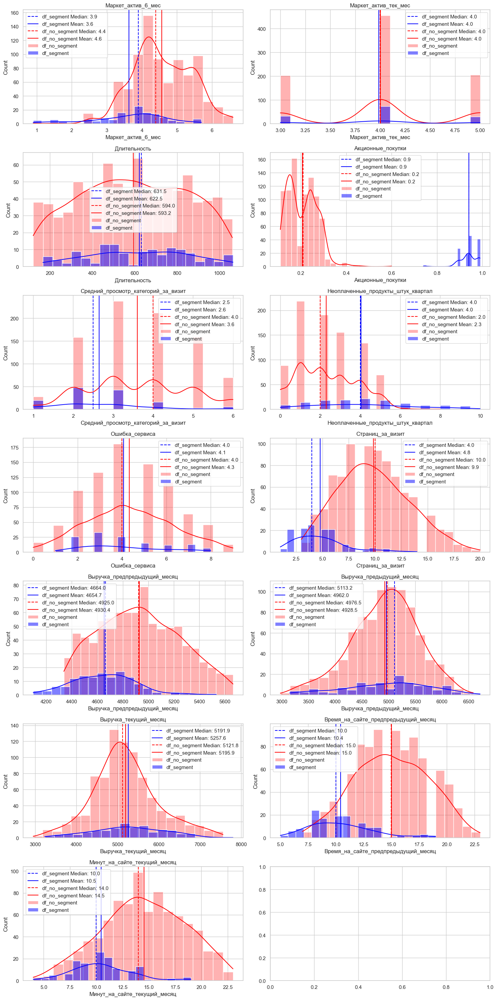

In [96]:
# Создание графика с 6 подграфиками в два столбца
fig, axes = plt.subplots(7, 2, figsize=(15, 30))

# Преобразование 2D массива подграфиков в 1D для удобного индексирования
axes = axes.ravel()

# Построение гистограммы с ядерной оценкой плотности для каждого столбца
for i, column in enumerate(num_columns):
    # Построение гистограммы для второго датафрейма
    sns.histplot(data=df_no_segment[column], bins=20, kde=True, color='red', alpha=0.3, label='df_no_segment', ax=axes[i])
    # Построение гистограммы для первого датафрейма
    sns.histplot(data=df_segment[column], bins=20, kde=True, color='blue', label='df_segment', ax=axes[i])
    axes[i].set_title(column)
    
    # Добавление медианы и среднего значения для первого датафрейма
    median_segment = df_segment[column].median()
    mean_segment = df_segment[column].mean()
    axes[i].axvline(median_segment, color='blue', linestyle='--', label=f'df_segment Median: {median_segment:.1f}')
    axes[i].axvline(mean_segment, color='blue', linestyle='-', label=f'df_segment Mean: {mean_segment:.1f}')

    # Добавление медианы и среднего значения для второго датафрейма
    median_no_segment = df_no_segment[column].median()
    mean_no_segment = df_no_segment[column].mean()
    axes[i].axvline(median_no_segment, color='red', linestyle='--', label=f'df_no_segment Median: {median_no_segment:.1f}')
    axes[i].axvline(mean_no_segment, color='red', linestyle='-', label=f'df_no_segment Mean: {mean_no_segment:.1f}')    
    
    axes[i].legend()

# Показать графики
plt.tight_layout()
plt.show()


Исходя из гистограмм большинство клиентов этой группы приносят среднестатистическую прибыль для компании, при этом сталкиваются с ошибками на сервисе, имеют достаточно высокое количество неплаченых товаров в корзине и в среднем не так много посещают страниц на сайте. Это говорит о том, что клиенты в основном знают, что хотят купить.

**Различия:**
- **Маркетинговая активность**: Видно значительно отстование выбранной группы от остальных пользователей. Необходимо увелечение маркетинговой активности для этих пользователей.
- **Средний просмотр категорий за визит**: Различие могут быть обусловелены, тем что данная группа целеноправлено заходит на сайт зная, что ей купить.
- **Количество неоплаченных продуктов**: В среднем данная группа в вдое раз больше неоплачивает продукты, чем остальные покупатели. Необходим анализ этих продуктов, для того, чтобы конкретизировать проблемы которые могут быть связаны с неоплатой данных продуктов.
- **Страниц за визит**: аналогичное предположение, как у средний просмотр категорий за визит
- **Выручка предпредыдущий и за предыдущий месяц**: Видна разница между выручкой в зависимости от периода. Необходим анализ акций проводимых за эти периоды, так как явно видно, что в разные периоды прибыль либо от этой категории пользователей падает, либо достигает среднего значения для всех пользователей.


**На основе этих выводов можно предложить следующие стратегии для увеличения покупательской активности:**

- **Целевая маркетинговая кампания**: Сфокусировать рекламные усилия на пользователей с низкой маркетинговой активностью, чтобы попытаться повысить их вовлеченность.

- **Персонализация предложений**: Поскольку есть пользователи, которые совершают акционные покупки, можно использовать данные о их предпочтениях для персонализации акций и специальных предложений.

- **Улучшение пользовательского опыта**: Устранение ошибок сервиса и улучшение навигации, чтобы увеличить количество страниц, просмотренных за визит, и длительность пребывания на сайте.

- **Анализ причин возврата**: Учитывая количество неоплаченных продуктов, стоит исследовать причины, по которым покупки не завершаются, и оптимизировать процесс оформления заказа.

- **Анализ выручки**: Изучение динамики выручки за несколько месяцев может помочь понять, какие периоды являются наиболее и наименее прибыльными

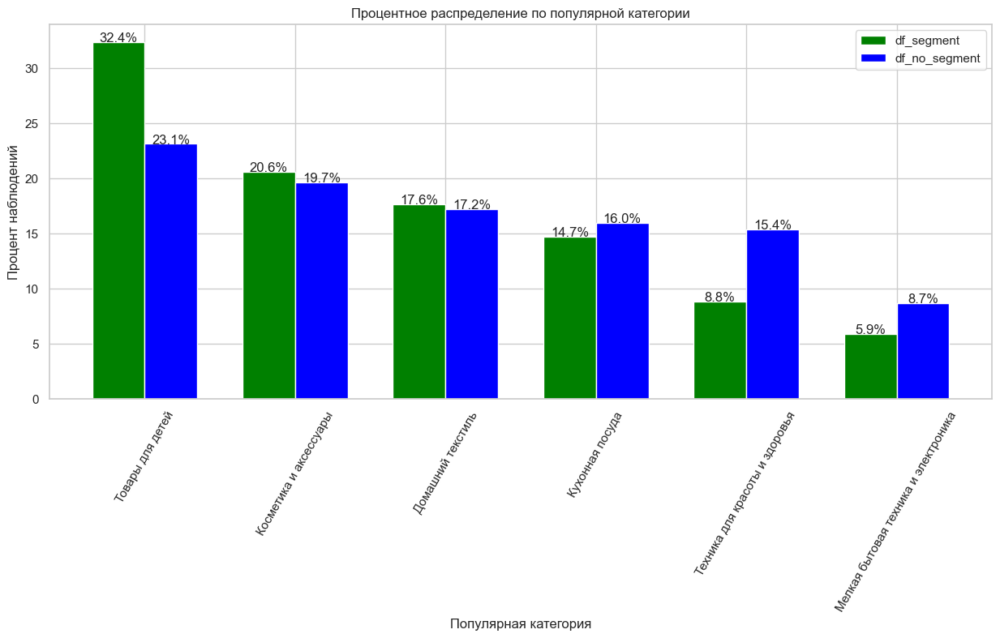

In [97]:
# Подсчет процентного распределения для первого датафрейма (df_segment)
counts_segment = df_segment['Популярная_категория'].value_counts(normalize=True) * 100

# Подсчет процентного распределения для второго датафрейма (df_no_segment)
counts_no_segment = df_no_segment['Популярная_категория'].value_counts(normalize=True) * 100

# Создаем столбчатую диаграмму
plt.figure(figsize=(15, 6))

# Позиции для каждой группы столбцов
x_segment = range(len(counts_segment))
x_no_segment = [x + 0.35 for x in x_segment]

# Построение столбцов для первого датафрейма (df_segment)
plt.bar(x_segment, counts_segment, color='green', width=0.35, label='df_segment')

# Построение столбцов для второго датафрейма (df_no_segment)
plt.bar(x_no_segment, counts_no_segment, color='blue', width=0.35, label='df_no_segment')

# Добавляем текстовые метки к столбцам первого датафрейма
for i in range(len(counts_segment)):
    plt.text(x_segment[i], counts_segment.iloc[i], f"{counts_segment.iloc[i]:.1f}%", ha='center')

# Добавляем текстовые метки к столбцам второго датафрейма
for i in range(len(counts_no_segment)):
    plt.text(x_no_segment[i], counts_no_segment.iloc[i], f"{counts_no_segment.iloc[i]:.1f}%", ha='center')

# Добавляем заголовок и подписи к осям
plt.title('Процентное распределение по популярной категории')
plt.xlabel('Популярная категория')
plt.ylabel('Процент наблюдений')

# Установка меток на оси x
plt.xticks([x + 0.35 / 2 for x in range(len(counts_segment))], counts_segment.index)

# Установка поворота названий категорий на 60 градусов
plt.xticks(rotation=60)

# Добавляем легенду
plt.legend()

plt.show()

In [98]:
# Группировка по категориям и расчет средних значений разницы выручки для каждой категории
df_diff_by_category = df_segment.groupby('Популярная_категория').agg({
    'Выручка_предпредыдущий_месяц': 'mean',
    'Выручка_предыдущий_месяц': 'mean',
    'Выручка_текущий_месяц': 'mean',
}).reset_index()

df_diff_by_category

,Популярная_категория,Выручка_предпредыдущий_месяц,Выручка_предыдущий_месяц,Выручка_текущий_месяц
0,Домашний текстиль,4646.250000,5042.208333,5350.091667
1,Косметика и аксессуары,4663.392857,5213.285714,5549.800000
2,Кухонная посуда,4700.900000,5431.075000,5806.645000
3,Мелкая бытовая техника и электроника,4882.125000,5293.125000,5658.262500
4,Техника для красоты и здоровья,4628.916667,4473.125000,4820.266667
5,Товары для детей,4598.409091,4618.125000,4818.118182


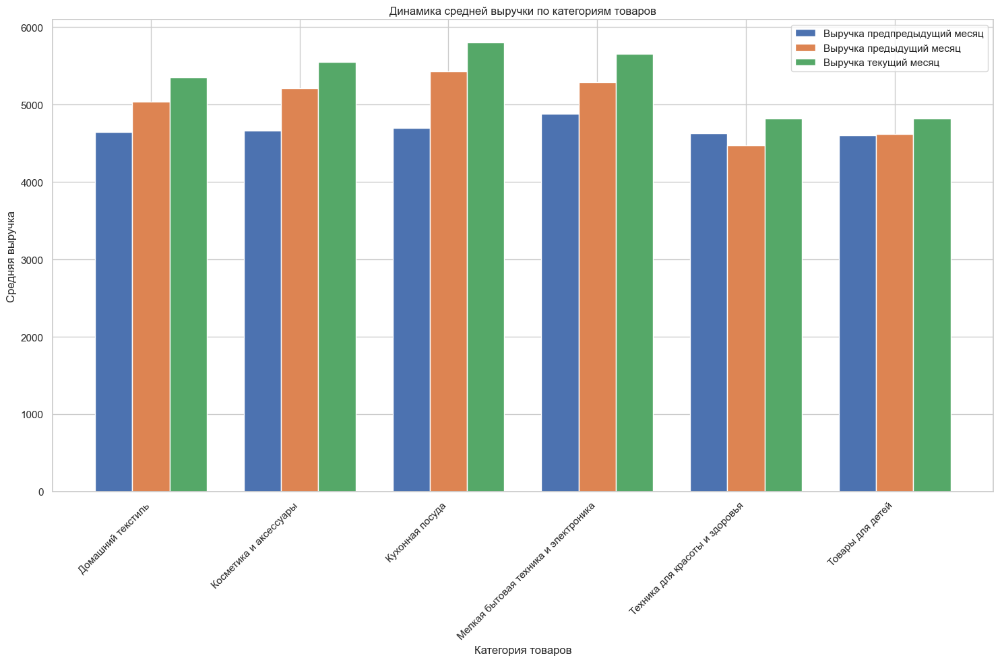

In [99]:
categories = df_diff_by_category['Популярная_категория']

# Построение столбчатой диаграммы для визуализации динамики средней выручки по категориям товаров
fig, ax = plt.subplots(figsize=(15, 10))

# Индексы для каждой категории
index_diff = np.arange(len(categories))

# Построение столбцов для каждого месяца
bars1 = ax.bar(index_diff, df_diff_by_category['Выручка_предпредыдущий_месяц'], 0.25, label='Выручка предпредыдущий месяц')
bars2 = ax.bar(index_diff + 0.25, df_diff_by_category['Выручка_предыдущий_месяц'], 0.25, label='Выручка предыдущий месяц')
bars3 = ax.bar(index_diff + 0.5, df_diff_by_category['Выручка_текущий_месяц'], 0.25, label='Выручка текущий месяц')

# Добавление подписей и заголовка
ax.set_xlabel('Категория товаров')
ax.set_ylabel('Средняя выручка')
ax.set_title('Динамика средней выручки по категориям товаров')
ax.set_xticks(index_diff + 0.25)
ax.set_xticklabels(categories, rotation=45, ha="right")
ax.legend()

plt.tight_layout()
plt.show()


1. В каждой категории товаров наблюдается постепенное увеличение средней выручки от предпредыдущего месяца к текущему. Это указывает на общий тренд роста выручки во всех представленных категориях.


2. Категория ***"Кухонная посуда"*** показывает наибольший рост средней выручки от предпредыдущего к текущему месяцу, что может свидетельствовать о высокой популярности этих товаров или успешных маркетинговых кампаниях.


3. Категории ***"Техника для красоты и здоровья"*** и ***"Товары для детей"*** демонстрируют более умеренный рост выручки по сравнению с другими категориями. Это может указывать на то, что продукты в этих категориях не в полной мере удовлетворяют текущие потребности или предпочтения целевой аудитории, либо конкуренция в этих сегментах рынка особенно высока.

В связи с этим, компании, возможно, стоит переосмыслить и изменить свою маркетинговую стратегию для этих категорий товаров. В частности, может быть целесообразно ввести специальные акции, скидки, или предложения, направленные на увеличение интереса к этим категориям среди этих потребителей. Это может включать в себя лимитированные предложения, бонусные программы для повторных покупок, улучшение условий доставки, или даже введение эксклюзивных товаров, доступных только в ограниченный период времени.

Также стоит обратить внимание на разработку и внедрение целевых рекламных кампаний, которые могли бы лучше донести до потребителей информацию о преимуществах и уникальных характеристиках товаров в этих категориях. Важно также исследовать отзывы и предпочтения клиентов относительно этих категорий товаров, чтобы адаптировать продуктовое предложение и маркетинговые сообщения к изменяющимся требованиям рынка.

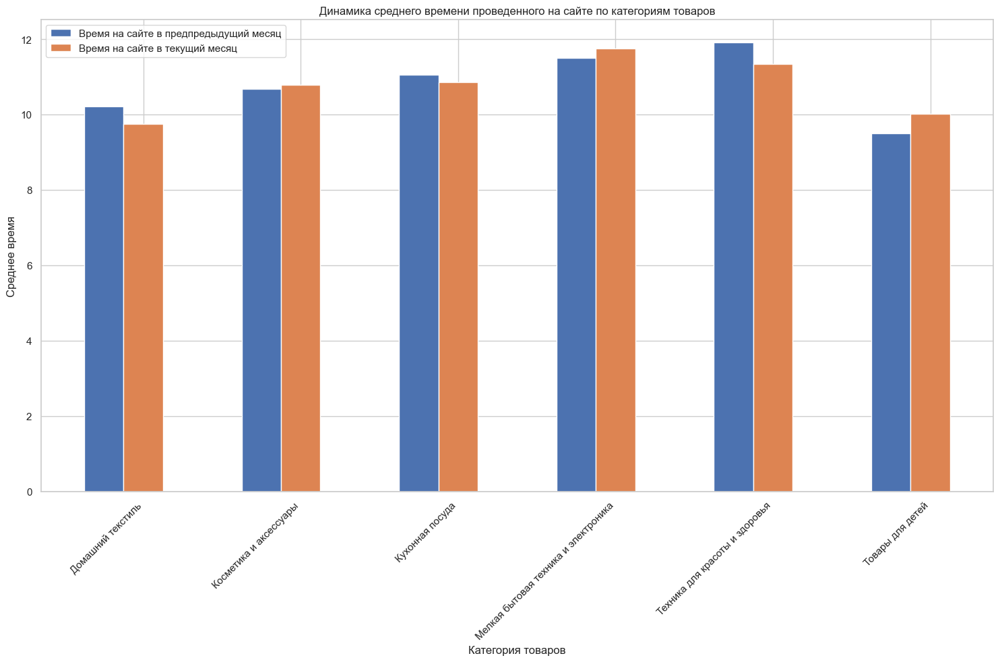

In [100]:
df_time_by_category = df_segment.groupby('Популярная_категория').agg({
    'Минут_на_сайте_текущий_месяц': 'mean',
    'Время_на_сайте_предпредыдущий_месяц': 'mean',
}).reset_index()

# Построение столбчатой диаграммы для визуализации динамики средней выручки по категориям товаров
fig, ax = plt.subplots(figsize=(15, 10))

# Индексы для каждой категории
index_time = np.arange(len(categories))

# Построение столбцов для каждого месяца
bars3 = ax.bar(index_time, df_time_by_category['Время_на_сайте_предпредыдущий_месяц'], 0.25, 
               label='Время на сайте в предпредыдущий месяц')
bars4 = ax.bar(index_time + 0.25, df_time_by_category['Минут_на_сайте_текущий_месяц'], 0.25, 
               label='Время на сайте в текущий месяц')

# Добавление подписей и заголовка
ax.set_xlabel('Категория товаров')
ax.set_ylabel('Среднее время')
ax.set_title('Динамика среднего времени проведенного на сайте по категориям товаров')
ax.set_xticks(index_time + 0.25)
ax.set_xticklabels(categories, rotation=45, ha="right")
ax.legend()

plt.tight_layout()
plt.show()

Основываясь на визуализации данных, можно сделать следующие выводы:

- Категории "Домашний текстиль", "Кухонная посуда" и "Техника для красоты и здоровья" показывают уменьшение времени, проведённого на сайте, что может свидетельствовать о низкой вовлечённости клиентов в эти категории.

Важно отметить, что большее время, проведённое на сайте, не всегда напрямую связано с увеличением продаж. Возможно, это также может указывать на некоторые проблемы с удобством использования сайта, которые требуют дополнительного времени для решения. Однако, если рост времени проведения на сайте коррелирует с увеличением конверсии и продаж, это может рассматриваться как положительный сигнал.

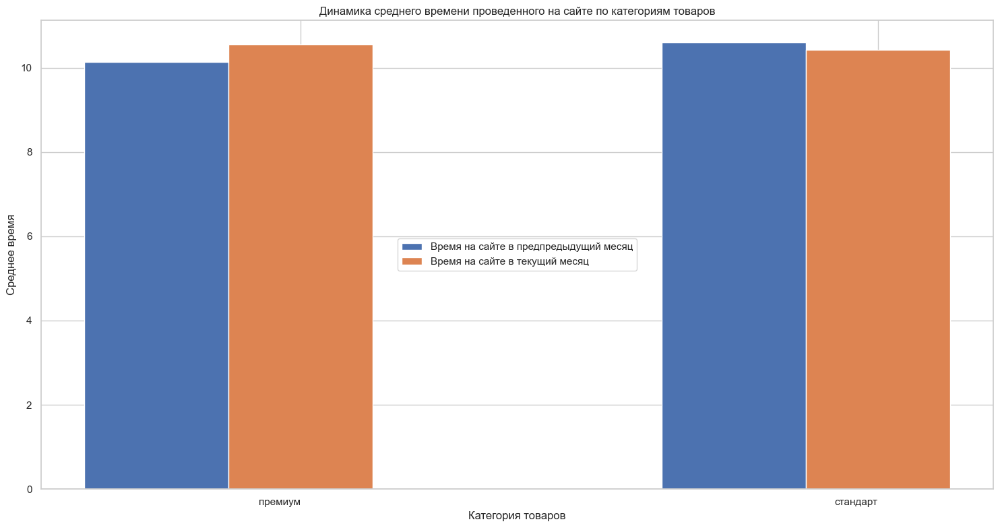

In [101]:
df_sub_by_category = df_segment.groupby('Тип_сервиса').agg({
    'Минут_на_сайте_текущий_месяц': 'mean',
    'Время_на_сайте_предпредыдущий_месяц': 'mean',
}).reset_index()

categories_sub = df_sub_by_category['Тип_сервиса']

# Построение столбчатой диаграммы для визуализации динамики средней выручки по категориям товаров
fig, ax = plt.subplots(figsize=(15, 8))

# Индексы для каждой категории
index_sub = np.arange(len(categories_sub))

# Построение столбцов для каждого месяца
bars5 = ax.bar(index_sub, df_sub_by_category['Время_на_сайте_предпредыдущий_месяц'], 0.25, 
               label='Время на сайте в предпредыдущий месяц')
bars6 = ax.bar(index_sub + 0.25, df_sub_by_category['Минут_на_сайте_текущий_месяц'], 0.25, 
               label='Время на сайте в текущий месяц')

# Добавление подписей и заголовка
ax.set_xlabel('Категория товаров')
ax.set_ylabel('Среднее время')
ax.set_title('Динамика среднего времени проведенного на сайте по категориям товаров')
ax.set_xticks(index_sub + 0.25)
ax.set_xticklabels(categories_sub, ha='right')
ax.legend(loc='center')

plt.tight_layout()
plt.show()

Для типа подписки "стандарт" мы наблюдаем понижение времени проведенного на сайте. Это может быть индикатором того, что для удержания пользователей премиум сервиса необходимо предлагать дополнительные привилегии или услуги, улучшая их пользовательский опыт, чтобы повысить их вовлеченность и время, проведённое на сайте.

Наибольшее число покупок приходится на товары категории: Товары для детей. Также видно, что в процентном соотношении данная группа больше акцентирована на покупку товаров для детей.

In [102]:
df_segment.groupby('Тип_сервиса', as_index=False)[[
    'Маркет_актив_6_мес',
    'Маркет_актив_тек_мес',
    'Длительность'
]].mean()

,Тип_сервиса,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность
0,премиум,3.660000,3.940000,715.020000
1,стандарт,3.618605,4.011628,568.651163


В целом маркетинговая активность сбаланирована от типо сервиса.

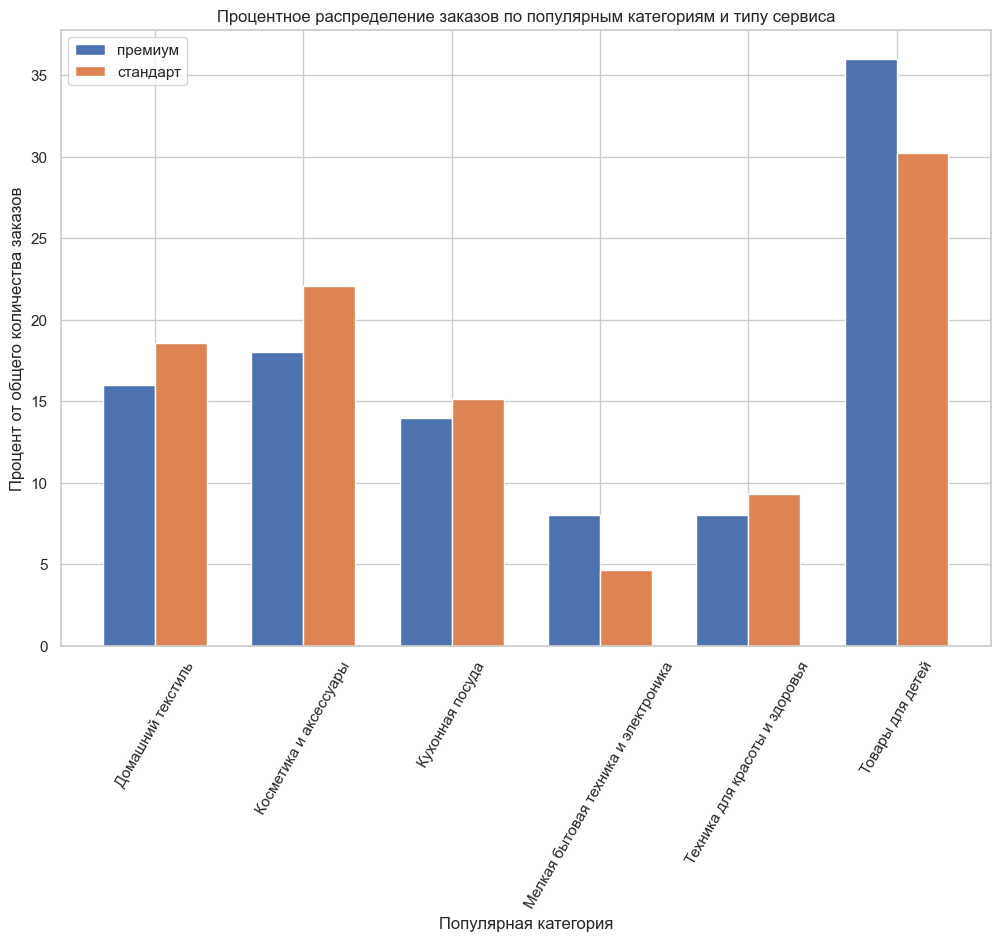

In [103]:
# Сгруппируем данные
grouped_data3 = df_segment.groupby(['Тип_сервиса', 'Популярная_категория'], as_index=False)['id'].count()

# Вызов функций для отображения графиков
plot_grouped_data(
    grouped_data3, 
    'Популярная категория', 
    'Процент от общего количества заказов', 
    'Процентное распределение заказов по популярным категориям и типу сервиса'
)

**ОБЩИЙ ВЫВОД ПО РАЗДЕЛУ 8 "СЕГМЕНТАЦИЯ ПОКУПАТЕЛЕЙ":** 

В разделе 8 по сегментации покупателей были выполнены следующие ключевые действия:

**Объединение данных с прогнозами:**
Данные были успешно объединены с прогнозами лучшей модели, что позволяет перейти к сегментации покупателей и дальнейшему анализу.

**Выбор сегмента для анализа:**
Выбран сегмент клиентов с высокой долей акционных покупок и высокой вероятностью снижения покупательской активности. Такой сегмент представляет собой клиентов, которые активно реагируют на акции, но у которых есть риск снижения активности без дополнительного воздействия.

**Аналитическое исследование выбранной группы покупателей:**
Исследование показало, что в этом сегменте многие клиенты сталкиваются с ошибками на сайте и имеют высокую долю неоплаченных товаров в корзине, что может свидетельствовать о проблемах с пользовательским опытом или процессом покупки.

**Маркетинговые предложения:**
1. **Целевые маркетинговые кампании:** Увеличение маркетинговой активности для этой группы с помощью персонализированных акций и предложений, нацеленных на повышение их вовлеченности и интереса к продуктам.

2. **Персонализация предложений:** Использование данных о покупках в категории "Товары для детей" для создания персонализированных предложений и улучшения ассортимента.

3. **Улучшение пользовательского опыта:** Высокое количество неоплаченных продуктов требует анализа причин, почему продукты добавляются в корзину, но не покупаются. Это может включать исследование удобства платёжной системы, ценообразования и доступности продуктов. Исправление ошибок на сайте и оптимизация процесса покупки для снижения количества неоплаченных товаров.

4. **Анализ и оптимизация маркетинговой стратегии:** Оценка маркетинговых активностей за последние 6 месяцев и корректировка стратегии в соответствии с поведением покупателей. Аналогичные действия могут быть применены на основе анализа количества страниц за визит, что также может указывать на целенаправленный поиск, и это поведение можно использовать для улучшения рекомендаций. 

5. **Анализ выручки и акций:** Изучение динамики выручки и проведение анализа проводимых акций, чтобы понять их влияние на покупательскую активность и прибыль. Наконец, анализируя изменения выручки в зависимости от времени, можно выявить тенденции и факторы, влияющие на покупательскую активность, включая сезонные акции, тренды и предпочтения потребителей. На основе этих данных можно скорректировать маркетинговую стратегию и предложения для увеличения выручки.

6. **Тренды роста выручки по категориям:** Общий тренд роста выручки во всех категориях товаров с упором на категорию "Кухонная посуда" указывает на успешность текущих маркетинговых стратегий и популярность этих товаров среди потребителей. Однако умеренный рост в категориях "Техника для красоты и здоровья" и "Товары для детей" требует дополнительного анализа потребностей и предпочтений целевой аудитории, а также рассмотрения возможности усиления маркетинговых усилий или изменения ассортимента для стимулирования продаж.

7. **Разработка и внедрение целевых маркетинговых кампаний:** Специальные акции, скидки, и предложения, направленные на увеличение интереса к менее популярным категориям, могут помочь улучшить вовлечённость и продажи. Важно также сосредоточить внимание на разработке и внедрении целевых рекламных кампаний, которые подчеркивают уникальные характеристики и преимущества товаров в этих категориях, а также исследовать отзывы и предпочтения клиентов для адаптации предложений.

**Выводы:**
Выбранный для анализа сегмент представляет клиентов, потенциально подверженных снижению покупательской активности. Стратегии, направленные на увеличение активности, должны включать улучшение пользовательского опыта и персонализацию предложений, особенно в контексте категории "Товары для детей", которая выделяется в данном сегменте. Улучшение маркетинговой стратегии и анализ причин неоплаты товаров станут ключом к повышению активности этой группы покупателей.

## Итоговые выводы

### Заключение

**Поставленная задача:**

Анализ потребительского поведения для выявления факторов, влияющих на покупательскую активность и выбор оптимальной стратегии взаимодействия с клиентами. Цель — повышение покупательской активности и оптимизация маркетинговых стратегий. 

**Этапы**
- Подготовить имеющиеся данные для обучения
- Разработать  модель, которая предскажет вероятность снижения покупательской активности 
- Выделить сегмент покупателей и разработать персонализированные предложения, чтобы увеличить их покупательскую активность
    
**РЕАЛИЗАЦИЯ ПРОЕКТА**

1. **Загрузка и первичный обзор данных:**
   - Были импортированы необходимые библиотеки для работы с данными и визуализации.
   - Данные успешно загружены из четырёх csv-файлов с информацией о поведении покупателей на сайте, их коммуникациях, продуктовом поведении и финансовой активности.
   - Проведен первичный анализ типов данных и отсутствие пропусков в данных, что свидетельствует о высоком качестве информации.
   - Было проведено переименование столбцов для соответствия стилю и удобства работы с данными.
   - Визуальный анализ распределений значений признаков позволил выявить потенциальные аномалии.

2. **Предобработка данных:**
   - Проверка на наличие ошибок и дубликатов показала отсутствие явных дубликатов, но выявлены и исправлены неявные дубликаты и ошибки в текстовых столбцах.
   - Аномальные значения были скорректированы для обеспечения точности данных.
   - Визуализация данных подтвердила отсутствие аномалий в количественных параметрах.

3. **Исследовательский анализ данных:**
   - Был проведен комплексный анализ клиентской базы и их взаимодействия с сервисом, выявлены ключевые аспекты и поведенческие паттерны.
   - Категориальный анализ подтвердил популярность определенных товаров и различия в поведении клиентов с разными типами услуг.
   - Отбор активных клиентов улучшил качество данных для дальнейшего анализа и стратегического планирования.

4. **Объединение таблиц:**
   - Было успешно выполнено объединение различных датафреймов в один общий, содержащий всю необходимую информацию для анализа и построения моделей.
   - Данные в итоговой таблице были структурированы и подготовлены для аналитической работы без пропущенных значений в ключевых столбцах.

В целом, проведенные шаги по загрузке, предобработке, исследовательскому анализу данных и их объединению позволили создать надежную базу для дальнейшего анализа и разработки стратегий взаимодействия с клиентами. Полученные результаты предоставляют ценную информацию для улучшения сервиса и увеличения прибыли компании.

5. **Корреляционный анализ:**
   - Применяя метод философии Крамера (𝜙𝐾), мы провели анализ корреляции между различными признаками данных.
   - Была выявлена высокая корреляция между выручкой за разные периоды, что может указывать на её стабильность или последовательность покупок клиентов во времени.
   - Также были обнаружены высокие корреляции между покупательской активностью и количеством просмотренных страниц на сайте, а также между покупательской активностью и временем, проведенным на сайте. Это указывает на то, что более активные клиенты склонны проводить больше времени на сайте и просматривать больше страниц.
   - Существует также заметная связь между покупательской активностью и маркетинговой активностью за последние 6 месяцев, что указывает на влияние маркетинговых усилий на поведение клиентов.
   - При анализе классов целевой переменной выявлено, что с уменьшением покупательской активности наблюдаются более сильные корреляции между некоторыми признаками, что может свидетельствовать о изменении поведения клиентов в зависимости от активности.

6. **Использование пайплайнов:**
   - В разделе использования пайплайнов мы провели комплексную обработку данных и обучение моделей машинного обучения.
   - Применяя стратифицированное разделение данных на обучающую и тестовую выборки, мы гарантировали сохранение распределения целевой переменной.
   - Применение различных методов предобработки данных (кодирование категориальных признаков, масштабирование числовых признаков) было осуществлено с использованием пайплайнов.
   - После подготовки данных были обучены различные модели машинного обучения с использованием GridSearchCV для поиска оптимальных гиперпараметров.
   - Наилучшей моделью оказалась SVC с параметром регуляризации C=1 и ядром rbf, которая показала высокую метрику ROC-AUC как на обучающей, так и на тестовой выборках.
   
Итоговый анализ корреляций и использование пайплайнов позволили не только выявить взаимосвязи между различными признаками данных, но и построить эффективную модель для классификации данных, что имеет важное значение для разработки стратегий взаимодействия с клиентами и увеличения прибыли компании.


7. **Анализ важности признаков:**
В разделе 7 "Анализ важности признаков" были проведены важные шаги по пониманию того, какие атрибуты играют наиболее значимую роль в прогнозировании целевого признака. Важно отметить, что это позволяет более точно настраивать модель и оптимизировать её производительность. 

- **Наиболее важные признаки:**
   - Количество страниц за визит.
   - Акционные покупки.
   - Время, проведенное на сайте в предыдущем месяце.
   - Количество минут на сайте в текущем месяце.
   - Количество неоплаченных продуктов за квартал.

Эти признаки имеют наибольший вклад в прогнозирование целевого признака и могут использоваться для оптимизации бизнес-стратегии.

- **Наименее важные признаки:**
   - Длительность.
   - Разрешить сообщать.
   - Популярная категория "Мелкая бытовая техника и электроника".
   - Популярная категория "Кухонная посуда".
   - Маркетинговая активность в текущем месяце.

Эти признаки имеют относительно малый вклад в прогнозирование целевого признака и могут быть менее значимы для бизнес-стратегии.

- **Выводы:**
   - Покупательское поведение, такое как активность на сайте и участие в акциях, имеет решающее значение для предсказания покупок клиентов.
   - Некоторые атрибуты, такие как маркетинговая активность в текущем месяце, могут оказывать влияние, но их вклад незначителен по сравнению с другими факторами.
   - При разработке стратегии следует сосредоточиться на увеличении взаимодействия с сайтом и создании привлекательных акций для клиентов.

Эти выводы предоставляют ценную информацию для дальнейшего улучшения модели и оптимизации бизнес-процессов.

8. **"Сегментация покупателей**

- **Выбор сегмента для анализа:**
   - Определение сегмента с высокой долей акционных покупок и вероятностью снижения покупательской активности было стратегически важным. Этот сегмент представляет клиентов, которые реагируют на акции, но могут потенциально перестать быть активными без дополнительных стимулов.

- **Анализ выбранной группы покупателей:**
   - Обнаружение проблем с пользовательским опытом, таких как ошибки на сайте и высокая доля неоплаченных товаров в корзине, подчеркивает необходимость улучшения процесса покупки и пользовательского интерфейса для этой группы клиентов.

- **Маркетинговые предложения:**
   - Персонализированные акции и предложения могут стимулировать активность этой группы покупателей. Особое внимание стоит уделить категории "Товары для детей", которая имеет большое значение для данного сегмента.

- **Улучшение пользовательского опыта:**
   - Анализ причин неоплаты товаров и решение проблем с пользовательским опытом, такими как улучшение платежной системы и исправление ошибок на сайте, помогут снизить количество неоплаченных товаров и повысить удовлетворенность клиентов.

- **Оптимизация маркетинговой стратегии:**
   - Регулярный анализ выручки и эффективности проводимых акций позволит адаптировать маркетинговую стратегию под изменяющиеся потребности и предпочтения покупателей.

- **Выводы:**
   - Сегментация покупателей и анализ их поведения позволяют определить индивидуальные потребности и предпочтения групп клиентов. Это позволяет разработать персонализированные стратегии маркетинга и обслуживания, направленные на увеличение лояльности клиентов и повышение прибыли компании.

### Портрет уходящего клиента

Для создания портрета уходящего клиента и предоставления конкретных рекомендаций бизнесу, необходимо подвести итоги проведенного анализа и выделить ключевые характеристики, которые чаще всего встречаются у клиентов с снижением активности. Исходя из проведенного исследовательского анализа данных (EDA), мы можем выделить несколько основных наблюдений:

**Характеристики уходящего клиента:**
1. **Маркетинговые взаимодействия**: Клиенты, которые имеют меньше взаимодействий с маркетинговыми коммуникациями компании, склонны к снижению активности. Это может указывать на недостаточное вовлечение или интерес к предложениям.
   
2. **Акционные покупки**: Клиенты, большая часть покупок которых приходится на акционные товары (свыше 80% от общего числа покупок), также демонстрируют тенденцию к снижению активности. Это говорит о возможной ориентированности на скидки и специальные предложения.

3. **Неоплаченные товары в корзине**: Наличие более 5 неоплаченных товаров в корзине является сильным индикатором снижения покупательской активности, что может свидетельствовать о потере интереса или недовольстве ценами или ассортиментом.

4. **Ограниченный просмотр категорий**: Клиенты, просматривающие малое количество категорий товаров, также склонны к снижению активности. Это может указывать на узкие предпочтения или недостаточное знакомство с полным ассортиментом.

**Рекомендации для бизнеса:**
1. **Усилить взаимодействие**: Увеличить количество маркетинговых коммуникаций с акцентом на персонализацию предложений, чтобы повысить интерес и вовлеченность клиентов.

2. **Анализ акционных покупателей**: Провести дополнительный анализ поведения клиентов, ориентированных на акции, и разработать стратегии для привлечения их внимания к регулярному ассортименту.

3. **Оптимизация корзины**: Анализировать причины наличия неоплаченных товаров в корзине и разработать стратегии для снижения их количества, например, через улучшение UX/UI корзины или предложение дополнительных скидок при оформлении заказа.

4. **Расширение знаний о товарах**: Стимулировать клиентов к исследованию различных категорий товаров через рекомендации, обзоры и тематические акции, чтобы расширить их интересы и повысить вероятность покупок.

Эти рекомендации могут быть дополнены детальным анализом каждого сегмента клиентов для разработки более персонализированных стратегий удержания и повышения лояльности.